In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [190]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import skew


In [767]:
file_path = "/content/drive/MyDrive/Warehouse_and_Retail_Sales.csv"
df = pd.read_csv(file_path)
print("Shape:", df.shape)
df.head()


Shape: (307645, 9)


,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES,RETAIL TRANSFERS,WAREHOUSE SALES
0,2020,1,REPUBLIC NATIONAL DISTRIBUTING CO,100009,BOOTLEG RED - 750ML,WINE,0.00,0.0,2.0
1,2020,1,PWSWN INC,100024,MOMENT DE PLAISIR - 750ML,WINE,0.00,1.0,4.0
2,2020,1,RELIABLE CHURCHILL LLLP,1001,S SMITH ORGANIC PEAR CIDER - 18.7OZ,BEER,0.00,0.0,1.0
3,2020,1,LANTERNA DISTRIBUTORS INC,100145,SCHLINK HAUS KABINETT - 750ML,WINE,0.00,0.0,1.0
4,2020,1,DIONYSOS IMPORTS INC,100293,SANTORINI GAVALA WHITE - 750ML,WINE,0.82,0.0,0.0


In [768]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307645 entries, 0 to 307644
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   YEAR              307645 non-null  int64  
 1   MONTH             307645 non-null  int64  
 2   SUPPLIER          307478 non-null  object 
 3   ITEM CODE         307645 non-null  object 
 4   ITEM DESCRIPTION  307645 non-null  object 
 5   ITEM TYPE         307644 non-null  object 
 6   RETAIL SALES      307642 non-null  float64
 7   RETAIL TRANSFERS  307645 non-null  float64
 8   WAREHOUSE SALES   307645 non-null  float64
dtypes: float64(3), int64(2), object(4)
memory usage: 21.1+ MB


In [769]:
for col in ['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']:
    # Replace 0 with NaN only if zeros are not real
    df[col] = df[col].replace(0, np.nan)
for col in ['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']:
    df.loc[df[col] < 0, col] = np.nan

In [770]:
df['RETAIL SALES'] = df['RETAIL SALES'].apply(lambda x: np.nan if x < 0 else x)

In [771]:
missing = df.isnull().sum().sort_values(ascending=False)
missing


,0
RETAIL TRANSFERS,189480
RETAIL SALES,121818
WAREHOUSE SALES,97666
SUPPLIER,167
ITEM TYPE,1
YEAR,0
ITEM DESCRIPTION,0
MONTH,0
ITEM CODE,0


In [772]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
import numpy as np

# Step 1: Replace invalid values (negatives) with NaN
for col in ['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']:
    df[col] = df[col].apply(lambda x: np.nan if pd.notnull(x) and x < 0 else x)

# Step 2: Select numerical columns for imputation
num_cols = ['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES', 'YEAR', 'MONTH']

# Step 3: Apply Iterative Imputer with RandomForest
imputer = IterativeImputer(
    estimator=RandomForestRegressor(n_estimators=20, random_state=42),
    max_iter=10,
    random_state=42
)

df_imputed = pd.DataFrame(imputer.fit_transform(df[num_cols]), columns=num_cols)

# Step 4: Replace back in original DataFrame
df[num_cols] = df_imputed

# Optional: Categorical fallback
df['SUPPLIER'].fillna('Unknown', inplace=True)
df['ITEM TYPE'].fillna(df['ITEM TYPE'].mode()[0], inplace=True)

# Step 5: Confirm it's clean
print(df[num_cols].isnull().sum())


RETAIL SALES        0
RETAIL TRANSFERS    0
WAREHOUSE SALES     0
YEAR                0
MONTH               0
dtype: int64


In [773]:
print(df.columns.tolist())


['YEAR', 'MONTH', 'SUPPLIER', 'ITEM CODE', 'ITEM DESCRIPTION', 'ITEM TYPE', 'RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']


In [774]:
# Total NaNs
print("Total NaNs in RETAIL SALES:", df['RETAIL SALES'].isna().sum())

# Check which ITEM CODEs still have NaNs
na_groups = df[df['RETAIL SALES'].isna()].groupby('ITEM CODE').size()
print("Groups with NaNs:")
print(na_groups)


Total NaNs in RETAIL SALES: 0
Groups with NaNs:
Series([], dtype: int64)


In [775]:
df[['RETAIL TRANSFERS']].value_counts().head(5)


,count
RETAIL TRANSFERS,
1.0,71452
2.0,14428
3.0,8560
4.0,6571
5.0,5306


In [776]:
df['RETAIL SALES'].nunique()


16841

In [777]:
print("NaNs in RETAIL SALES:", df['RETAIL SALES'].isna().sum())


NaNs in RETAIL SALES: 0


In [778]:
df

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES,RETAIL TRANSFERS,WAREHOUSE SALES
0,2020.0,1.0,REPUBLIC NATIONAL DISTRIBUTING CO,100009,BOOTLEG RED - 750ML,WINE,1.163500,1.716667,2.000
1,2020.0,1.0,PWSWN INC,100024,MOMENT DE PLAISIR - 750ML,WINE,1.174709,1.000000,4.000
2,2020.0,1.0,RELIABLE CHURCHILL LLLP,1001,S SMITH ORGANIC PEAR CIDER - 18.7OZ,BEER,0.861634,1.000000,1.000
3,2020.0,1.0,LANTERNA DISTRIBUTORS INC,100145,SCHLINK HAUS KABINETT - 750ML,WINE,0.861634,1.000000,1.000
4,2020.0,1.0,DIONYSOS IMPORTS INC,100293,SANTORINI GAVALA WHITE - 750ML,WINE,0.820000,1.600000,4.025
...,...,...,...,...,...,...,...,...,...
307640,2020.0,9.0,LEGENDS LTD,99753,DUTCHESS DE BOURGOGNE NR - 750ML,BEER,2.371000,4.341667,5.000
307641,2020.0,9.0,ANHEUSER BUSCH INC,9997,HOEGAARDEN 4/6NR - 12OZ,BEER,66.120000,37.000000,240.750
307642,2020.0,9.0,COASTAL BREWING COMPANY LLC,99970,DOMINION OAK BARREL STOUT 4/6 NR - 12OZ,BEER,2.250000,2.484000,12.800
307643,2020.0,9.0,BOSTON BEER CORPORATION,99990,SAM ADAMS SUMMER VARIETY 12PK NR,BEER,20.500000,22.550000,549.933


In [779]:
df[['RETAIL TRANSFERS']].value_counts().head(5)

,count
RETAIL TRANSFERS,
1.0,71452
2.0,14428
3.0,8560
4.0,6571
5.0,5306


In [780]:
# Recheck to confirm
df.isnull().sum()


,0
YEAR,0
MONTH,0
SUPPLIER,0
ITEM CODE,0
ITEM DESCRIPTION,0
ITEM TYPE,0
RETAIL SALES,0
RETAIL TRANSFERS,0
WAREHOUSE SALES,0


In [781]:
df['RETAIL SALES']

,RETAIL SALES
0,1.163500
1,1.174709
2,0.861634
3,0.861634
4,0.820000
...,...
307640,2.371000
307641,66.120000
307642,2.250000
307643,20.500000


In [782]:
df.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
YEAR,307645.0,NaN,NaN,NaN,2018.438525,1.083061,2017.0,2017.0,2019.0,2019.0,2020.0
MONTH,307645.0,NaN,NaN,NaN,6.423862,3.461812,1.0,3.0,7.0,9.0,12.0
SUPPLIER,307645,397,REPUBLIC NATIONAL DISTRIBUTING CO,20995,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ITEM CODE,307645,34056,100749,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ITEM DESCRIPTION,307645,34822,BURGANS ALBARINO - 750ML,44,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ITEM TYPE,307645,8,WINE,187641,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RETAIL SALES,307645.0,NaN,NaN,NaN,7.750127,30.98381,0.01,0.65,1.154542,4.09,2739.0
RETAIL TRANSFERS,307645.0,NaN,NaN,NaN,8.837362,30.508312,0.04,1.025,1.933333,5.896,1990.83
WAREHOUSE SALES,307645.0,NaN,NaN,NaN,54.425488,321.371508,0.08,2.0,5.0,14.6,18317.0


In [783]:
df.nunique().sort_values(ascending=False)


,0
ITEM DESCRIPTION,34822
ITEM CODE,34056
WAREHOUSE SALES,26230
RETAIL SALES,16841
RETAIL TRANSFERS,10859
SUPPLIER,397
MONTH,12
ITEM TYPE,8
YEAR,4


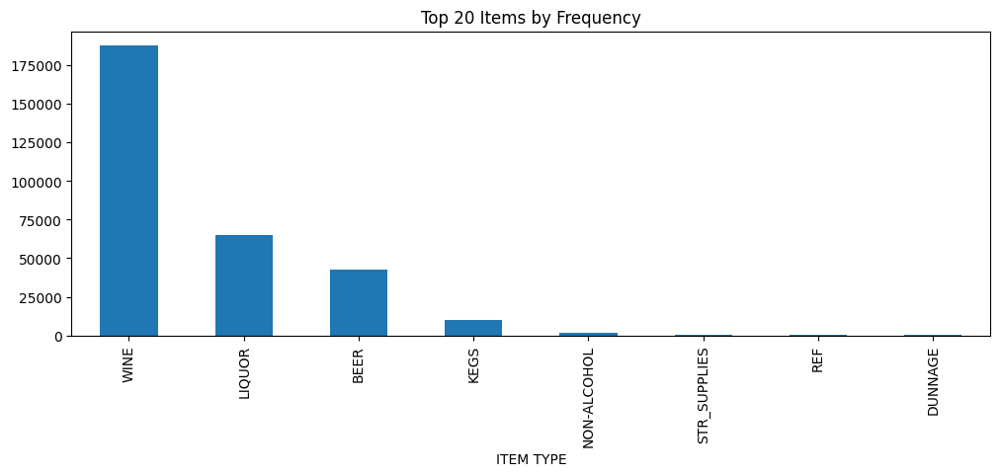

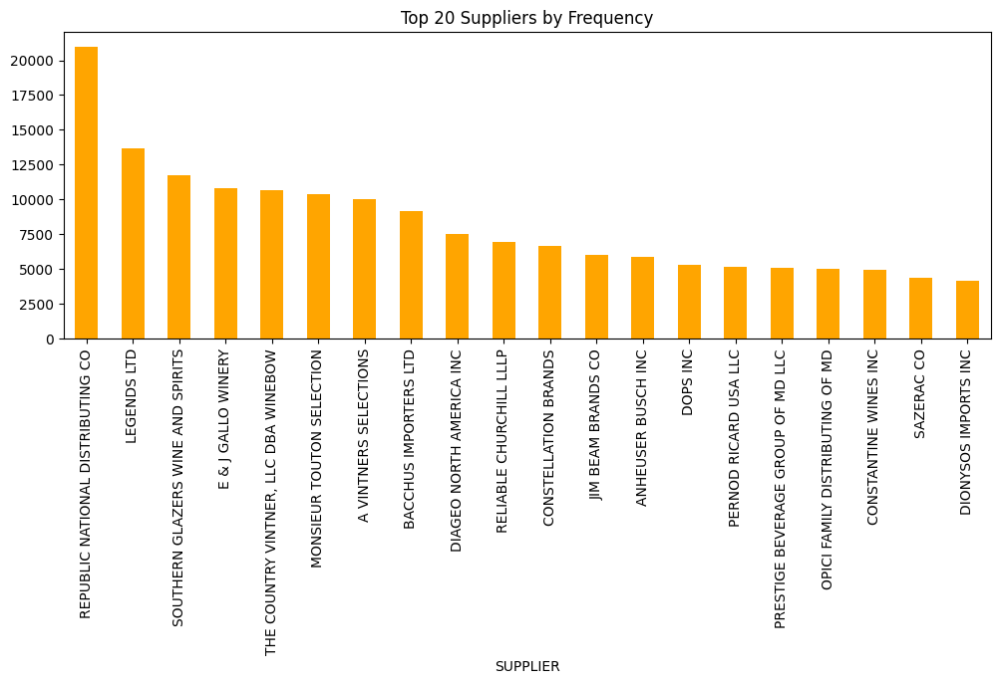

In [784]:
plt.figure(figsize=(12, 4))
df['ITEM TYPE'].value_counts().head(20).plot(kind='bar')
plt.title("Top 20 Items by Frequency")
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(12, 4))
df['SUPPLIER'].value_counts().head(20).plot(kind='bar', color='orange')
plt.title("Top 20 Suppliers by Frequency")
plt.xticks(rotation=90)
plt.show()

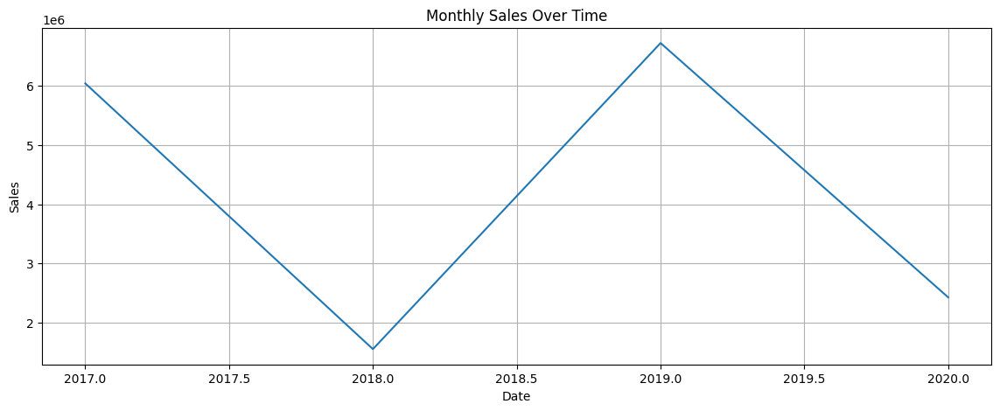

In [785]:
monthly_sales = df.groupby('YEAR')['WAREHOUSE SALES'].sum()
monthly_sales.plot(figsize=(14, 5), title="Monthly Sales Over Time")
plt.xlabel("Date")
plt.ylabel("Sales")
plt.grid()
plt.show()

In [786]:
# Check skewness to decide if transformation is needed
skew_values = df.select_dtypes(include=['float64', 'int64']).skew().sort_values(ascending=False)
print("Skewness:\n", skew_values)

Skewness:
 RETAIL SALES        19.375229
RETAIL TRANSFERS    17.760601
WAREHOUSE SALES     17.391842
MONTH               -0.180377
YEAR                -0.225462
dtype: float64


In [787]:
print("NaNs in RETAIL SALES:", df['RETAIL SALES'].isna().sum())


NaNs in RETAIL SALES: 0


In [788]:
print("Check min value before log:")
print(df[['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']].min())
print(df[['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']].isna().sum())


Check min value before log:
RETAIL SALES        0.01
RETAIL TRANSFERS    0.04
WAREHOUSE SALES     0.08
dtype: float64
RETAIL SALES        0
RETAIL TRANSFERS    0
WAREHOUSE SALES     0
dtype: int64


In [789]:
for col in ['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']:
    temp = df[col].copy()
    temp[temp < 0] = np.nan
    df[col + '_LOG'] = np.log1p(temp)

In [790]:
print("NaNs in RETAIL SALES:", df['RETAIL SALES'].isna().sum())


NaNs in RETAIL SALES: 0


In [791]:
print("Negative values in RETAIL SALES:", (df['RETAIL SALES'] < 0).sum())


Negative values in RETAIL SALES: 0


In [792]:
df[['RETAIL SALES_LOG', 'RETAIL TRANSFERS_LOG', 'WAREHOUSE SALES_LOG']].isnull().sum()


,0
RETAIL SALES_LOG,0
RETAIL TRANSFERS_LOG,0
WAREHOUSE SALES_LOG,0


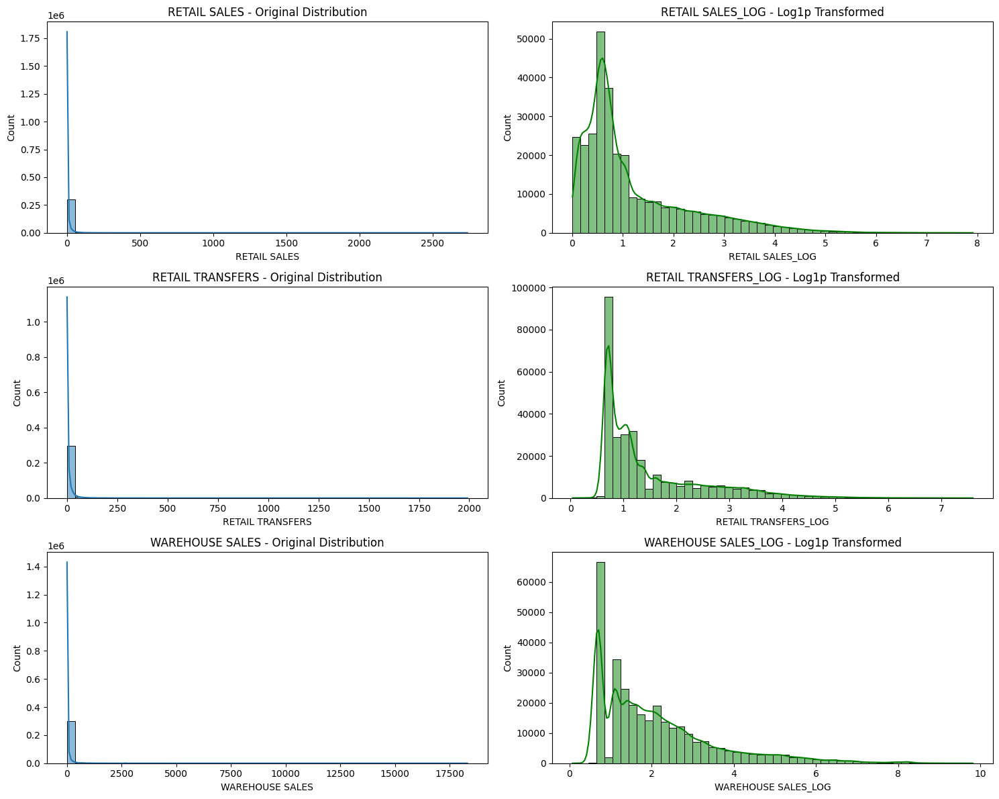

In [793]:
import seaborn as sns
import matplotlib.pyplot as plt

cols = ['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']
log_cols = ['RETAIL SALES_LOG', 'RETAIL TRANSFERS_LOG', 'WAREHOUSE SALES_LOG']

fig, axes = plt.subplots(3, 2, figsize=(15, 12))

for i, (orig, logg) in enumerate(zip(cols, log_cols)):
    sns.histplot(df[orig], bins=50, kde=True, ax=axes[i][0])
    axes[i][0].set_title(f'{orig} - Original Distribution')

    sns.histplot(df[logg], bins=50, kde=True, ax=axes[i][1], color='green')
    axes[i][1].set_title(f'{logg} - Log1p Transformed')

plt.tight_layout()
plt.show()


In [794]:
# Step 1: Check how many outliers exist in each log-transformed column using IQR
for col in ['RETAIL SALES_LOG', 'RETAIL TRANSFERS_LOG', 'WAREHOUSE SALES_LOG']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 2.0 * IQR
    upper_bound = Q3 + 2.0 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print(f"{col}: {len(outliers)} outliers ({(len(outliers)/len(df))*100:.2f}%)")


RETAIL SALES_LOG: 9874 outliers (3.21%)
RETAIL TRANSFERS_LOG: 4959 outliers (1.61%)
WAREHOUSE SALES_LOG: 7138 outliers (2.32%)


In [795]:
# Remove IQR-based outliers across all log-transformed columns
for col in ['RETAIL SALES_LOG', 'RETAIL TRANSFERS_LOG', 'WAREHOUSE SALES_LOG']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 2.0 * IQR
    upper_bound = Q3 + 2.0 * IQR
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

# Confirm shape after cleaning
print("Final shape after outlier removal:", df.shape)


Final shape after outlier removal: (289851, 12)


In [796]:
# Use cleaned dataframe after outlier removal
  # after applying IQR filter

outliers = df[(df['RETAIL TRANSFERS_LOG'] < lower_bound) |
                    (df['RETAIL TRANSFERS_LOG'] > upper_bound)]

percentage = len(outliers) / len(df) * 100
print(f"Outliers remaining in cleaned data: {percentage:.2f}%")


Outliers remaining in cleaned data: 0.00%


In [797]:
# Use cleaned dataframe after outlier removal
  # after applying IQR filter

outliers = df[(df['RETAIL SALES_LOG'] < lower_bound) |
                    (df['RETAIL SALES_LOG'] > upper_bound)]

percentage = len(outliers) / len(df) * 100
print(f"Outliers remaining in cleaned data: {percentage:.2f}%")


Outliers remaining in cleaned data: 0.00%


In [798]:
# Use cleaned dataframe after outlier removal
  # after applying IQR filter

outliers = df[(df['WAREHOUSE SALES_LOG'] < lower_bound) |
                    (df['WAREHOUSE SALES_LOG'] > upper_bound)]

percentage = len(outliers) / len(df) * 100
print(f"Outliers remaining in cleaned data: {percentage:.2f}%")


Outliers remaining in cleaned data: 0.00%


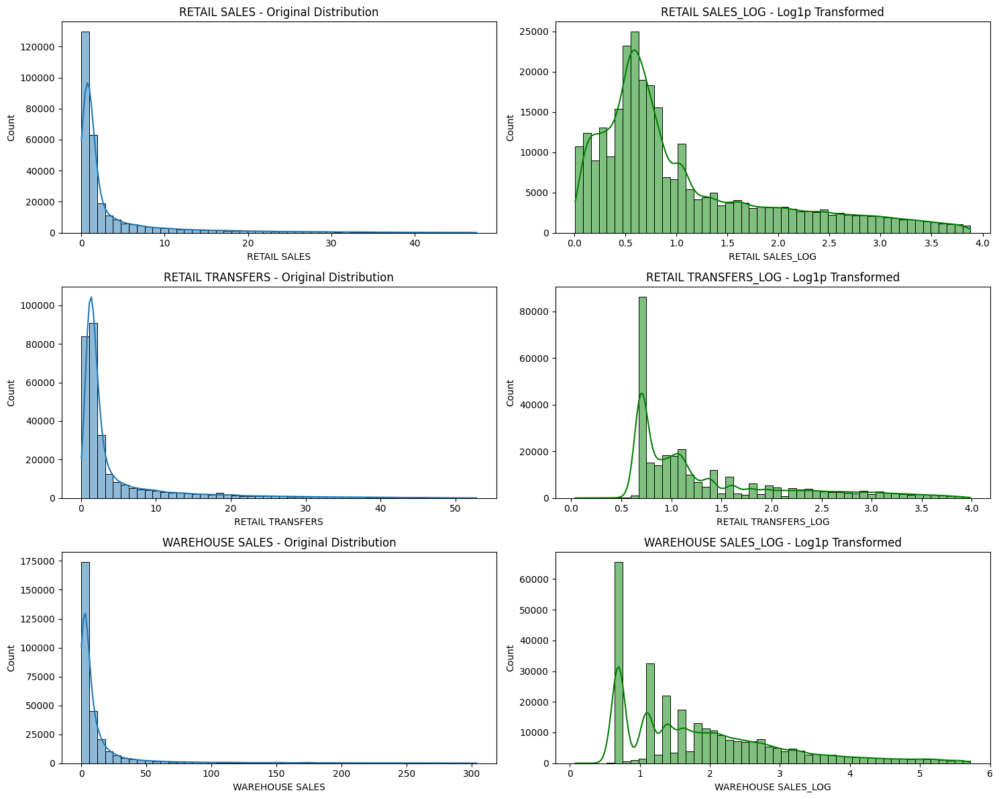

In [799]:
import seaborn as sns
import matplotlib.pyplot as plt

cols = ['RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES']
log_cols = ['RETAIL SALES_LOG', 'RETAIL TRANSFERS_LOG', 'WAREHOUSE SALES_LOG']

fig, axes = plt.subplots(3, 2, figsize=(15, 12))

for i, (orig, logg) in enumerate(zip(cols, log_cols)):
    sns.histplot(df[orig], bins=50, kde=True, ax=axes[i][0])
    axes[i][0].set_title(f'{orig} - Original Distribution')

    sns.histplot(df[logg], bins=50, kde=True, ax=axes[i][1], color='green')
    axes[i][1].set_title(f'{logg} - Log1p Transformed')

plt.tight_layout()
plt.show()


In [800]:
print(df.columns.tolist())
df.drop(columns=['RETAIL SALES', 'WAREHOUSE SALES', 'RETAIL TRANSFERS'], inplace=True)


['YEAR', 'MONTH', 'SUPPLIER', 'ITEM CODE', 'ITEM DESCRIPTION', 'ITEM TYPE', 'RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES', 'RETAIL SALES_LOG', 'RETAIL TRANSFERS_LOG', 'WAREHOUSE SALES_LOG']


In [801]:
print(df.columns.tolist())

['YEAR', 'MONTH', 'SUPPLIER', 'ITEM CODE', 'ITEM DESCRIPTION', 'ITEM TYPE', 'RETAIL SALES_LOG', 'RETAIL TRANSFERS_LOG', 'WAREHOUSE SALES_LOG']


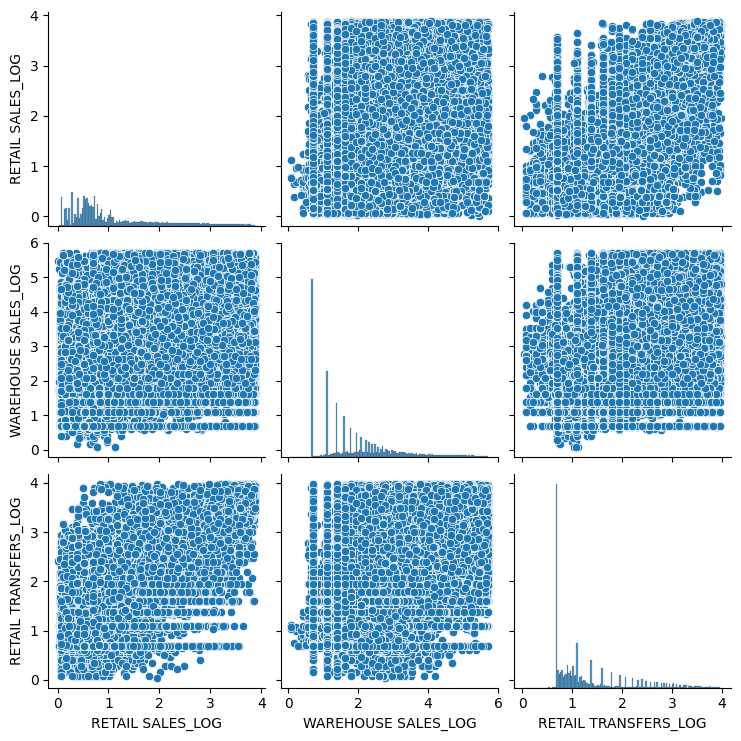

In [802]:
sns.pairplot(df[['RETAIL SALES_LOG', 'WAREHOUSE SALES_LOG', 'RETAIL TRANSFERS_LOG']])


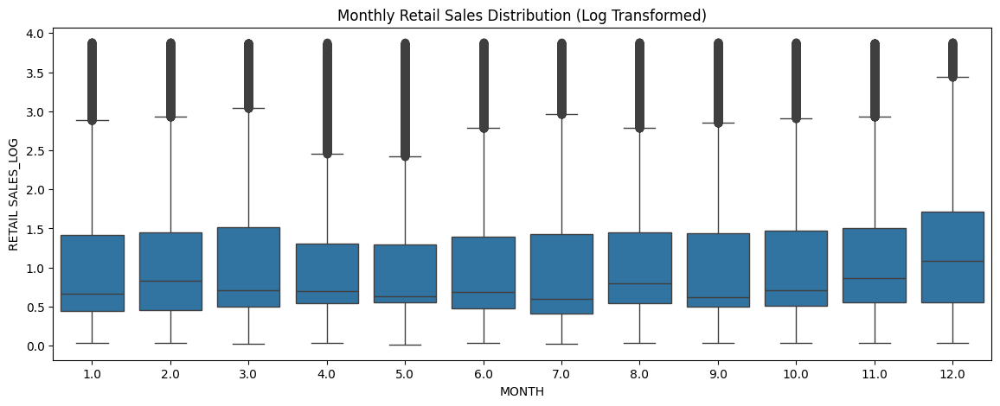

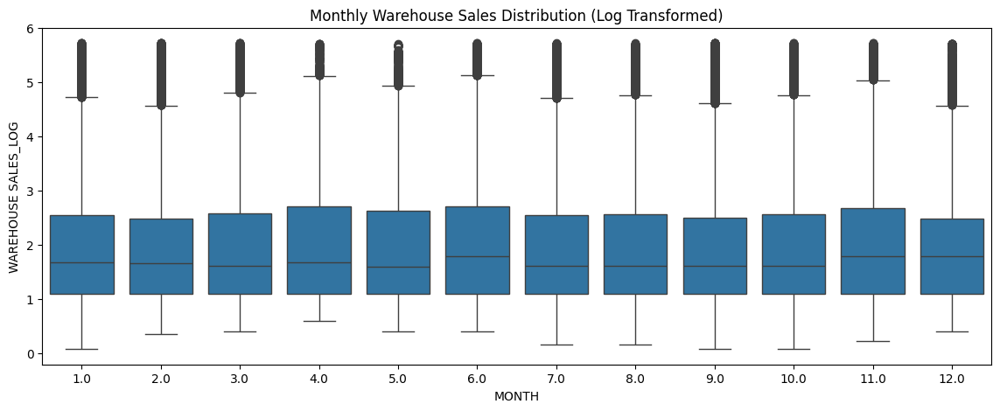

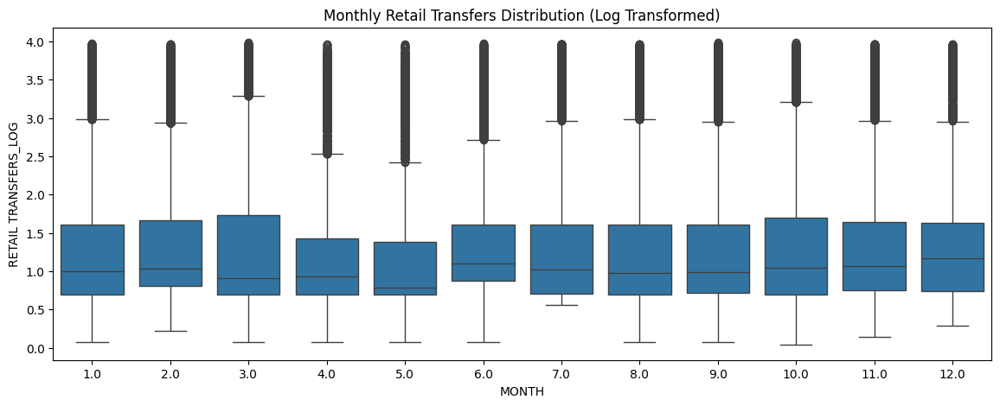

In [803]:
plt.figure(figsize=(14, 5))
sns.boxplot(x='MONTH', y='RETAIL SALES_LOG', data=df)
plt.title('Monthly Retail Sales Distribution (Log Transformed)')
plt.show()
plt.figure(figsize=(14, 5))
sns.boxplot(x='MONTH', y='WAREHOUSE SALES_LOG', data=df)
plt.title('Monthly Warehouse Sales Distribution (Log Transformed)')
plt.show()
plt.figure(figsize=(14, 5))
sns.boxplot(x='MONTH', y='RETAIL TRANSFERS_LOG', data=df)
plt.title('Monthly Retail Transfers Distribution (Log Transformed)')
plt.show()


In [804]:
df.groupby('MONTH')[['RETAIL SALES_LOG', 'WAREHOUSE SALES_LOG', 'RETAIL TRANSFERS_LOG']].describe()


RETAIL SALES_LOG                                                    \
                 count      mean       std       min       25%       50%   
MONTH                                                                      
1.0            35799.0  1.041984  0.876725  0.029559  0.444686  0.660882   
2.0            23632.0  1.086784  0.870842  0.039221  0.457425  0.832909   
3.0            22775.0  1.096744  0.924498  0.019803  0.502592  0.711724   
4.0            12095.0  1.042033  0.859286  0.039221  0.543704  0.697527   
5.0            12232.0  1.022704  0.882071  0.009950  0.549614  0.636577   
6.0            24320.0  1.064652  0.892683  0.039221  0.475872  0.683097   
7.0            34519.0  1.020538  0.923570  0.019803  0.412110  0.603403   
8.0            24527.0  1.073154  0.875409  0.039221  0.548121  0.792087   
9.0            35010.0  1.056702  0.902824  0.029559  0.500775  0.625136   
10.0           25386.0  1.097609  0.881523  0.039221  0.505612  0.714142   
11.0           25958.0  1.123075  0.887861  0.039221  0.553885  0.860187   
12.0           13598.0  1.266973  0.879669  0.039221  0.553885  1.082961   

                          WAREHOUSE SALES_LOG            ...            \
            75%       max               count      mean  ...       75%   
MONTH                                                    ...             
1.0    1.420696  3.879500             35799.0  1.927645  ...  2.546674   
2.0    1.446919  3.878880             23632.0  1.915246  ...  2.484907   
3.0    1.519331  3.877017             22775.0  1.909172  ...  2.583998   
4.0    1.309682  3.879293             12095.0  1.914698  ...  2.708050   
5.0    1.300192  3.879500             12232.0  1.875436  ...  2.632248   
6.0    1.399087  3.880119             24320.0  2.003564  ...  2.708050   
7.0    1.432701  3.877639             34519.0  1.940759  ...  2.541602   
8.0    1.444563  3.878880             24527.0  1.896429  ...  2.564949   
9.0    1.442202  3.880119             35010.0  1.900428  ...  2.505127   
10.0   1.467874  3.878259             25386.0  1.923434  ...  2.564949   
11.0   1.504077  3.876396             25958.0  1.966737  ...  2.674436   
12.0   1.710188  3.880119             13598.0  1.975395  ...  2.484907   

                RETAIL TRANSFERS_LOG                                          \
            max                count      mean       std       min       25%   
MONTH                                                                          
1.0    5.719889              35799.0  1.329043  0.780378  0.076961  0.693147   
2.0    5.719165              23632.0  1.360279  0.765511  0.223144  0.809448   
3.0    5.718200              22775.0  1.323307  0.842986  0.076961  0.693147   
4.0    5.713733              12095.0  1.266076  0.791833  0.076961  0.693147   
5.0    5.711337              12232.0  1.209096  0.788074  0.076961  0.693147   
6.0    5.719608              24320.0  1.369356  0.749485  0.076961  0.871642   
7.0    5.717539              34519.0  1.336785  0.798711  0.559616  0.705570   
8.0    5.719282              24527.0  1.305215  0.784538  0.076961  0.693147   
9.0    5.718770              35010.0  1.305997  0.799025  0.076961  0.713766   
10.0   5.719040              25386.0  1.353968  0.816010  0.039221  0.693147   
11.0   5.719492              25958.0  1.383769  0.779880  0.148420  0.749055   
12.0   5.713700              13598.0  1.408710  0.771325  0.285179  0.741937   

                                     
            50%       75%       max  
MONTH                                
1.0    1.000417  1.609438  3.979682  
2.0    1.034370  1.662884  3.970292  
3.0    0.911345  1.731656  3.985831  
4.0    0.936093  1.429114  3.970292  
5.0    0.788457  1.386294  3.970292  
6.0    1.102853  1.609438  3.979682  
7.0    1.023100  1.609438  3.970292  
8.0    0.974560  1.609438  3.970292  
9.0    0.991769  1.609438  3.984344  
10.0   1.047319  1.700192  3.984344  
11.0   1.064711  1.638997  3.970292  
12.0   1.170933  1.62

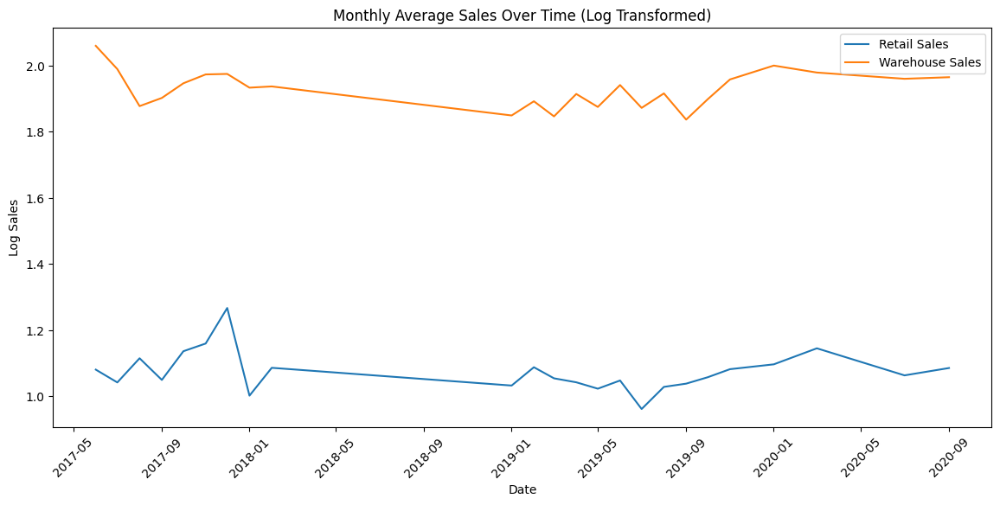

In [806]:
monthly_avg = df.groupby(['YEAR', 'MONTH'])[['RETAIL SALES_LOG', 'WAREHOUSE SALES_LOG']].mean().reset_index()

#  Fix: Create proper datetime format
monthly_avg['DATE'] = pd.to_datetime(
    monthly_avg['YEAR'].astype(int).astype(str) + '-' +
    monthly_avg['MONTH'].astype(int).astype(str).str.zfill(2)
)

# Plotting
plt.figure(figsize=(14, 6))
sns.lineplot(data=monthly_avg, x='DATE', y='RETAIL SALES_LOG', label='Retail Sales')
sns.lineplot(data=monthly_avg, x='DATE', y='WAREHOUSE SALES_LOG', label='Warehouse Sales')
plt.title('Monthly Average Sales Over Time (Log Transformed)')
plt.ylabel('Log Sales')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.legend()
plt.show()


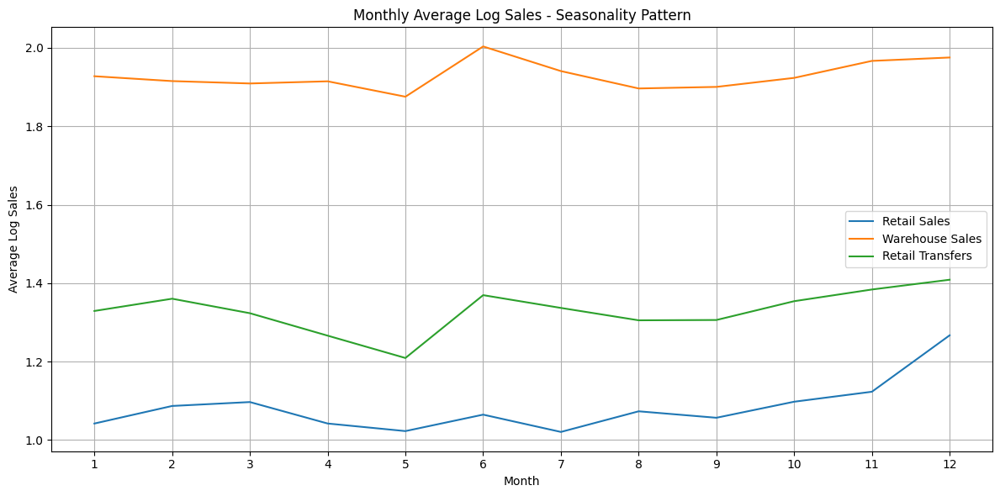

In [807]:
import matplotlib.pyplot as plt
import seaborn as sns

# Monthly average sales (log-transformed)
monthly_avg = df.groupby('MONTH')[['RETAIL SALES_LOG', 'WAREHOUSE SALES_LOG', 'RETAIL TRANSFERS_LOG']].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_avg, x='MONTH', y='RETAIL SALES_LOG', label='Retail Sales')
sns.lineplot(data=monthly_avg, x='MONTH', y='WAREHOUSE SALES_LOG', label='Warehouse Sales')
sns.lineplot(data=monthly_avg, x='MONTH', y='RETAIL TRANSFERS_LOG', label='Retail Transfers')
plt.title('Monthly Average Log Sales - Seasonality Pattern')
plt.xlabel('Month')
plt.ylabel('Average Log Sales')
plt.xticks(ticks=range(1, 13))
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [808]:
from sklearn.preprocessing import LabelEncoder

categorical_cols = ['SUPPLIER', 'ITEM CODE', 'ITEM DESCRIPTION', 'ITEM TYPE']
label_encoders = {}

for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save encoder for later inverse transform


In [809]:
df

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES_LOG,RETAIL TRANSFERS_LOG,WAREHOUSE SALES_LOG
0,2020.0,1.0,273,3,4459,7,0.771727,0.999406,1.098612
1,2020.0,1.0,264,8,22128,7,0.776895,0.693147,1.609438
2,2020.0,1.0,271,11,27154,0,0.621454,0.693147,0.693147
3,2020.0,1.0,186,13,27877,7,0.621454,0.693147,0.693147
4,2020.0,1.0,91,20,27659,7,0.598837,0.955511,1.614425
...,...,...,...,...,...,...,...,...,...
307638,2020.0,9.0,191,33709,12392,0,0.812263,0.717840,1.609438
307639,2020.0,9.0,214,33710,22119,0,1.871802,2.302585,4.695925
307640,2020.0,9.0,191,33712,11841,0,1.215209,1.675538,1.791759
307642,2020.0,9.0,73,33716,11292,0,1.178655,1.248181,2.624669


In [810]:
from sklearn.preprocessing import MinMaxScaler

numerical_cols = ['RETAIL SALES_LOG', 'WAREHOUSE SALES_LOG', 'RETAIL TRANSFERS_LOG']
scaler = MinMaxScaler()
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])


In [811]:
df

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES_LOG,RETAIL TRANSFERS_LOG,WAREHOUSE SALES_LOG
0,2020.0,1.0,273,3,4459,7,0.196833,0.243294,0.181050
1,2020.0,1.0,264,8,22128,7,0.198168,0.165693,0.271575
2,2020.0,1.0,271,11,27154,0,0.158004,0.165693,0.109196
3,2020.0,1.0,186,13,27877,7,0.158004,0.165693,0.109196
4,2020.0,1.0,91,20,27659,7,0.152160,0.232172,0.272459
...,...,...,...,...,...,...,...,...,...
307638,2020.0,9.0,191,33709,12392,0,0.207307,0.171950,0.271575
307639,2020.0,9.0,214,33710,22119,0,0.481078,0.573496,0.818540
307640,2020.0,9.0,191,33712,11841,0,0.311423,0.414613,0.303885
307642,2020.0,9.0,73,33716,11292,0,0.301978,0.306329,0.451487


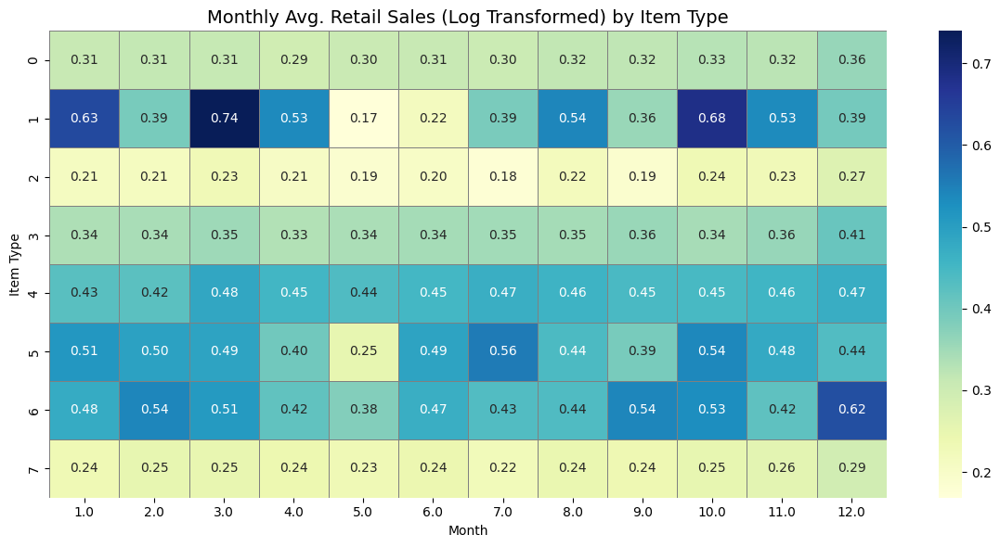

In [812]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Group by item type and month, take average of log-transformed retail sales
heatmap_data = df.groupby(['ITEM TYPE', 'MONTH'])['RETAIL SALES_LOG'].mean().reset_index()

# Pivot the data for heatmap: rows = item type, columns = month
heatmap_pivot = heatmap_data.pivot(index='ITEM TYPE', columns='MONTH', values='RETAIL SALES_LOG')

# Plot heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_pivot, annot=True, fmt=".2f", cmap="YlGnBu", linewidths=0.5, linecolor='gray')
plt.title('Monthly Avg. Retail Sales (Log Transformed) by Item Type', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Item Type')
plt.tight_layout()
plt.show()


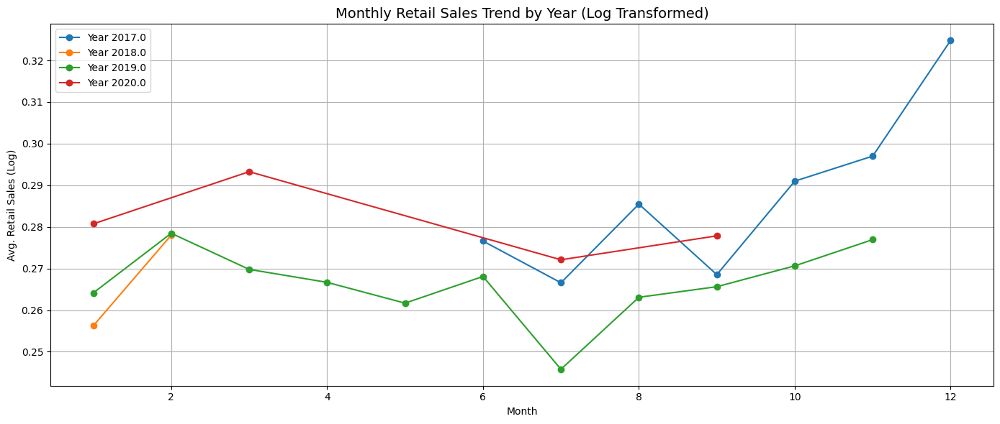

In [813]:
plt.figure(figsize=(14, 6))

# Group by year and month, take average of retail sales (log)
trend_data = df.groupby(['YEAR', 'MONTH'])['RETAIL SALES_LOG'].mean().reset_index()

# Pivot so each year's monthly trend is a line
for year in sorted(df['YEAR'].unique()):
    monthly_avg = trend_data[trend_data['YEAR'] == year]
    plt.plot(monthly_avg['MONTH'], monthly_avg['RETAIL SALES_LOG'], marker='o', label=f'Year {year}')

plt.title('Monthly Retail Sales Trend by Year (Log Transformed)', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Avg. Retail Sales (Log)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


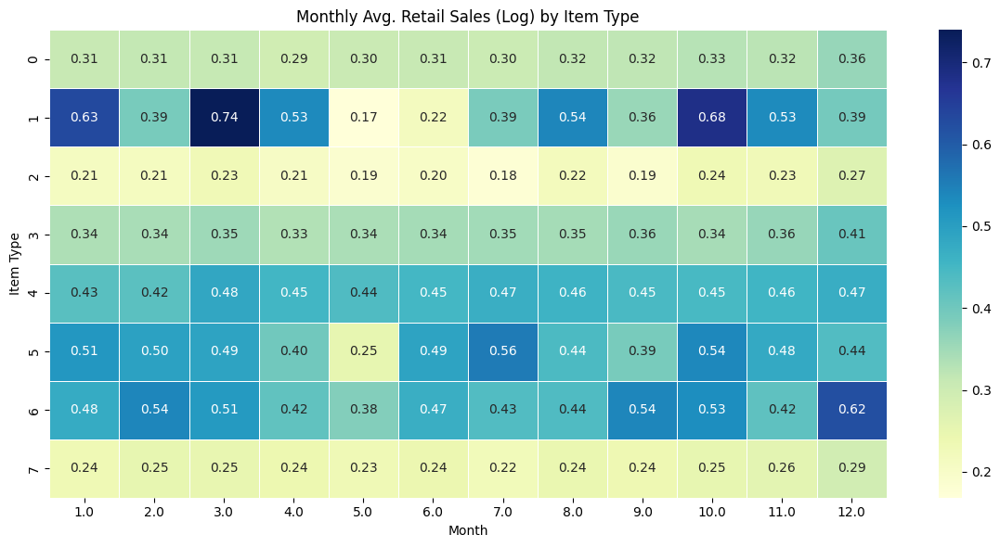

In [814]:
plt.figure(figsize=(12, 6))

# Group by item type and month
heatmap_data = df.groupby(['ITEM TYPE', 'MONTH'])['RETAIL SALES_LOG'].mean().unstack()

# Create heatmap
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, fmt=".2f", linewidths=0.5)

plt.title('Monthly Avg. Retail Sales (Log) by Item Type')
plt.xlabel('Month')
plt.ylabel('Item Type')
plt.tight_layout()
plt.show()


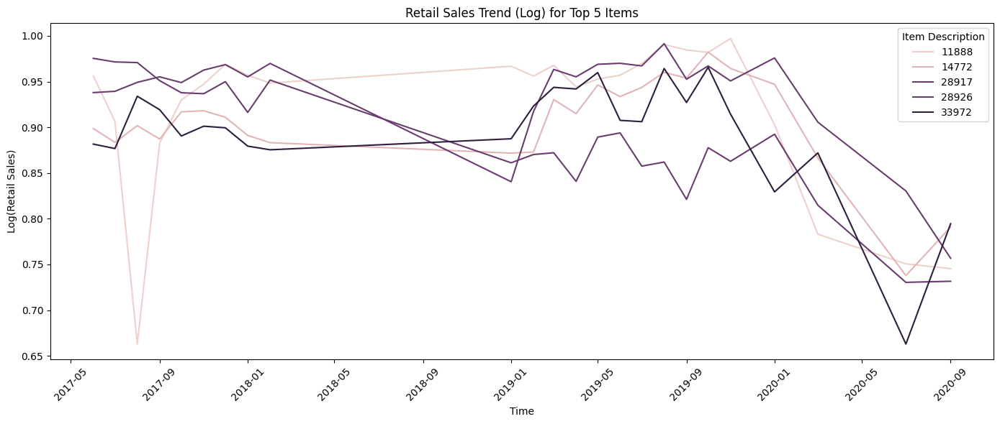

In [816]:
# Identify top 5 items by total retail sales
top_items = df.groupby('ITEM DESCRIPTION')['RETAIL SALES_LOG'].sum().nlargest(5).index

# Filter for those items
top_df = df[df['ITEM DESCRIPTION'].isin(top_items)]

# Fix the datetime parsing by converting year/month to int and formatting correctly
top_df['YEAR_MONTH'] = pd.to_datetime(
    top_df['YEAR'].astype(int).astype(str) + '-' +
    top_df['MONTH'].astype(int).astype(str).str.zfill(2)
)

# Plot line chart
plt.figure(figsize=(14, 6))
sns.lineplot(data=top_df, x='YEAR_MONTH', y='RETAIL SALES_LOG', hue='ITEM DESCRIPTION')
plt.title('Retail Sales Trend (Log) for Top 5 Items')
plt.xlabel('Time')
plt.ylabel('Log(Retail Sales)')
plt.xticks(rotation=45)
plt.legend(title='Item Description')
plt.tight_layout()
plt.show()


In [817]:
save_path = '/content/drive/MyDrive/retail_cleaned.csv'

df.to_csv(save_path, index=False)
print(f"Data saved to: {save_path}")

Data saved to: /content/drive/MyDrive/retail_cleaned.csv


**MILESTONE -2 **

In [818]:
# Lag features for each item based on RETAIL_SALES_LOG
df = df.sort_values(by=['ITEM CODE', 'YEAR', 'MONTH'])

for lag in [1, 2, 3]:
    df[f'RETAIL_SALES_LAG_{lag}'] = df.groupby('ITEM CODE')['RETAIL SALES_LOG'].shift(lag)
    df[f'WAREHOUSE_SALES_LAG_{lag}'] = df.groupby('ITEM CODE')['WAREHOUSE SALES_LOG'].shift(lag)
    df[f'RETAIL_TRANSFERS_LAG_{lag}'] = df.groupby('ITEM CODE')['RETAIL TRANSFERS_LOG'].shift(lag)


In [820]:
df

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES_LOG,RETAIL TRANSFERS_LOG,WAREHOUSE SALES_LOG,RETAIL_SALES_LAG_1,WAREHOUSE_SALES_LAG_1,RETAIL_TRANSFERS_LAG_1,RETAIL_SALES_LAG_2,WAREHOUSE_SALES_LAG_2,RETAIL_TRANSFERS_LAG_2,RETAIL_SALES_LAG_3,WAREHOUSE_SALES_LAG_3,RETAIL_TRANSFERS_LAG_3
48471,2017.0,7.0,271,0,24397,3,0.037997,0.288712,0.414429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
195005,2019.0,4.0,75,1,18720,7,0.175076,0.165693,0.109196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
207739,2019.0,5.0,75,1,18720,7,0.148653,0.165693,0.109196,0.175076,0.109196,0.165693,NaN,NaN,NaN,NaN,NaN,NaN
270378,2019.0,10.0,75,1,18720,7,0.161376,0.165693,0.109196,0.148653,0.109196,0.165693,0.175076,0.109196,0.165693,NaN,NaN,NaN
283473,2019.0,11.0,75,1,18720,7,0.149278,0.165693,0.109196,0.161376,0.109196,0.165693,0.148653,0.109196,0.165693,0.175076,0.109196,0.165693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296329,2019.0,11.0,361,33720,33864,5,0.803043,0.758045,0.693589,0.734260,0.887817,0.690862,0.597427,0.902210,0.720962,0.678504,0.828817,0.810188
11986,2020.0,1.0,361,33720,33864,5,0.901634,0.963998,0.874832,0.803043,0.693589,0.758045,0.734260,0.887817,0.690862,0.597427,0.902210,0.720962
34720,2020.0,3.0,361,33720,33864,5,0.854825,0.758455,0.830734,0.901634,0.874832,0.963998,0.803043,0.693589,0.758045,0.734260,0.887817,0.690862
23218,2020.0,7.0,361,33720,33864,5,0.381661,0.398497,0.657488,0.854825,0.830734,0.758455,0.901634,0.874832,0.963998,0.803043,0.693589,0.758045


In [821]:
# Impute missing lag features using forward-fill + backward-fill, and store in new dataframe
lag_cols = [col for col in df.columns if 'LAG' in col]

# Copy original dataframe
df_lag_imputed = df.copy()

# Impute only the lag columns
df_lag_imputed[lag_cols] = df_lag_imputed[lag_cols].fillna(method='ffill').fillna(method='bfill')


print("Remaining missing values in lag columns:")
print(df_lag_imputed[lag_cols].isnull().sum())


Remaining missing values in lag columns:
RETAIL_SALES_LAG_1        0
WAREHOUSE_SALES_LAG_1     0
RETAIL_TRANSFERS_LAG_1    0
RETAIL_SALES_LAG_2        0
WAREHOUSE_SALES_LAG_2     0
RETAIL_TRANSFERS_LAG_2    0
RETAIL_SALES_LAG_3        0
WAREHOUSE_SALES_LAG_3     0
RETAIL_TRANSFERS_LAG_3    0
dtype: int64


In [822]:
df_lag_imputed

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES_LOG,RETAIL TRANSFERS_LOG,WAREHOUSE SALES_LOG,RETAIL_SALES_LAG_1,WAREHOUSE_SALES_LAG_1,RETAIL_TRANSFERS_LAG_1,RETAIL_SALES_LAG_2,WAREHOUSE_SALES_LAG_2,RETAIL_TRANSFERS_LAG_2,RETAIL_SALES_LAG_3,WAREHOUSE_SALES_LAG_3,RETAIL_TRANSFERS_LAG_3
48471,2017.0,7.0,271,0,24397,3,0.037997,0.288712,0.414429,0.175076,0.109196,0.165693,0.175076,0.109196,0.165693,0.175076,0.109196,0.165693
195005,2019.0,4.0,75,1,18720,7,0.175076,0.165693,0.109196,0.175076,0.109196,0.165693,0.175076,0.109196,0.165693,0.175076,0.109196,0.165693
207739,2019.0,5.0,75,1,18720,7,0.148653,0.165693,0.109196,0.175076,0.109196,0.165693,0.175076,0.109196,0.165693,0.175076,0.109196,0.165693
270378,2019.0,10.0,75,1,18720,7,0.161376,0.165693,0.109196,0.148653,0.109196,0.165693,0.175076,0.109196,0.165693,0.175076,0.109196,0.165693
283473,2019.0,11.0,75,1,18720,7,0.149278,0.165693,0.109196,0.161376,0.109196,0.165693,0.148653,0.109196,0.165693,0.175076,0.109196,0.165693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296329,2019.0,11.0,361,33720,33864,5,0.803043,0.758045,0.693589,0.734260,0.887817,0.690862,0.597427,0.902210,0.720962,0.678504,0.828817,0.810188
11986,2020.0,1.0,361,33720,33864,5,0.901634,0.963998,0.874832,0.803043,0.693589,0.758045,0.734260,0.887817,0.690862,0.597427,0.902210,0.720962
34720,2020.0,3.0,361,33720,33864,5,0.854825,0.758455,0.830734,0.901634,0.874832,0.963998,0.803043,0.693589,0.758045,0.734260,0.887817,0.690862
23218,2020.0,7.0,361,33720,33864,5,0.381661,0.398497,0.657488,0.854825,0.830734,0.758455,0.901634,0.874832,0.963998,0.803043,0.693589,0.758045


In [823]:
from sklearn.preprocessing import MinMaxScaler

features_to_scale = [col for col in df_lag_imputed.columns if 'LAG' in col or 'ROLL_MEAN' in col]
scaler = MinMaxScaler()
df_lag_imputed[features_to_scale] = scaler.fit_transform(df_lag_imputed[features_to_scale])


In [824]:
df_lag_imputed

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES_LOG,RETAIL TRANSFERS_LOG,WAREHOUSE SALES_LOG,RETAIL_SALES_LAG_1,WAREHOUSE_SALES_LAG_1,RETAIL_TRANSFERS_LAG_1,RETAIL_SALES_LAG_2,WAREHOUSE_SALES_LAG_2,RETAIL_TRANSFERS_LAG_2,RETAIL_SALES_LAG_3,WAREHOUSE_SALES_LAG_3,RETAIL_TRANSFERS_LAG_3
48471,2017.0,7.0,271,0,24397,3,0.037997,0.288712,0.414429,0.175076,0.109196,0.157638,0.175076,0.109196,0.157638,0.175076,0.109202,0.157638
195005,2019.0,4.0,75,1,18720,7,0.175076,0.165693,0.109196,0.175076,0.109196,0.157638,0.175076,0.109196,0.157638,0.175076,0.109202,0.157638
207739,2019.0,5.0,75,1,18720,7,0.148653,0.165693,0.109196,0.175076,0.109196,0.157638,0.175076,0.109196,0.157638,0.175076,0.109202,0.157638
270378,2019.0,10.0,75,1,18720,7,0.161376,0.165693,0.109196,0.148653,0.109196,0.157638,0.175076,0.109196,0.157638,0.175076,0.109202,0.157638
283473,2019.0,11.0,75,1,18720,7,0.149278,0.165693,0.109196,0.161376,0.109196,0.157638,0.148653,0.109196,0.157638,0.175076,0.109202,0.157638
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296329,2019.0,11.0,361,33720,33864,5,0.803043,0.758045,0.693589,0.734260,0.887817,0.687877,0.597427,0.902210,0.718268,0.678504,0.828858,0.808355
11986,2020.0,1.0,361,33720,33864,5,0.901634,0.963998,0.874832,0.803043,0.693589,0.755709,0.734260,0.887817,0.687877,0.597427,0.902255,0.718268
34720,2020.0,3.0,361,33720,33864,5,0.854825,0.758455,0.830734,0.901634,0.874832,0.963650,0.803043,0.693589,0.755709,0.734260,0.887861,0.687877
23218,2020.0,7.0,361,33720,33864,5,0.381661,0.398497,0.657488,0.854825,0.830734,0.756123,0.901634,0.874832,0.963650,0.803043,0.693624,0.755709


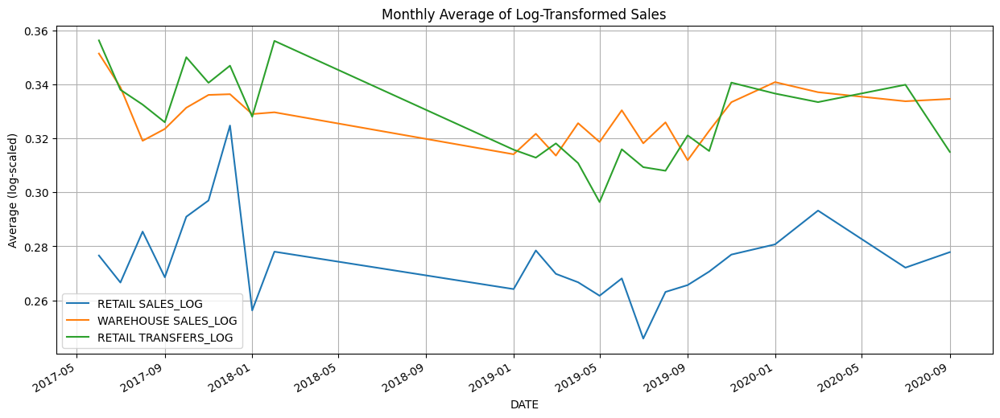

In [827]:
df_lag_imputed['DATE'] = pd.to_datetime(
    df_lag_imputed['YEAR'].astype(int).astype(str) + '-' +
    df_lag_imputed['MONTH'].astype(int).astype(str).str.zfill(2) + '-01'
)

# Group by month and visualize trend
monthly_avg = df_lag_imputed.groupby('DATE')[['RETAIL SALES_LOG', 'WAREHOUSE SALES_LOG', 'RETAIL TRANSFERS_LOG']].mean()

# Plot
monthly_avg.plot(figsize=(15, 6), title='Monthly Average of Log-Transformed Sales')
plt.ylabel('Average (log-scaled)')
plt.grid(True)
plt.show()



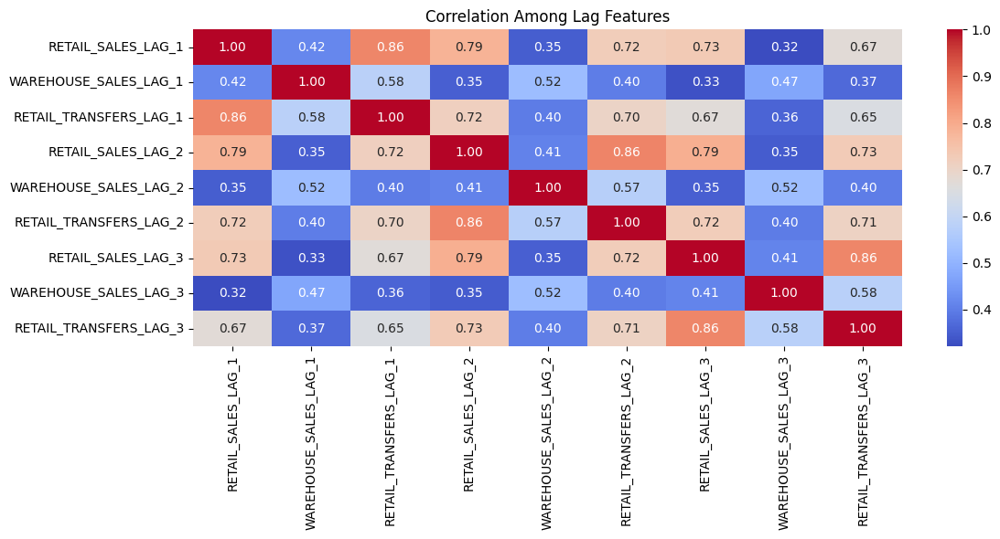

In [828]:
import seaborn as sns

lag_cols = [col for col in df_lag_imputed.columns if 'LAG' in col]
plt.figure(figsize=(12, 6))
sns.heatmap(df_lag_imputed[lag_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Among Lag Features')
plt.tight_layout()
plt.show()


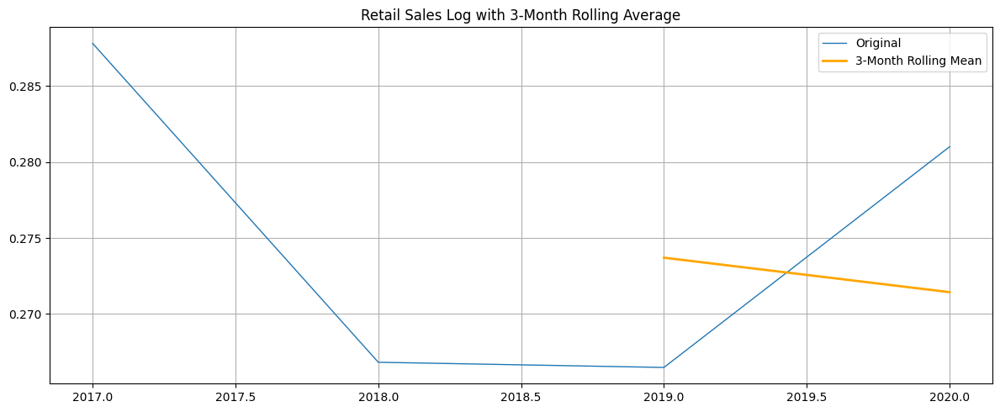

In [829]:
df_daily = df.groupby('YEAR')['RETAIL SALES_LOG'].mean()

plt.figure(figsize=(12, 5))
plt.plot(df_daily, label='Original', linewidth=1)
plt.plot(df_daily.rolling(3).mean(), label='3-Month Rolling Mean', color='orange', linewidth=2)
plt.title("Retail Sales Log with 3-Month Rolling Average")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


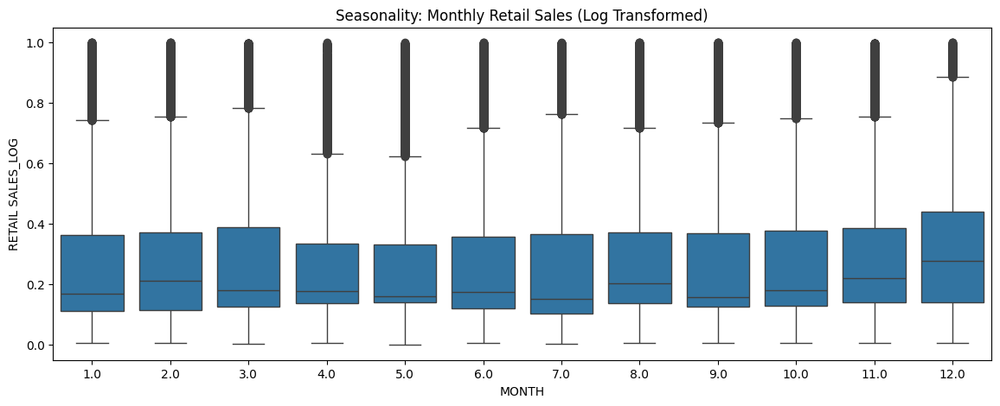

In [830]:
plt.figure(figsize=(14, 5))
sns.boxplot(x='MONTH', y='RETAIL SALES_LOG', data=df_lag_imputed)
plt.title('Seasonality: Monthly Retail Sales (Log Transformed)')
plt.show()


In [831]:
df_lag_imputed[['RETAIL SALES_LOG']].describe()
df_lag_imputed[['RETAIL SALES_LOG']].head(10)


,RETAIL SALES_LOG
48471,0.037997
195005,0.175076
207739,0.148653
270378,0.161376
283473,0.149278
48472,0.216038
88510,0.181954
102141,0.264022
75100,0.277252
131171,0.090839


In [832]:
# Create target for next month retail sales (log)
df_lag_imputed['RETAIL_SALES_LOG_TARGET'] = df_lag_imputed['RETAIL SALES_LOG'].shift(-1)
df_model_final = df_lag_imputed.dropna(subset=['RETAIL_SALES_LOG_TARGET'])


df_model_final[['RETAIL SALES_LOG', 'RETAIL_SALES_LOG_TARGET']].head()


,RETAIL SALES_LOG,RETAIL_SALES_LOG_TARGET
48471,0.037997,0.175076
195005,0.175076,0.148653
207739,0.148653,0.161376
270378,0.161376,0.149278
283473,0.149278,0.216038


In [833]:
df_model_final.isnull().sum()

,0
YEAR,0
MONTH,0
SUPPLIER,0
ITEM CODE,0
ITEM DESCRIPTION,0
ITEM TYPE,0
RETAIL SALES_LOG,0
RETAIL TRANSFERS_LOG,0
WAREHOUSE SALES_LOG,0
RETAIL_SALES_LAG_1,0


In [834]:
df_model_final

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES_LOG,RETAIL TRANSFERS_LOG,WAREHOUSE SALES_LOG,RETAIL_SALES_LAG_1,WAREHOUSE_SALES_LAG_1,RETAIL_TRANSFERS_LAG_1,RETAIL_SALES_LAG_2,WAREHOUSE_SALES_LAG_2,RETAIL_TRANSFERS_LAG_2,RETAIL_SALES_LAG_3,WAREHOUSE_SALES_LAG_3,RETAIL_TRANSFERS_LAG_3,DATE,RETAIL_SALES_LOG_TARGET
48471,2017.0,7.0,271,0,24397,3,0.037997,0.288712,0.414429,0.175076,0.109196,0.157638,0.175076,0.109196,0.157638,0.175076,0.109202,0.157638,2017-07-01,0.175076
195005,2019.0,4.0,75,1,18720,7,0.175076,0.165693,0.109196,0.175076,0.109196,0.157638,0.175076,0.109196,0.157638,0.175076,0.109202,0.157638,2019-04-01,0.148653
207739,2019.0,5.0,75,1,18720,7,0.148653,0.165693,0.109196,0.175076,0.109196,0.157638,0.175076,0.109196,0.157638,0.175076,0.109202,0.157638,2019-05-01,0.161376
270378,2019.0,10.0,75,1,18720,7,0.161376,0.165693,0.109196,0.148653,0.109196,0.157638,0.175076,0.109196,0.157638,0.175076,0.109202,0.157638,2019-10-01,0.149278
283473,2019.0,11.0,75,1,18720,7,0.149278,0.165693,0.109196,0.161376,0.109196,0.157638,0.148653,0.109196,0.157638,0.175076,0.109202,0.157638,2019-11-01,0.216038
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283362,2019.0,10.0,361,33720,33864,5,0.734260,0.690862,0.887817,0.597427,0.902210,0.718268,0.678504,0.828817,0.808355,0.363580,0.808436,0.581653,2019-10-01,0.803043
296329,2019.0,11.0,361,33720,33864,5,0.803043,0.758045,0.693589,0.734260,0.887817,0.687877,0.597427,0.902210,0.718268,0.678504,0.828858,0.808355,2019-11-01,0.901634
11986,2020.0,1.0,361,33720,33864,5,0.901634,0.963998,0.874832,0.803043,0.693589,0.755709,0.734260,0.887817,0.687877,0.597427,0.902255,0.718268,2020-01-01,0.854825
34720,2020.0,3.0,361,33720,33864,5,0.854825,0.758455,0.830734,0.901634,0.874832,0.963650,0.803043,0.693589,0.755709,0.734260,0.887861,0.687877,2020-03-01,0.381661


In [835]:
df_model_final.isnull().sum()

,0
YEAR,0
MONTH,0
SUPPLIER,0
ITEM CODE,0
ITEM DESCRIPTION,0
ITEM TYPE,0
RETAIL SALES_LOG,0
RETAIL TRANSFERS_LOG,0
WAREHOUSE SALES_LOG,0
RETAIL_SALES_LAG_1,0


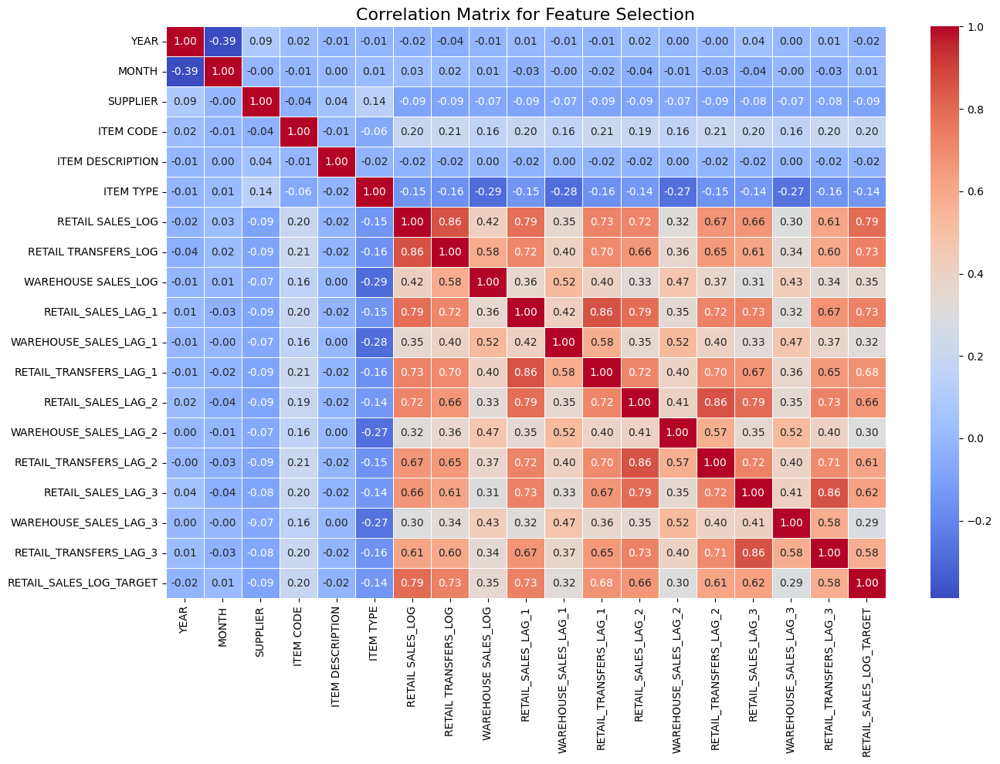

In [836]:
import matplotlib.pyplot as plt
import seaborn as sns


corr_matrix = df_model_final.corr(numeric_only=True)

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix for Feature Selection", fontsize=16)
plt.tight_layout()
plt.show()


In [837]:
save_path = '/content/drive/MyDrive/retail_preprocessed.csv'

df.to_csv(save_path, index=False)
print(f"Data saved to: {save_path}")

Data saved to: /content/drive/MyDrive/retail_preprocessed.csv


**Milestone -3**

In [848]:
from scipy.stats import wasserstein_distance

In [849]:
num_cols = [col for col in df.select_dtypes(include=[np.number]).columns
            if df[col].nunique() > 10]

print("Filtered Numerical Columns (Continuous):", num_cols)


Filtered Numerical Columns (Continuous): ['MONTH', 'SUPPLIER', 'ITEM CODE', 'ITEM DESCRIPTION', 'RETAIL SALES_LOG', 'RETAIL TRANSFERS_LOG', 'WAREHOUSE SALES_LOG', 'RETAIL_SALES_LAG_1', 'WAREHOUSE_SALES_LAG_1', 'RETAIL_TRANSFERS_LAG_1', 'RETAIL_SALES_LAG_2', 'WAREHOUSE_SALES_LAG_2', 'RETAIL_TRANSFERS_LAG_2', 'RETAIL_SALES_LAG_3', 'WAREHOUSE_SALES_LAG_3', 'RETAIL_TRANSFERS_LAG_3']


In [859]:
from scipy.stats import wasserstein_distance
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import copy

results = []
noisy_versions = {}
noise_std = 0.8  # Tune if needed

for col in num_cols:
    temp_df = df_model_final.copy()

    # Add Gaussian noise
    noise = np.random.normal(0, noise_std, size=temp_df[col].shape)
    temp_df[col] = temp_df[col] + noise

    # Store version
    noisy_versions[col] = temp_df.copy()

    # Evaluation metrics
    rmse = np.sqrt(mean_squared_error(df_model_final[col], temp_df[col]))
    mae = mean_absolute_error(df_model_final[col], temp_df[col])
    eu_dist = np.linalg.norm(df_model_final[col] - temp_df[col])
    wass_dist = wasserstein_distance(df_model_final[col], temp_df[col])

    results.append({
        'Column': col,
        'RMSE': rmse,
        'MAE': mae,
        'Euclidean_Distance': eu_dist,
        'Wasserstein_Distance': wass_dist
    })

results_df = pd.DataFrame(results).sort_values(by='Wasserstein_Distance', ascending=False)
results_df


,Column,RMSE,MAE,Euclidean_Distance,Wasserstein_Distance
5,RETAIL TRANSFERS_LOG,0.800870,0.639091,431.169904,0.520431
12,RETAIL_TRANSFERS_LAG_2,0.801268,0.640014,431.384536,0.518064
9,RETAIL_TRANSFERS_LAG_1,0.799357,0.637384,430.355345,0.516793
15,RETAIL_TRANSFERS_LAG_3,0.798606,0.637026,429.951035,0.515167
4,RETAIL SALES_LOG,0.799207,0.637581,430.274997,0.502917
1,SUPPLIER,0.800533,0.638322,430.988778,0.502913
13,RETAIL_SALES_LAG_3,0.801230,0.639703,431.363782,0.502173
7,RETAIL_SALES_LAG_1,0.800100,0.638238,430.755527,0.502058
10,RETAIL_SALES_LAG_2,0.801731,0.639471,431.633683,0.501798
8,WAREHOUSE_SALES_LAG_1,0.801382,0.639978,431.445660,0.501395


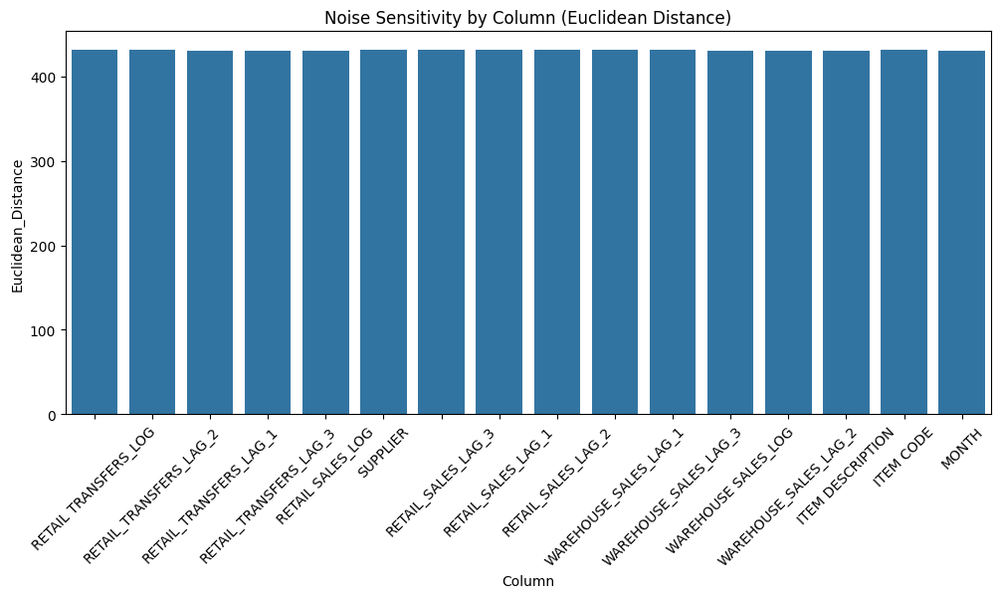

In [860]:
plt.figure(figsize=(12, 5))
sns.barplot(data=results_df, x='Column', y='Euclidean_Distance')
plt.xticks(rotation=45)
plt.title("Noise Sensitivity by Column (Euclidean Distance)")
plt.show()


['Column', 'RMSE', 'MAE', 'Euclidean_Distance', 'Wasserstein_Distance']


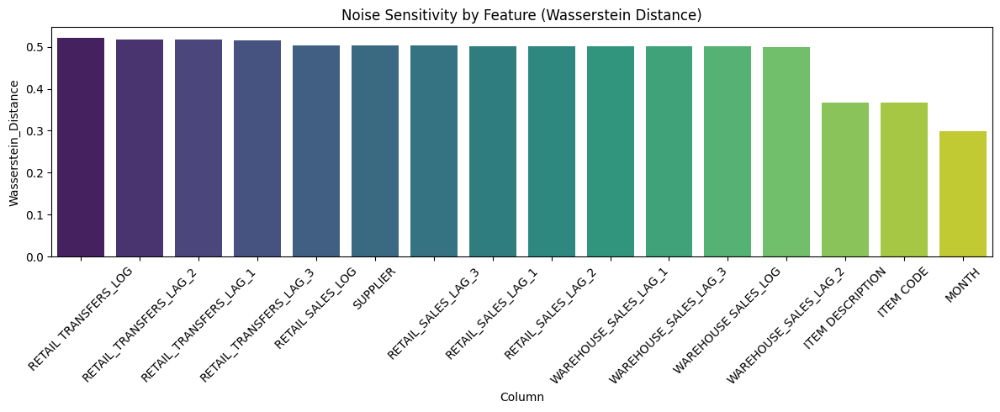

In [861]:
# Check actual column name (case sensitive!)
print(results_df.columns.tolist())

# Now fix the plotting code accordingly:
plt.figure(figsize=(12, 5))
sns.barplot(data=results_df.sort_values(by='Wasserstein_Distance', ascending=False),
            x='Column', y='Wasserstein_Distance', palette='viridis')
plt.title('Noise Sensitivity by Feature (Wasserstein Distance)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [862]:
from IPython.display import display

# Display noise impact table
display(results_df)

# Overall average impact
overall_score = results_df['Wasserstein_Distance'].mean()
print(" Overall Noise Impact Score:", round(overall_score, 5))


,Column,RMSE,MAE,Euclidean_Distance,Wasserstein_Distance
5,RETAIL TRANSFERS_LOG,0.800870,0.639091,431.169904,0.520431
12,RETAIL_TRANSFERS_LAG_2,0.801268,0.640014,431.384536,0.518064
9,RETAIL_TRANSFERS_LAG_1,0.799357,0.637384,430.355345,0.516793
15,RETAIL_TRANSFERS_LAG_3,0.798606,0.637026,429.951035,0.515167
4,RETAIL SALES_LOG,0.799207,0.637581,430.274997,0.502917
1,SUPPLIER,0.800533,0.638322,430.988778,0.502913
13,RETAIL_SALES_LAG_3,0.801230,0.639703,431.363782,0.502173
7,RETAIL_SALES_LAG_1,0.800100,0.638238,430.755527,0.502058
10,RETAIL_SALES_LAG_2,0.801731,0.639471,431.633683,0.501798
8,WAREHOUSE_SALES_LAG_1,0.801382,0.639978,431.445660,0.501395


 Overall Noise Impact Score: 0.47606


In [863]:
# Top 5 most sensitive columns by noise
top_k = 5
top_columns = results_df.sort_values('Wasserstein_Distance', ascending=False)['Column'].head(top_k).tolist()
print("Top noise-sensitive columns:", top_columns)

Top noise-sensitive columns: ['RETAIL TRANSFERS_LOG', 'RETAIL_TRANSFERS_LAG_2', 'RETAIL_TRANSFERS_LAG_1', 'RETAIL_TRANSFERS_LAG_3', 'RETAIL SALES_LOG']


In [864]:
noisy_df = df_model_final.copy()

for col in num_cols:
    noise = np.random.normal(0, noise_std, size=noisy_df[col].shape)
    noisy_df[col] = noisy_df[col] + noise

In [865]:
noisy_df

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES_LOG,RETAIL TRANSFERS_LOG,WAREHOUSE SALES_LOG,RETAIL_SALES_LAG_1,WAREHOUSE_SALES_LAG_1,RETAIL_TRANSFERS_LAG_1,RETAIL_SALES_LAG_2,WAREHOUSE_SALES_LAG_2,RETAIL_TRANSFERS_LAG_2,RETAIL_SALES_LAG_3,WAREHOUSE_SALES_LAG_3,RETAIL_TRANSFERS_LAG_3,DATE,RETAIL_SALES_LOG_TARGET
48471,2017.0,7.482494,270.774376,-0.259796,24397.319882,3,-0.486488,0.639323,-0.134320,0.483801,-0.985448,1.921991,0.372940,0.580805,-0.433032,0.800018,1.850474,0.332716,2017-07-01,0.175076
195005,2019.0,4.512841,74.186102,1.238267,18718.872368,7,-0.328204,1.223188,0.323628,-0.274920,1.154921,-0.797242,-0.177008,-1.128061,-1.195158,-0.726440,0.682897,1.423759,2019-04-01,0.148653
207739,2019.0,4.856959,75.988162,1.065928,18719.553856,7,0.410864,0.848021,-0.896024,-0.691987,-0.212821,0.320589,0.436648,0.330742,-1.232380,-0.040737,-0.740671,-1.036952,2019-05-01,0.161376
270378,2019.0,9.786955,74.448108,0.906598,18720.938710,7,0.339147,-0.908016,-0.017831,0.431589,-0.213827,0.497413,0.418480,-0.901162,1.451489,1.742086,0.626217,0.592011,2019-10-01,0.149278
283473,2019.0,10.126648,74.896131,0.445968,18719.789361,7,0.414112,1.198700,0.240410,-0.827562,0.963633,-0.236526,0.403119,-1.169532,-1.088880,0.286719,0.025555,1.574102,2019-11-01,0.216038
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283362,2019.0,10.307774,360.807773,33718.419276,33865.554251,5,-0.730418,1.622037,0.555464,-0.656664,1.186836,-0.683048,0.434349,1.758116,0.018579,1.129566,1.052132,0.386095,2019-10-01,0.803043
296329,2019.0,10.433485,361.127664,33719.140187,33864.311475,5,1.521744,0.202565,0.597266,0.311133,-0.331232,-0.297005,3.190665,0.352935,2.301147,0.475709,1.504494,0.049695,2019-11-01,0.901634
11986,2020.0,1.913755,362.218502,33719.826522,33863.151678,5,1.560863,1.294034,2.140007,1.036078,1.236735,0.922790,1.478316,1.380695,1.299346,0.344710,2.718366,1.664479,2020-01-01,0.854825
34720,2020.0,3.657007,360.222073,33719.961382,33864.141939,5,1.514988,1.034974,1.215998,1.934071,2.648989,0.723691,-0.853292,0.315321,1.307542,0.683283,-0.285501,1.782153,2020-03-01,0.381661


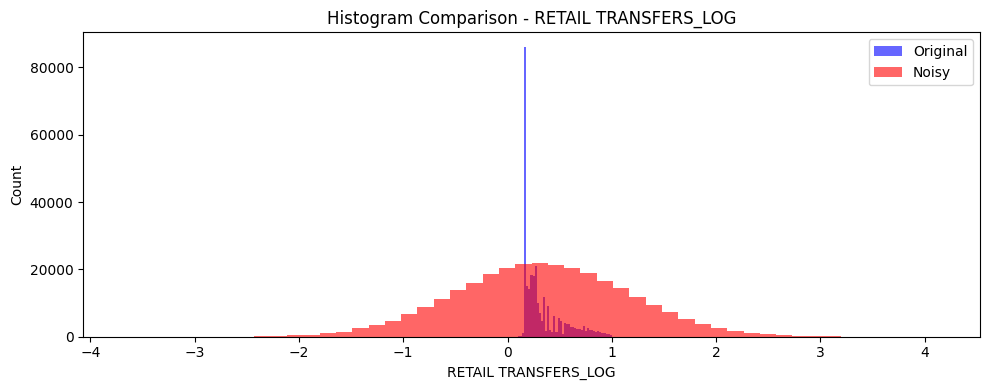

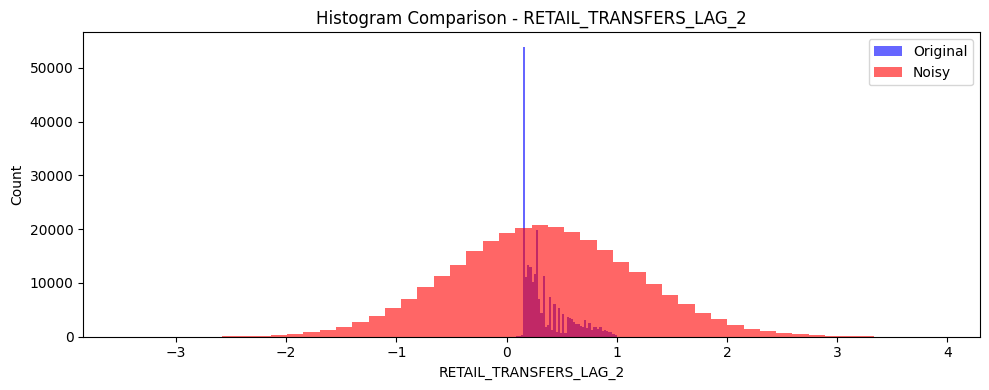

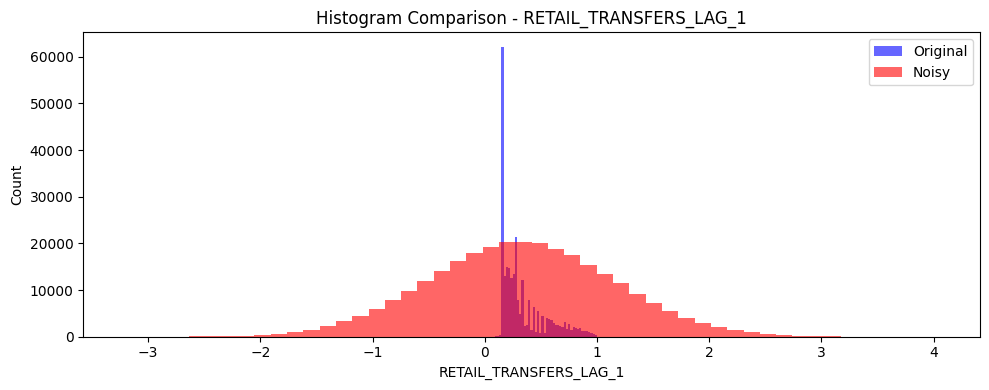

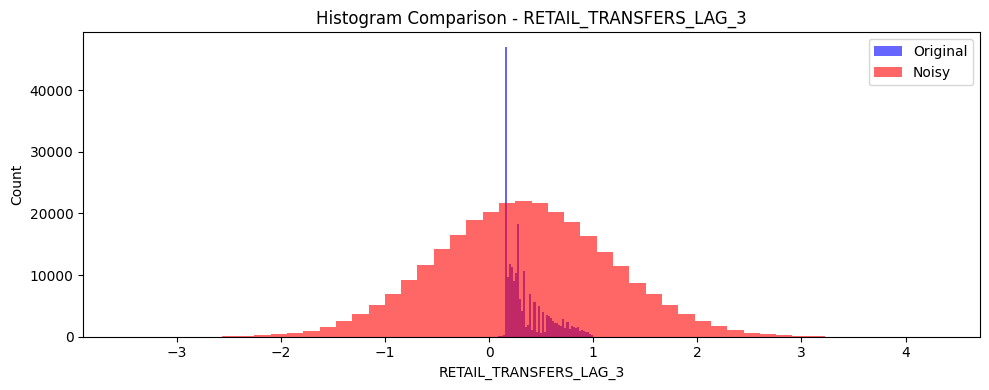

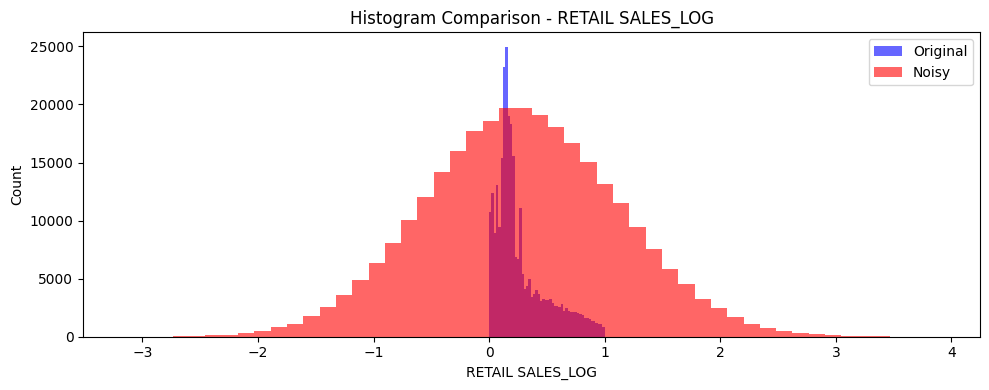

In [866]:
for col in top_columns:
    plt.figure(figsize=(10, 4))
    plt.hist(df[col], bins=50, alpha=0.6, label='Original', color='blue')
    plt.hist(noisy_df[col], bins=50, alpha=0.6, label='Noisy', color='red')
    plt.title(f'Histogram Comparison - {col}')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend()
    plt.tight_layout()
    plt.show()

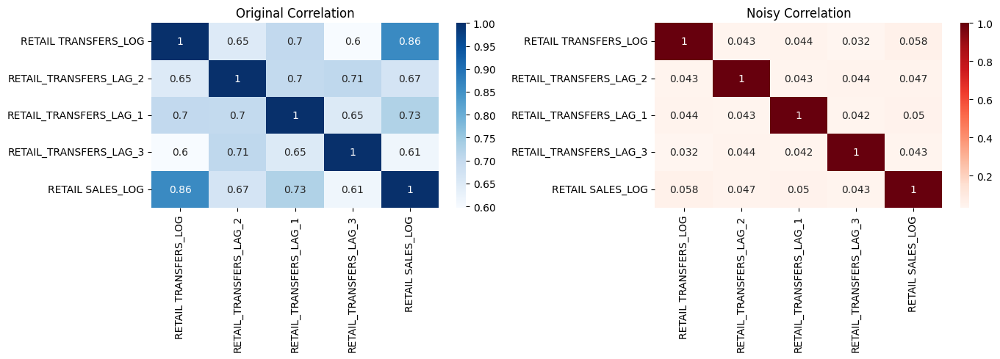

In [867]:
corr_original = df_model_final[top_columns].corr()
corr_noisy = noisy_df[top_columns].corr()

fig, axs = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(corr_original, annot=True, cmap='Blues', ax=axs[0])
axs[0].set_title("Original Correlation")

sns.heatmap(corr_noisy, annot=True, cmap='Reds', ax=axs[1])
axs[1].set_title("Noisy Correlation")
plt.tight_layout()
plt.show()


In [868]:
import numpy as np

def create_multistep_sequences(data, input_seq_len=12, forecast_horizon=6):
    X, y = [], []

    for i in range(len(data) - input_seq_len - forecast_horizon + 1):
        input_seq = data[i : i + input_seq_len]
        target_seq = data[i + input_seq_len : i + input_seq_len + forecast_horizon]
        X.append(input_seq)
        y.append(target_seq)

    return np.array(X), np.array(y)

In [869]:
feature_cols = df_model_final.select_dtypes(include=[np.number]).columns.tolist()
data_for_model = df_model_final[feature_cols].values

In [870]:
input_seq_len = 12  # past 12 months
forecast_horizon = 6  # predict next 6 months

X_seq, y_seq = create_multistep_sequences(data_for_model, input_seq_len, forecast_horizon)

print("Input shape (X):", X_seq.shape)
print("Output shape (y):", y_seq.shape)


Input shape (X): (289833, 12, 19)
Output shape (y): (289833, 6, 19)


In [871]:
# Define split ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Total number of samples
total_samples = X_seq.shape[0]

# Calculate split indices
train_end = int(total_samples * train_ratio)
val_end = int(total_samples * (train_ratio + val_ratio))

# Perform split
X_train, y_train = X_seq[:train_end], y_seq[:train_end]
X_val, y_val = X_seq[train_end:val_end], y_seq[train_end:val_end]
X_test, y_test = X_seq[val_end:], y_seq[val_end:]

# Print shapes
print(f"Train shape: {X_train.shape}, {y_train.shape}")
print(f"Validation shape: {X_val.shape}, {y_val.shape}")
print(f"Test shape: {X_test.shape}, {y_test.shape}")

Train shape: (202883, 12, 19), (202883, 6, 19)
Validation shape: (43475, 12, 19), (43475, 6, 19)
Test shape: (43475, 12, 19), (43475, 6, 19)


In [872]:
from google.colab import drive
import pandas as pd
import numpy as np
import os

# Mount Google Drive
drive.mount('/content/drive')

# Define save directory inside your Drive
save_dir = '/content/drive/MyDrive/retail_forecasting_sequences'
os.makedirs(save_dir, exist_ok=True)

# Function to flatten and save
def save_flattened_seq(X, y, name_prefix):
    # Flatten: (samples, timesteps, features) -> (samples, timesteps * features)
    X_flat = X.reshape(X.shape[0], -1)
    y_flat = y.reshape(y.shape[0], -1)

    # Convert to DataFrame
    X_df = pd.DataFrame(X_flat)
    y_df = pd.DataFrame(y_flat)

    # Save to Google Drive
    X_df.to_csv(f'{save_dir}/{name_prefix}_X.csv', index=False)
    y_df.to_csv(f'{save_dir}/{name_prefix}_y.csv', index=False)

# Save each split
save_flattened_seq(X_train, y_train, "train")
save_flattened_seq(X_val, y_val, "val")
save_flattened_seq(X_test, y_test, "test")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [873]:
def create_sequences(df, input_seq_len=12, output_seq_len=6):
    X_seq, y_seq = [], []
    for i in range(len(df) - input_seq_len - output_seq_len + 1):
        X_seq.append(df.iloc[i:i+input_seq_len].values)
        y_seq.append(df.iloc[i+input_seq_len:i+input_seq_len+output_seq_len].values)
    return np.array(X_seq), np.array(y_seq)

# Create sequences from noisy_df
X_seq_noisy, y_seq_noisy = create_sequences(noisy_df, input_seq_len=12, output_seq_len=6)


In [874]:
# Define split sizes
n_total = len(X_seq_noisy)
train_size = int(0.7 * n_total)
val_size = int(0.15 * n_total)

# Train / Val / Test Split
X_train_noisy = X_seq_noisy[:train_size]
y_train_noisy = y_seq_noisy[:train_size]

X_val_noisy = X_seq_noisy[train_size:train_size + val_size]
y_val_noisy = y_seq_noisy[train_size:train_size + val_size]

X_test_noisy = X_seq_noisy[train_size + val_size:]
y_test_noisy = y_seq_noisy[train_size + val_size:]


In [875]:
import pandas as pd
import os

# save directory
noisy_save_dir = '/content/drive/MyDrive/retail_forecasting_sequences_noisy'
os.makedirs(noisy_save_dir, exist_ok=True)

def save_flattened_noisy_seq(X, y, X_name, Y_name, save_path):
    X_flat = X.reshape(X.shape[0], -1)
    y_flat = y.reshape(y.shape[0], -1)

    X_df = pd.DataFrame(X_flat)
    y_df = pd.DataFrame(y_flat)

    X_df.to_csv(f'{save_path}/{X_name}.csv', index=False)
    y_df.to_csv(f'{save_path}/{Y_name}.csv', index=False)

# Save all noisy splits with specific variable-based file names
save_flattened_noisy_seq(X_train_noisy, y_train_noisy, "x_train_noisy", "y_train_noisy", noisy_save_dir)
save_flattened_noisy_seq(X_val_noisy, y_val_noisy, "x_val_noisy", "y_val_noisy", noisy_save_dir)
save_flattened_noisy_seq(X_test_noisy, y_test_noisy, "x_test_noisy", "y_test_noisy", noisy_save_dir)


In [876]:
import pandas as pd
import numpy as np

# Paths
base = "/content/drive/MyDrive/retail_forecasting_sequences"
files = {
    "x_train": f"{base}/train_X.csv",
    "y_train": f"{base}/train_y.csv",
    "x_val": f"{base}/val_X.csv",
    "y_val": f"{base}/val_y.csv",
    "x_test": f"{base}/test_X.csv",
    "y_test": f"{base}/test_y.csv"
}

# Config
input_seq_len = 12
forecast_horizon = 6

# Validation Function
def validate_flat_file(path, name, expected_timesteps):
    print(f"\n Validating {name} ({path}):")

    df = pd.read_csv(path)
    print(f" - Shape: {df.shape}")

    if df.isnull().any().any():
        print("  Contains missing values (NaNs)")
    else:
        print("  No NaNs")

    non_numeric = df.select_dtypes(exclude=[np.number]).columns.tolist()
    if non_numeric:
        print(f"  Contains non-numeric columns: {non_numeric}")
    else:
        print("  All columns are numeric")

    constant_cols = [col for col in df.columns if df[col].nunique() == 1]
    if constant_cols:
        print(f"   Columns with constant values: {constant_cols[:5]} (showing up to 5)")
    else:
        print("  No constant columns")

    # Normalization check
    min_val, max_val = df.min().min(), df.max().max()
    if 0.0 <= min_val and max_val <= 1.0:
        print(f"  Normalized: Min={min_val:.4f}, Max={max_val:.4f}")
    else:
        print(f"  Not normalized: Min={min_val:.4f}, Max={max_val:.4f}")

    # Reshape check
    num_features = df.shape[1]
    if num_features % expected_timesteps != 0:
        print(f"  Column count {num_features} not divisible by timesteps {expected_timesteps}")
    else:
        print(f"  Can reshape to (samples, {expected_timesteps}, {num_features // expected_timesteps})")

# Run Validation
validate_flat_file(files["x_train"], "x_train", input_seq_len)
validate_flat_file(files["y_train"], "y_train", forecast_horizon)
validate_flat_file(files["x_val"],   "x_val",   input_seq_len)
validate_flat_file(files["y_val"],   "y_val",   forecast_horizon)
validate_flat_file(files["x_test"],  "x_test",  input_seq_len)
validate_flat_file(files["y_test"],  "y_test",  forecast_horizon)



 Validating x_train (/content/drive/MyDrive/retail_forecasting_sequences/train_X.csv):
 - Shape: (202883, 228)
  No NaNs
  All columns are numeric
  No constant columns
  Not normalized: Min=0.0000, Max=34448.0000
  Can reshape to (samples, 12, 19)

 Validating y_train (/content/drive/MyDrive/retail_forecasting_sequences/train_y.csv):
 - Shape: (202883, 114)
  No NaNs
  All columns are numeric
  No constant columns
  Not normalized: Min=0.0000, Max=34448.0000
  Can reshape to (samples, 6, 19)

 Validating x_val (/content/drive/MyDrive/retail_forecasting_sequences/val_X.csv):
 - Shape: (43475, 228)
  No NaNs
  All columns are numeric
  No constant columns
  Not normalized: Min=0.0000, Max=34447.0000
  Can reshape to (samples, 12, 19)

 Validating y_val (/content/drive/MyDrive/retail_forecasting_sequences/val_y.csv):
 - Shape: (43475, 114)
  No NaNs
  All columns are numeric
  No constant columns
  Not normalized: Min=0.0000, Max=34447.0000
  Can reshape to (samples, 6, 19)

 Validating

In [877]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import joblib
import os

base = "/content/drive/MyDrive/retail_forecasting_sequences"
splits = ["train", "val", "test"]
input_seq_len, output_seq_len = 12, 6

def normalize_and_save(X_path, y_path, name):
    print(f" Normalizing {name}...")

    X = pd.read_csv(X_path)
    y = pd.read_csv(y_path)

    X_scaler = MinMaxScaler()
    y_scaler = MinMaxScaler()

    X_scaled = pd.DataFrame(X_scaler.fit_transform(X), columns=X.columns)
    y_scaled = pd.DataFrame(y_scaler.fit_transform(y), columns=y.columns)

    X_scaled.to_csv(f"{base}/{name}_X_norm.csv", index=False)
    y_scaled.to_csv(f"{base}/{name}_y_norm.csv", index=False)

    joblib.dump(X_scaler, f"{base}/{name}_X_scaler.save")
    joblib.dump(y_scaler, f"{base}/{name}_y_scaler.save")

    print(f" Saved {name}_X_norm.csv, {name}_y_norm.csv, and scalers.")

# Apply to all splits
for split in splits:
    normalize_and_save(f"{base}/{split}_X.csv", f"{base}/{split}_y.csv", split)


 Normalizing train...
 Saved train_X_norm.csv, train_y_norm.csv, and scalers.
 Normalizing val...
 Saved val_X_norm.csv, val_y_norm.csv, and scalers.
 Normalizing test...
 Saved test_X_norm.csv, test_y_norm.csv, and scalers.


In [878]:
import pandas as pd

base = "/content/drive/MyDrive/retail_forecasting_sequences"
splits = ["train", "val", "test"]
input_seq_len = 12
output_seq_len = 6

for split in splits:
    X_path = f"{base}/{split}_X_norm.csv"
    y_path = f"{base}/{split}_y_norm.csv"

    X = pd.read_csv(X_path)
    y = pd.read_csv(y_path)

    print(f"\n Validating {split} set:")
    print(f"  X shape: {X.shape}, Y shape: {y.shape}")

    # Check for NaNs
    if X.isnull().any().any() or y.isnull().any().any():
        print("Contains NaNs")
    else:
        print("No NaNs")

    # Check normalization
    x_min, x_max = X.min().min(), X.max().max()
    y_min, y_max = y.min().min(), y.max().max()
    print(f"  X Min: {x_min:.3f}, X Max: {x_max:.3f} | Normalized? {'Yes' if x_min >= 0 and x_max <= 1 else 'No'}")
    print(f"  Y Min: {y_min:.3f}, Y Max: {y_max:.3f} | Normalized? {'Yes' if y_min >= 0 and y_max <= 1 else 'No'}")

    # Can reshape back
    can_reshape_x = X.shape[1] % input_seq_len == 0
    can_reshape_y = y.shape[1] % output_seq_len == 0
    print(f" Reshape check: X → ({X.shape[0]}, {input_seq_len}, {X.shape[1]//input_seq_len}) | Pass? {can_reshape_x}")
    print(f" Y → ({y.shape[0]}, {output_seq_len}, {y.shape[1]//output_seq_len}) | Pass? {can_reshape_y}")



 Validating train set:
  X shape: (202883, 228), Y shape: (202883, 114)
No NaNs
  X Min: 0.000, X Max: 1.000 | Normalized? No
  Y Min: 0.000, Y Max: 1.000 | Normalized? Yes
 Reshape check: X → (202883, 12, 19) | Pass? True
 Y → (202883, 6, 19) | Pass? True

 Validating val set:
  X shape: (43475, 228), Y shape: (43475, 114)
No NaNs
  X Min: 0.000, X Max: 1.000 | Normalized? No
  Y Min: 0.000, Y Max: 1.000 | Normalized? No
 Reshape check: X → (43475, 12, 19) | Pass? True
 Y → (43475, 6, 19) | Pass? True

 Validating test set:
  X shape: (43475, 228), Y shape: (43475, 114)
No NaNs
  X Min: 0.000, X Max: 1.000 | Normalized? No
  Y Min: 0.000, Y Max: 1.000 | Normalized? No
 Reshape check: X → (43475, 12, 19) | Pass? True
 Y → (43475, 6, 19) | Pass? True


In [879]:
import pandas as pd
import numpy as np

# Paths
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"
files = {
    "x_train_noisy": f"{base}/x_train_noisy.csv",
    "y_train_noisy": f"{base}/x_test_noisy.csv",
    "x_val_noisy": f"{base}/x_val_noisy.csv",
    "y_val_noisy": f"{base}/y_test_noisy.csv",
    "x_test_noisy": f"{base}/y_train_noisy.csv",
    "y_test_noisy": f"{base}/y_val_noisy.csv"
}

# Config
input_seq_len = 12
forecast_horizon = 6

# Validation Function
def validate_flat_file(path, name, expected_timesteps):
    print(f"\nValidating {name} ({path}):")

    df = pd.read_csv(path)

    # Drop non-numeric columns
    non_numeric_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()
    if non_numeric_cols:
        print(f"  Dropping non-numeric columns: {non_numeric_cols}")
        df = df.drop(columns=non_numeric_cols)
    else:
        print("  All columns are numeric")

    print(f"  - Shape after dropping non-numeric: {df.shape}")

    # Check NaNs
    if df.isnull().any().any():
        print("  Contains missing values (NaNs)")
    else:
        print("  No NaNs")

    # Constant columns
    constant_cols = [col for col in df.columns if df[col].nunique() == 1]
    if constant_cols:
        print(f"  Columns with constant values: {constant_cols[:5]} (showing up to 5)")
    else:
        print("  No constant columns")

    # Normalization check
    min_val, max_val = df.min().min(), df.max().max()
    if 0.0 <= min_val and max_val <= 1.0:
        print(f"  Normalized: Min={min_val:.4f}, Max={max_val:.4f}")
    else:
        print(f"  Not normalized: Min={min_val:.4f}, Max={max_val:.4f}")

    # Reshape check
    num_features = df.shape[1]
    if num_features % expected_timesteps != 0:
        print(f"  Column count {num_features} not divisible by timesteps {expected_timesteps}")
    else:
        print(f"  Can reshape to (samples, {expected_timesteps}, {num_features // expected_timesteps})")

# Run Validation
validate_flat_file(files["x_train_noisy"], "x_train_noisy", input_seq_len)
validate_flat_file(files["y_train_noisy"], "y_train_noisy", forecast_horizon)
validate_flat_file(files["x_val_noisy"],   "x_val_noisy",   input_seq_len)
validate_flat_file(files["y_val_noisy"],   "y_val_noisy",   forecast_horizon)
validate_flat_file(files["x_test_noisy"],  "x_test_noisy",  input_seq_len)
validate_flat_file(files["y_test_noisy"],  "y_test_noisy",  forecast_horizon)



Validating x_train_noisy (/content/drive/MyDrive/retail_forecasting_sequences_noisy/x_train_noisy.csv):
  Dropping non-numeric columns: ['18', '38', '58', '78', '98', '118', '138', '158', '178', '198', '218', '238']
  - Shape after dropping non-numeric: (202883, 228)
  No NaNs
  No constant columns
  Not normalized: Min=-3.6785, Max=34448.5088
  Can reshape to (samples, 12, 19)

Validating y_train_noisy (/content/drive/MyDrive/retail_forecasting_sequences_noisy/x_test_noisy.csv):
  Dropping non-numeric columns: ['18', '38', '58', '78', '98', '118', '138', '158', '178', '198', '218', '238']
  - Shape after dropping non-numeric: (43476, 228)
  No NaNs
  No constant columns
  Not normalized: Min=-3.4159, Max=34437.5670
  Can reshape to (samples, 6, 38)

Validating x_val_noisy (/content/drive/MyDrive/retail_forecasting_sequences_noisy/x_val_noisy.csv):
  Dropping non-numeric columns: ['18', '38', '58', '78', '98', '118', '138', '158', '178', '198', '218', '238']
  - Shape after dropping n

In [880]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import joblib
import os

# Noisy base
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"
splits = ["train", "val", "test"]
input_seq_len, output_seq_len = 12, 6

def normalize_and_save(X_path, y_path, name):
    print(f"Normalizing {name}...")

    X = pd.read_csv(X_path)
    y = pd.read_csv(y_path)

    # Drop non-numeric columns
    X = X.select_dtypes(include=[float, int])
    y = y.select_dtypes(include=[float, int])

    # Fit and transform
    X_scaler = MinMaxScaler()
    y_scaler = MinMaxScaler()

    X_scaled = pd.DataFrame(X_scaler.fit_transform(X), columns=X.columns)
    y_scaled = pd.DataFrame(y_scaler.fit_transform(y), columns=y.columns)

    # Save normalized CSVs
    X_scaled.to_csv(f"{base}/{name}_X_norm.csv", index=False)
    y_scaled.to_csv(f"{base}/{name}_y_norm.csv", index=False)

    # Save scalers
    joblib.dump(X_scaler, f"{base}/{name}_X_scaler.save")
    joblib.dump(y_scaler, f"{base}/{name}_y_scaler.save")

    print(f"Saved {name}_X_norm.csv, {name}_y_norm.csv, and scalers.")

#  to all noisy splits
for split in splits:
    normalize_and_save(f"{base}/x_{split}_noisy.csv", f"{base}/y_{split}_noisy.csv", f"{split}_noisy")

Normalizing train_noisy...
Saved train_noisy_X_norm.csv, train_noisy_y_norm.csv, and scalers.
Normalizing val_noisy...
Saved val_noisy_X_norm.csv, val_noisy_y_norm.csv, and scalers.
Normalizing test_noisy...
Saved test_noisy_X_norm.csv, test_noisy_y_norm.csv, and scalers.


In [881]:
import pandas as pd

# Base path
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"
splits = ["train", "val", "test"]
input_seq_len = 12
output_seq_len = 6

for split in splits:
    X_path = f"{base}/{split}_noisy_X_norm.csv"
    y_path = f"{base}/{split}_noisy_y_norm.csv"

    X = pd.read_csv(X_path)
    y = pd.read_csv(y_path)

    print(f"\n Validating {split} (noisy) set:")
    print(f"  X shape: {X.shape}, Y shape: {y.shape}")

    # Check for NaNs
    if X.isnull().any().any() or y.isnull().any().any():
        print("   Contains NaNs")
    else:
        print("  No NaNs")

    # Check normalization
    x_min, x_max = X.min().min(), X.max().max()
    y_min, y_max = y.min().min(), y.max().max()
    print(f"  X Min: {x_min:.3f}, X Max: {x_max:.3f} | Normalized? {'Yes ' if x_min >= 0 and x_max <= 1 else 'No '}")
    print(f"  Y Min: {y_min:.3f}, Y Max: {y_max:.3f} | Normalized? {'Yes ' if y_min >= 0 and y_max <= 1 else 'No '}")

    # Can reshape back
    can_reshape_x = X.shape[1] % input_seq_len == 0
    can_reshape_y = y.shape[1] % output_seq_len == 0
    print(f"  X reshape check → ({X.shape[0]}, {input_seq_len}, {X.shape[1]//input_seq_len}) | Pass? {can_reshape_x}")
    print(f"  Y reshape check → ({y.shape[0]}, {output_seq_len}, {y.shape[1]//output_seq_len}) | Pass? {can_reshape_y}")



 Validating train (noisy) set:
  X shape: (202883, 228), Y shape: (202883, 114)
  No NaNs
  X Min: 0.000, X Max: 1.000 | Normalized? Yes 
  Y Min: 0.000, Y Max: 1.000 | Normalized? Yes 
  X reshape check → (202883, 12, 19) | Pass? True
  Y reshape check → (202883, 6, 19) | Pass? True

 Validating val (noisy) set:
  X shape: (43474, 228), Y shape: (43474, 114)
  No NaNs
  X Min: 0.000, X Max: 1.000 | Normalized? Yes 
  Y Min: 0.000, Y Max: 1.000 | Normalized? Yes 
  X reshape check → (43474, 12, 19) | Pass? True
  Y reshape check → (43474, 6, 19) | Pass? True

 Validating test (noisy) set:
  X shape: (43476, 228), Y shape: (43476, 114)
  No NaNs
  X Min: 0.000, X Max: 1.000 | Normalized? No 
  Y Min: 0.000, Y Max: 1.000 | Normalized? No 
  X reshape check → (43476, 12, 19) | Pass? True
  Y reshape check → (43476, 6, 19) | Pass? True


In [884]:
import pandas as pd
import numpy as np

# Config
input_seq_len = 12
output_seq_len = 6
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

# Load
X_train_noisy = pd.read_csv(f"{base}/train_noisy_X_norm.csv").values
y_train_noisy = pd.read_csv(f"{base}/train_noisy_y_norm.csv").values

# Reshape
num_x_features = X_train_noisy.shape[1] // input_seq_len
num_y_targets = y_train_noisy.shape[1] // output_seq_len

X_train_reshaped = X_train_noisy.reshape(-1, input_seq_len, num_x_features)
y_train_reshaped = y_train_noisy.reshape(-1, output_seq_len, num_y_targets)

print(" X_train reshaped:", X_train_reshaped.shape)
print(" y_train reshaped:", y_train_reshaped.shape)

np.save(f"{base}/X_train_noisy_reshaped.npy", X_train_reshaped)
np.save(f"{base}/y_train_noisy_reshaped.npy", y_train_reshaped)

print(" Reshaped noisy training arrays saved.")

 X_train reshaped: (202883, 12, 19)
 y_train reshaped: (202883, 6, 19)
 Reshaped noisy training arrays saved.


In [885]:
import pandas as pd
import numpy as np

# Config
input_seq_len = 12
output_seq_len = 6
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

# Load
X_val_noisy = pd.read_csv(f"{base}/val_noisy_X_norm.csv").values
y_val_noisy = pd.read_csv(f"{base}/val_noisy_y_norm.csv").values

# Reshape
num_x_features = X_val_noisy.shape[1] // input_seq_len
num_y_targets = y_val_noisy.shape[1] // output_seq_len

X_val_reshaped = X_val_noisy.reshape(-1, input_seq_len, num_x_features)
y_val_reshaped = y_val_noisy.reshape(-1, output_seq_len, num_y_targets)

# Print Shapes
print("X_val reshaped:", X_val_reshaped.shape)
print("y_val reshaped:", y_val_reshaped.shape)

np.save(f"{base}/X_val_noisy_reshaped.npy", X_val_reshaped)
np.save(f"{base}/y_val_noisy_reshaped.npy", y_val_reshaped)

print(" Reshaped noisy validation arrays saved.")

X_val reshaped: (43474, 12, 19)
y_val reshaped: (43474, 6, 19)
 Reshaped noisy validation arrays saved.


In [886]:
import pandas as pd
import numpy as np

# Config
input_seq_len = 12
output_seq_len = 6
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

# Load
X_test_noisy = pd.read_csv(f"{base}/test_noisy_X_norm.csv").values
y_test_noisy = pd.read_csv(f"{base}/test_noisy_y_norm.csv").values

# Reshape
num_x_features = X_test_noisy.shape[1] // input_seq_len
num_y_targets = y_test_noisy.shape[1] // output_seq_len

X_test_reshaped = X_test_noisy.reshape(-1, input_seq_len, num_x_features)
y_test_reshaped = y_test_noisy.reshape(-1, output_seq_len, num_y_targets)

# Print Shapes
print("X_test reshaped:", X_test_reshaped.shape)
print("y_test reshaped:", y_test_reshaped.shape)

# Save reshaped arrays
np.save(f"{base}/X_test_noisy_reshaped.npy", X_test_reshaped)
np.save(f"{base}/y_test_noisy_reshaped.npy", y_test_reshaped)

print(" Saved reshaped noisy test arrays to .npy")


X_test reshaped: (43476, 12, 19)
y_test reshaped: (43476, 6, 19)
 Saved reshaped noisy test arrays to .npy


In [887]:
import pandas as pd
import numpy as np

# Config
input_seq_len = 12
output_seq_len = 6
base = "/content/drive/MyDrive/retail_forecasting_sequences"

# Load
X_train = pd.read_csv(f"{base}/train_X_norm.csv").values
y_train = pd.read_csv(f"{base}/train_y_norm.csv").values

# Reshape
num_x_features = X_train.shape[1] // input_seq_len
num_y_targets = y_train.shape[1] // output_seq_len

X_train_reshaped = X_train.reshape(-1, input_seq_len, num_x_features)
y_train_reshaped = y_train.reshape(-1, output_seq_len, num_y_targets)

# Print Shapes
print("X_train reshaped:", X_train_reshaped.shape)
print("y_train reshaped:", y_train_reshaped.shape)
# Save reshaped arrays
np.save(f"{base}/X_train_reshaped.npy", X_train_reshaped)
np.save(f"{base}/y_train_reshaped.npy", y_train_reshaped)

print(" Saved reshaped training arrays to .npy")


X_train reshaped: (202883, 12, 19)
y_train reshaped: (202883, 6, 19)
 Saved reshaped training arrays to .npy


In [888]:
import pandas as pd
import numpy as np

# Config
input_seq_len = 12
output_seq_len = 6
base = "/content/drive/MyDrive/retail_forecasting_sequences"

# Load Validation Set
X_val = pd.read_csv(f"{base}/val_X_norm.csv").values
y_val = pd.read_csv(f"{base}/val_y_norm.csv").values

# Reshape
num_x_features = X_val.shape[1] // input_seq_len
num_y_targets = y_val.shape[1] // output_seq_len

X_val_reshaped = X_val.reshape(-1, input_seq_len, num_x_features)
y_val_reshaped = y_val.reshape(-1, output_seq_len, num_y_targets)

print("X_val reshaped:", X_val_reshaped.shape)
print("y_val reshaped:", y_val_reshaped.shape)

# Save reshaped arrays
np.save(f"{base}/X_val_reshaped.npy", X_val_reshaped)
np.save(f"{base}/y_val_reshaped.npy", y_val_reshaped)

print(" Saved reshaped validation arrays to .npy")


X_val reshaped: (43475, 12, 19)
y_val reshaped: (43475, 6, 19)
 Saved reshaped validation arrays to .npy


In [889]:
input_seq_len = 12
output_seq_len = 6
base = "/content/drive/MyDrive/retail_forecasting_sequences"

# Load Test Set
X_test = pd.read_csv(f"{base}/test_X_norm.csv").values
y_test = pd.read_csv(f"{base}/test_y_norm.csv").values

# Reshape
num_x_features = X_test.shape[1] // input_seq_len
num_y_targets = y_test.shape[1] // output_seq_len

X_test_reshaped = X_test.reshape(-1, input_seq_len, num_x_features)
y_test_reshaped = y_test.reshape(-1, output_seq_len, num_y_targets)

print("X_test reshaped:", X_test_reshaped.shape)
print("y_test reshaped:", y_test_reshaped.shape)
import numpy as np

# Save reshaped arrays to disk
np.save(f"{base}/X_test_reshaped.npy", X_test_reshaped)
np.save(f"{base}/y_test_reshaped.npy", y_test_reshaped)

print(" Saved reshaped test arrays to .npy")


X_test reshaped: (43475, 12, 19)
y_test reshaped: (43475, 6, 19)
 Saved reshaped test arrays to .npy


In [890]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, r2_score,
    mean_squared_log_error, explained_variance_score,
    max_error, median_absolute_error
)
import time

# Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
base = "/content/drive/MyDrive/retail_forecasting_sequences"

input_seq_len = 12
output_seq_len = 6
num_x_features = 19
num_y_targets = 19

hidden_size = 128
num_layers = 2
batch_size = 64
epochs = 20
lr = 0.001

#  Load Reshaped Arrays
X_train = np.load(f"{base}/X_train_reshaped.npy")
y_train = np.load(f"{base}/y_train_reshaped.npy")
X_val   = np.load(f"{base}/X_val_reshaped.npy")
y_val   = np.load(f"{base}/y_val_reshaped.npy")
X_test  = np.load(f"{base}/X_test_reshaped.npy")
y_test  = np.load(f"{base}/y_test_reshaped.npy")

# Convert to Tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(len(y_train), -1), dtype=torch.float32)
X_val   = torch.tensor(X_val, dtype=torch.float32)
y_val   = torch.tensor(y_val.reshape(len(y_val), -1), dtype=torch.float32)
X_test  = torch.tensor(X_test, dtype=torch.float32)
y_test  = torch.tensor(y_test.reshape(len(y_test), -1), dtype=torch.float32)

train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

# Model
class LSTMModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm = nn.LSTM(input_size=num_x_features, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_seq_len * num_y_targets)

    def forward(self, x):
        output, _ = self.lstm(x)
        out = self.fc(output[:, -1, :])
        return out

model = LSTMModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Evaluation Function
def evaluate_all(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "EVS": explained_variance_score(y_true, y_pred),
        "MSLE": mean_squared_log_error(np.clip(y_true, 0, None), np.clip(y_pred, 0, None)),
        "MAXE": np.max(np.abs(y_true - y_pred)),
        "MEDAE": median_absolute_error(y_true, y_pred)
    }

# Training
history = []
for epoch in range(1, epochs + 1):
    model.train()
    train_losses = []
    start_time = time.time()

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        pred = model(xb)
        loss = criterion(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    # Validation
    model.eval()
    val_preds, val_trues = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            val_preds.append(pred.cpu().numpy())
            val_trues.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds)
    val_trues = np.vstack(val_trues)
    metrics = evaluate_all(val_trues, val_preds)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch:02d} | Train Loss: {np.mean(train_losses):.4f} | "
          f"Val Loss: {metrics['MSE']:.4f} | R2: {metrics['R2']:.4f} | "
          f"MAE: {metrics['MAE']:.4f} | RMSE: {metrics['RMSE']:.4f} | Time: {epoch_time:.2f}s")

    history.append({
        "epoch": epoch,
        "train_loss": np.mean(train_losses),
        "val_loss": metrics["MSE"],
        "r2": metrics["R2"],
        "mae": metrics["MAE"],
        "rmse": metrics["RMSE"],
        "msle": metrics["MSLE"],
        "evs": metrics["EVS"],
        "max_error": metrics["MAXE"],
        "medae": metrics["MEDAE"],
        "time_sec": epoch_time
    })

# Save Results
hist_df = pd.DataFrame(history)
hist_df.to_csv(f"{base}/lstm_clean_history.csv", index=False)
torch.save(model.state_dict(), f"{base}/lstm_clean_model.pt")

# Final Test Evaluation
model.eval()
with torch.no_grad():
    test_preds = model(X_test.to(device)).cpu().numpy()
    metrics = evaluate_all(y_test.numpy(), test_preds)

print("\nFinal Test Evaluation:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


Epoch 01 | Train Loss: 0.0279 | Val Loss: 0.0293 | R2: 0.5706 | MAE: 0.1123 | RMSE: 0.1712 | Time: 17.09s
Epoch 02 | Train Loss: 0.0231 | Val Loss: 0.0276 | R2: 0.5906 | MAE: 0.1092 | RMSE: 0.1663 | Time: 18.59s
Epoch 03 | Train Loss: 0.0222 | Val Loss: 0.0283 | R2: 0.5836 | MAE: 0.1082 | RMSE: 0.1683 | Time: 17.23s
Epoch 04 | Train Loss: 0.0218 | Val Loss: 0.0269 | R2: 0.6023 | MAE: 0.1037 | RMSE: 0.1641 | Time: 18.41s
Epoch 05 | Train Loss: 0.0214 | Val Loss: 0.0268 | R2: 0.6047 | MAE: 0.1038 | RMSE: 0.1638 | Time: 17.85s
Epoch 06 | Train Loss: 0.0212 | Val Loss: 0.0269 | R2: 0.6040 | MAE: 0.1021 | RMSE: 0.1639 | Time: 17.45s
Epoch 07 | Train Loss: 0.0210 | Val Loss: 0.0273 | R2: 0.5991 | MAE: 0.1023 | RMSE: 0.1653 | Time: 18.41s
Epoch 08 | Train Loss: 0.0208 | Val Loss: 0.0270 | R2: 0.6030 | MAE: 0.1027 | RMSE: 0.1644 | Time: 17.03s
Epoch 09 | Train Loss: 0.0206 | Val Loss: 0.0274 | R2: 0.5984 | MAE: 0.1027 | RMSE: 0.1657 | Time: 18.53s
Epoch 10 | Train Loss: 0.0204 | Val Loss: 0.02

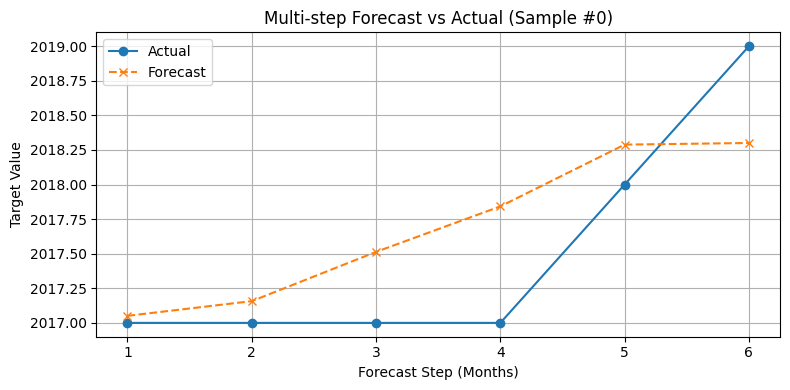

In [891]:
import matplotlib.pyplot as plt
import torch
import numpy as np
import joblib

#  Config
input_seq_len = 12
output_seq_len = 6
num_features = X_test_reshaped.shape[2]  # e.g., 20
target_index = 0

#  Load model
model = LSTMModel().to(device)
model.load_state_dict(torch.load(f"{base}/lstm_clean_model.pt"))
model.eval()

# Forecasting
X_test_tensor = torch.tensor(X_test_reshaped, dtype=torch.float32).to(device)
with torch.no_grad():
    preds = model(X_test_tensor).cpu().numpy()

# Reshape predictions to [N, output_seq_len, num_y_targets]
preds = preds.reshape(-1, output_seq_len, X_test_reshaped.shape[2])

# Inverse transform predictions and true values
y_scaler = joblib.load(f"{base}/train_y_scaler.save")
preds_inverse = y_scaler.inverse_transform(preds.reshape(-1, output_seq_len * num_features))
y_true_inverse = y_scaler.inverse_transform(y_test_reshaped.reshape(-1, output_seq_len * num_features))

# Pick one sample to visualize
sample_idx = 0
pred_series = preds_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]
true_series = y_true_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]

# Plot forecast vs actual
plt.figure(figsize=(8, 4))
plt.plot(range(1, output_seq_len + 1), true_series, marker='o', label="Actual")
plt.plot(range(1, output_seq_len + 1), pred_series, marker='x', linestyle='--', label="Forecast")
plt.title(f"Multi-step Forecast vs Actual (Sample #{sample_idx})")
plt.xlabel("Forecast Step (Months)")
plt.ylabel("Target Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [893]:
# Load NOISY Arrays
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"
X_train_noisy = np.load(f"{base}/X_train_noisy_reshaped.npy")
y_train_noisy = np.load(f"{base}/y_train_noisy_reshaped.npy")
X_val_noisy   = np.load(f"{base}/X_val_noisy_reshaped.npy")
y_val_noisy   = np.load(f"{base}/y_val_noisy_reshaped.npy")
X_test_noisy  = np.load(f"{base}/X_test_noisy_reshaped.npy")
y_test_noisy  = np.load(f"{base}/y_test_noisy_reshaped.npy")

# Convert to Tensors
X_train_noisy = torch.tensor(X_train_noisy, dtype=torch.float32)
y_train_noisy = torch.tensor(y_train_noisy.reshape(len(y_train_noisy), -1), dtype=torch.float32)
X_val_noisy   = torch.tensor(X_val_noisy, dtype=torch.float32)
y_val_noisy   = torch.tensor(y_val_noisy.reshape(len(y_val_noisy), -1), dtype=torch.float32)
X_test_noisy  = torch.tensor(X_test_noisy, dtype=torch.float32)
y_test_noisy  = torch.tensor(y_test_noisy.reshape(len(y_test_noisy), -1), dtype=torch.float32)

train_loader_noisy = DataLoader(TensorDataset(X_train_noisy, y_train_noisy), batch_size=batch_size, shuffle=True)
val_loader_noisy   = DataLoader(TensorDataset(X_val_noisy, y_val_noisy), batch_size=batch_size)


input_seq_len = 12
output_seq_len = 6
num_x_features = 19
num_y_targets = 19

hidden_size = 128
num_layers = 2
batch_size = 64
epochs = 20
lr = 0.001

# Model
class LSTMModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm = nn.LSTM(input_size=num_x_features, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_seq_len * num_y_targets)

    def forward(self, x):
        output, _ = self.lstm(x)
        out = self.fc(output[:, -1, :])
        return out

model = LSTMModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Evaluation Function
def evaluate_all(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "EVS": explained_variance_score(y_true, y_pred),
        "MSLE": mean_squared_log_error(np.clip(y_true, 0, None), np.clip(y_pred, 0, None)),
        "MAXE": np.max(np.abs(y_true - y_pred)),
        "MEDAE": median_absolute_error(y_true, y_pred)
    }

# Training
history_noisy= []
for epoch in range(1, epochs + 1):
    model.train()
    train_losses = []
    start_time = time.time()

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        pred = model(xb)
        loss = criterion(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    # Validation
    model.eval()
    val_preds, val_trues = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            val_preds.append(pred.cpu().numpy())
            val_trues.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds)
    val_trues = np.vstack(val_trues)
    metrics = evaluate_all(val_trues, val_preds)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch:02d} | Train Loss: {np.mean(train_losses):.4f} | "
          f"Val Loss: {metrics['MSE']:.4f} | R2: {metrics['R2']:.4f} | "
          f"MAE: {metrics['MAE']:.4f} | RMSE: {metrics['RMSE']:.4f} | Time: {epoch_time:.2f}s")

    history_noisy.append({
        "epoch": epoch,
        "train_loss": np.mean(train_losses),
        "val_loss": metrics["MSE"],
        "r2": metrics["R2"],
        "mae": metrics["MAE"],
        "rmse": metrics["RMSE"],
        "msle": metrics["MSLE"],
        "evs": metrics["EVS"],
        "max_error": metrics["MAXE"],
        "medae": metrics["MEDAE"],
        "time_sec": epoch_time
    })

# Save Results
hist_df = pd.DataFrame(history_noisy)
hist_df.to_csv(f"{base}/lstm_noisy_history.csv", index=False)
torch.save(model.state_dict(), f"{base}/lstm_noisy_model.pt")

# Final Test Evaluation
model.eval()
with torch.no_grad():
    test_preds = model(X_test.to(device)).cpu().numpy()
    metrics = evaluate_all(y_test.numpy(), test_preds)

print("\nFinal Test Evaluation:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


Epoch 01 | Train Loss: 0.0278 | Val Loss: 0.0290 | R2: 0.5705 | MAE: 0.1121 | RMSE: 0.1704 | Time: 18.80s
Epoch 02 | Train Loss: 0.0231 | Val Loss: 0.0279 | R2: 0.5881 | MAE: 0.1059 | RMSE: 0.1671 | Time: 18.42s
Epoch 03 | Train Loss: 0.0222 | Val Loss: 0.0274 | R2: 0.5953 | MAE: 0.1051 | RMSE: 0.1654 | Time: 17.22s
Epoch 04 | Train Loss: 0.0217 | Val Loss: 0.0268 | R2: 0.6036 | MAE: 0.1031 | RMSE: 0.1636 | Time: 18.67s
Epoch 05 | Train Loss: 0.0214 | Val Loss: 0.0268 | R2: 0.6048 | MAE: 0.1035 | RMSE: 0.1637 | Time: 17.20s
Epoch 06 | Train Loss: 0.0212 | Val Loss: 0.0268 | R2: 0.6037 | MAE: 0.1023 | RMSE: 0.1637 | Time: 18.66s
Epoch 07 | Train Loss: 0.0210 | Val Loss: 0.0268 | R2: 0.6056 | MAE: 0.1024 | RMSE: 0.1638 | Time: 17.22s
Epoch 08 | Train Loss: 0.0208 | Val Loss: 0.0271 | R2: 0.6010 | MAE: 0.1017 | RMSE: 0.1645 | Time: 18.67s
Epoch 09 | Train Loss: 0.0207 | Val Loss: 0.0269 | R2: 0.6044 | MAE: 0.1019 | RMSE: 0.1640 | Time: 17.25s
Epoch 10 | Train Loss: 0.0205 | Val Loss: 0.02

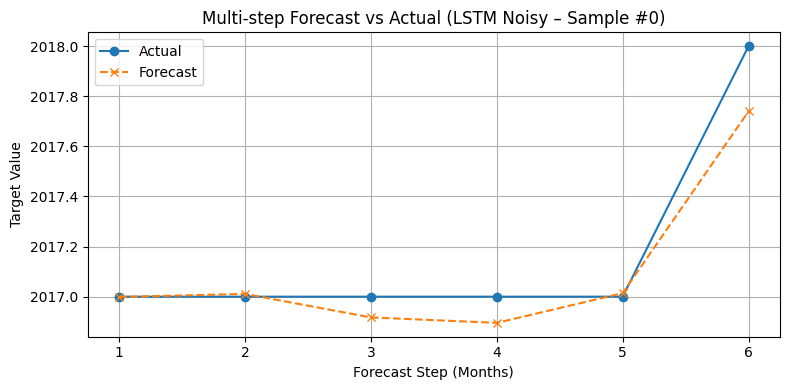

In [904]:
import matplotlib.pyplot as plt
import torch
import numpy as np
import joblib

# Config
input_seq_len = 12
output_seq_len = 6
target_index = 0
base_noisy = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

# Load Data
X_test_noisy = np.load(f"{base_noisy}/X_test_noisy_reshaped.npy")
y_test_noisy = np.load(f"{base_noisy}/y_test_noisy_reshaped.npy")
num_features = X_test_noisy.shape[2]

#  Define model
class LSTMModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.lstm = nn.LSTM(input_size=num_features, hidden_size=128,
                            num_layers=2, batch_first=True)
        self.fc = nn.Linear(128, output_seq_len * num_features)

    def forward(self, x):
        output, _ = self.lstm(x)
        out = self.fc(output[:, -1, :])
        return out

# Load model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = LSTMModel().to(device)
model.load_state_dict(torch.load(f"{base_noisy}/lstm_noisy_model.pt"))
model.eval()

# Forecasting
X_test_tensor = torch.tensor(X_test_noisy, dtype=torch.float32).to(device)
with torch.no_grad():
    preds = model(X_test_tensor).cpu().numpy()

# Reshape predictions to [N, output_seq_len, num_features]
preds = preds.reshape(-1, output_seq_len, num_features)

# Inverse transform
y_scaler = joblib.load(f"{base_noisy}/train_noisy_y_scaler.save")
preds_inverse = y_scaler.inverse_transform(preds.reshape(-1, output_seq_len * num_features))
y_true_inverse = y_scaler.inverse_transform(y_test_noisy.reshape(-1, output_seq_len * num_features))

# Pick one sample to visualize
sample_idx = 0
pred_series = preds_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]
true_series = y_true_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]

# Plot forecast vs actual
plt.figure(figsize=(8, 4))
plt.plot(range(1, output_seq_len + 1), true_series, marker='o', label="Actual")
plt.plot(range(1, output_seq_len + 1), pred_series, marker='x', linestyle='--', label="Forecast")
plt.title(f"Multi-step Forecast vs Actual (LSTM Noisy – Sample #{sample_idx})")
plt.xlabel("Forecast Step (Months)")
plt.ylabel("Target Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


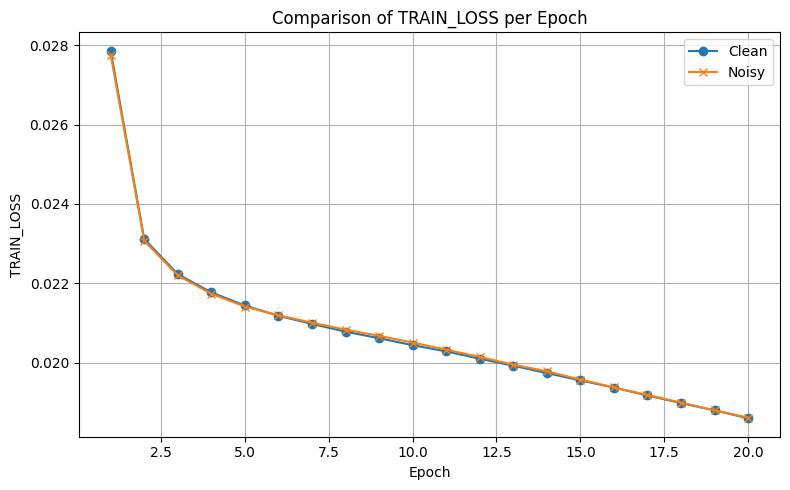

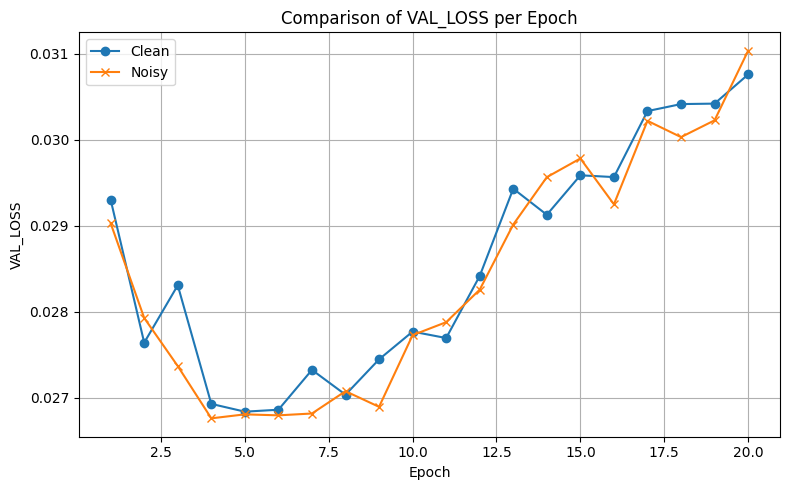

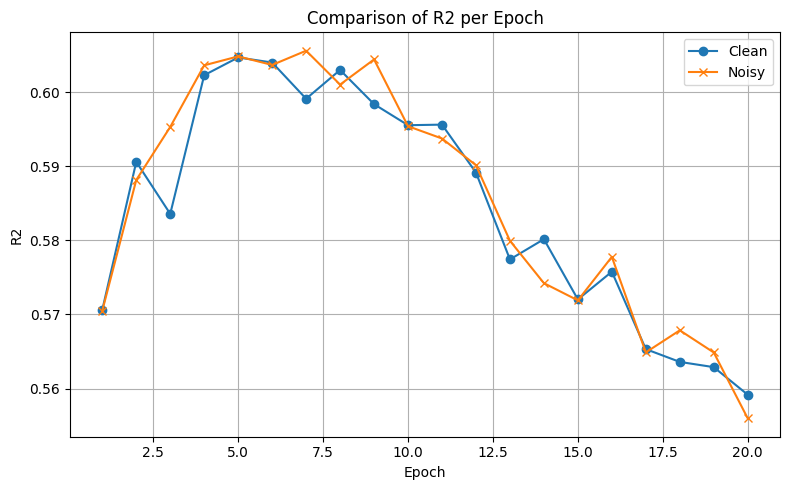

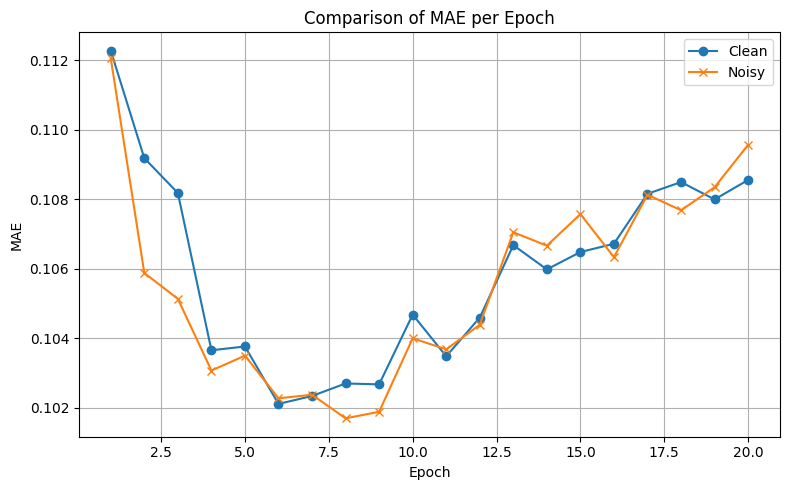

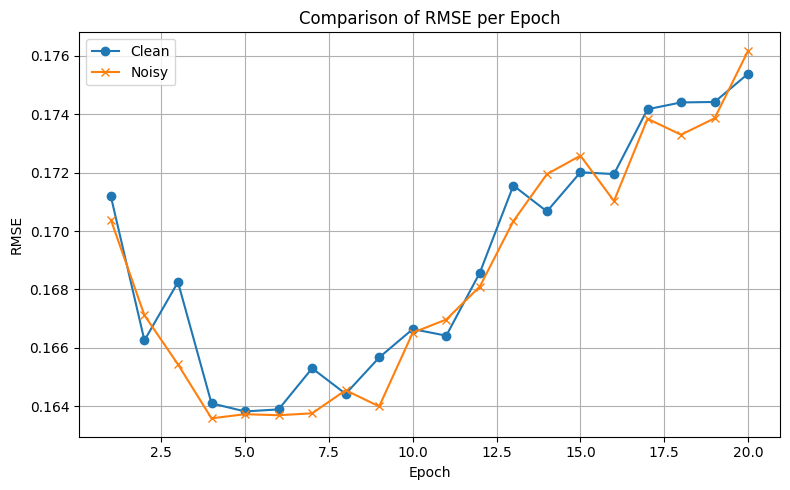

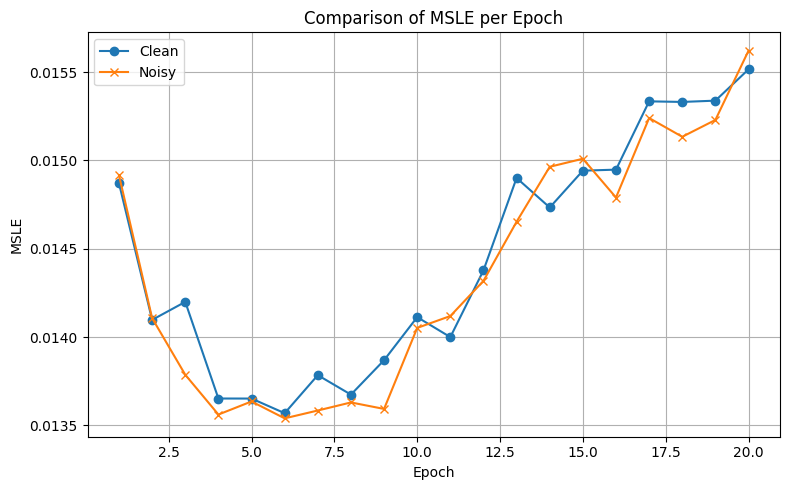

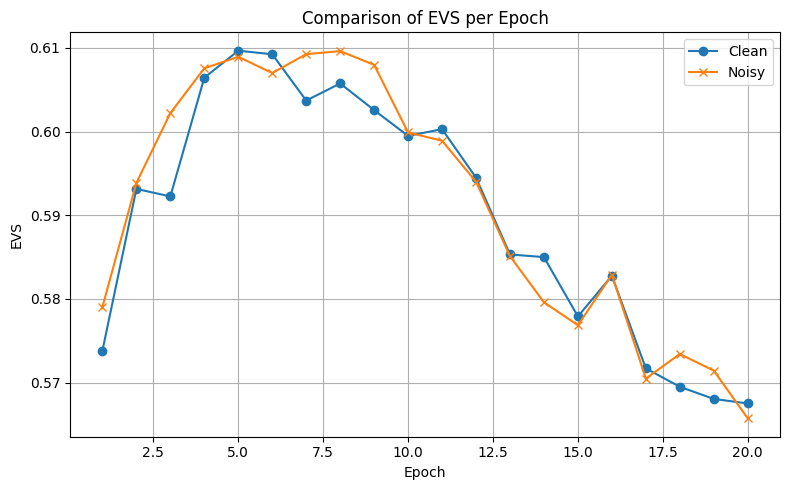

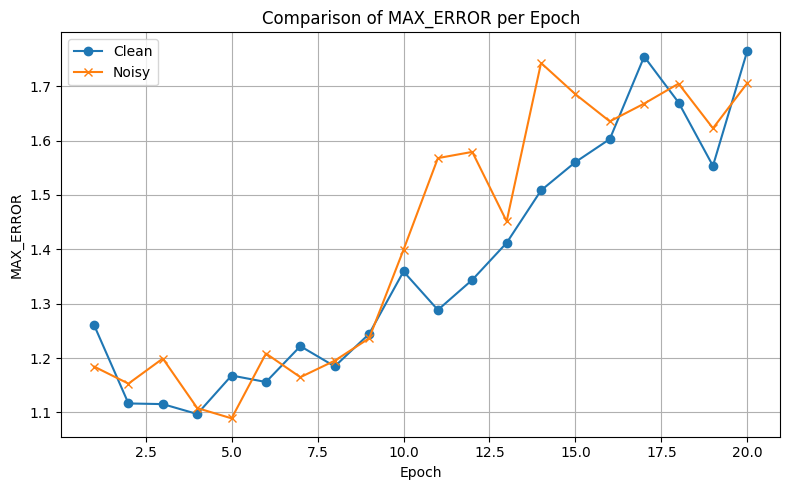

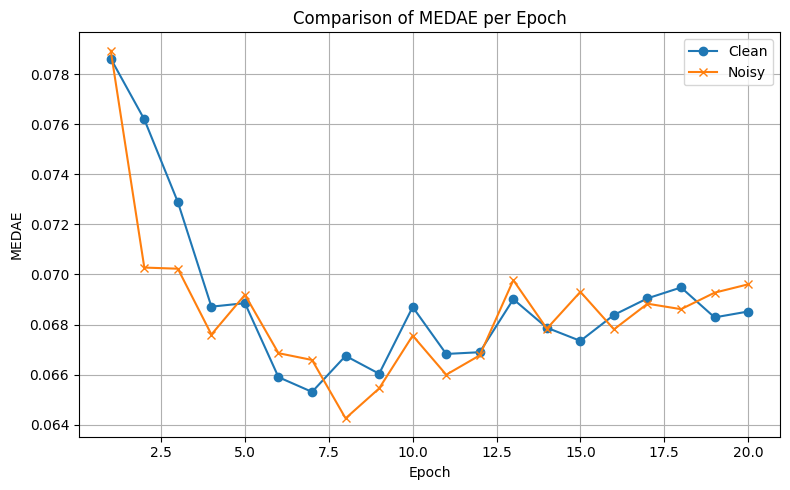

In [894]:
import pandas as pd
import matplotlib.pyplot as plt

# Load training histories
clean_history_path = "/content/drive/MyDrive/retail_forecasting_sequences/lstm_clean_history.csv"
noisy_history_path = "/content/drive/MyDrive/retail_forecasting_sequences_noisy/lstm_noisy_history.csv"

df_clean = pd.read_csv(clean_history_path)
df_noisy = pd.read_csv(noisy_history_path)

# Define metrics to compare
metrics = ["train_loss", "val_loss", "r2", "mae", "rmse", "msle", "evs", "max_error", "medae"]

# Plot
for metric in metrics:
    plt.figure(figsize=(8, 5))
    plt.plot(df_clean["epoch"], df_clean[metric], label="Clean", marker='o')
    plt.plot(df_noisy["epoch"], df_noisy[metric], label="Noisy", marker='x')
    plt.xlabel("Epoch")
    plt.ylabel(metric.upper())
    plt.title(f"Comparison of {metric.upper()} per Epoch")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [897]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, r2_score,
    mean_squared_log_error, explained_variance_score,
    max_error, median_absolute_error
)
import time

# Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
base = "/content/drive/MyDrive/retail_forecasting_sequences"

input_seq_len = 12
output_seq_len = 6
num_x_features = 19
num_y_targets = 19

batch_size = 64
epochs = 20
lr = 0.001

# Load Reshaped Arrays
X_train = np.load(f"{base}/X_train_reshaped.npy")
y_train = np.load(f"{base}/y_train_reshaped.npy")
X_val   = np.load(f"{base}/X_val_reshaped.npy")
y_val   = np.load(f"{base}/y_val_reshaped.npy")
X_test  = np.load(f"{base}/X_test_reshaped.npy")
y_test  = np.load(f"{base}/y_test_reshaped.npy")

# Convert to Tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(len(y_train), -1), dtype=torch.float32)
X_val   = torch.tensor(X_val, dtype=torch.float32)
y_val   = torch.tensor(y_val.reshape(len(y_val), -1), dtype=torch.float32)
X_test  = torch.tensor(X_test, dtype=torch.float32)
y_test  = torch.tensor(y_test.reshape(len(y_test), -1), dtype=torch.float32)

train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

# Model
class GRUModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.gru = nn.GRU(input_size=num_x_features, hidden_size=128,
                          num_layers=2, batch_first=True, dropout=0.3)
        self.fc1 = nn.Linear(128, 64)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, output_seq_len * num_y_targets)

    def forward(self, x):
        output, _ = self.gru(x)
        x = self.fc1(output[:, -1, :])
        x = self.relu(x)
        x = self.dropout(x)
        return self.fc2(x)

model = GRUModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Evaluation Function
def evaluate_all(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "EVS": explained_variance_score(y_true, y_pred),
        "MSLE": mean_squared_log_error(np.clip(y_true, 0, None), np.clip(y_pred, 0, None)),
        "MAXE": np.max(np.abs(y_true - y_pred)),
        "MEDAE": median_absolute_error(y_true, y_pred)
    }

# Training
history_gru = []
for epoch in range(1, epochs + 1):
    model.train()
    train_losses = []
    start_time = time.time()

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        pred = model(xb)
        loss = criterion(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    # Validation
    model.eval()
    val_preds, val_trues = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            val_preds.append(pred.cpu().numpy())
            val_trues.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds)
    val_trues = np.vstack(val_trues)
    metrics = evaluate_all(val_trues, val_preds)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch:02d} | Train Loss: {np.mean(train_losses):.4f} | "
          f"Val Loss: {metrics['MSE']:.4f} | R2: {metrics['R2']:.4f} | "
          f"MAE: {metrics['MAE']:.4f} | RMSE: {metrics['RMSE']:.4f} | Time: {epoch_time:.2f}s")

    history_gru.append({
        "epoch": epoch,
        "train_loss": np.mean(train_losses),
        "val_loss": metrics["MSE"],
        "r2": metrics["R2"],
        "mae": metrics["MAE"],
        "rmse": metrics["RMSE"],
        "msle": metrics["MSLE"],
        "evs": metrics["EVS"],
        "max_error": metrics["MAXE"],
        "medae": metrics["MEDAE"],
        "time_sec": epoch_time
    })

# Save Results
hist_df = pd.DataFrame(history_gru)
hist_df.to_csv(f"{base}/gru_clean_history.csv", index=False)
torch.save(model.state_dict(), f"{base}/gru_clean_model.pt")

# Final Test Evaluation
model.eval()
with torch.no_grad():
    test_preds = model(X_test.to(device)).cpu().numpy()
    metrics = evaluate_all(y_test.numpy(), test_preds)

print("\nFinal Test Evaluation:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


Epoch 01 | Train Loss: 0.0332 | Val Loss: 0.0318 | R2: 0.5334 | MAE: 0.1242 | RMSE: 0.1782 | Time: 17.87s
Epoch 02 | Train Loss: 0.0280 | Val Loss: 0.0309 | R2: 0.5415 | MAE: 0.1223 | RMSE: 0.1759 | Time: 20.79s
Epoch 03 | Train Loss: 0.0274 | Val Loss: 0.0295 | R2: 0.5629 | MAE: 0.1181 | RMSE: 0.1718 | Time: 19.70s
Epoch 04 | Train Loss: 0.0271 | Val Loss: 0.0298 | R2: 0.5592 | MAE: 0.1185 | RMSE: 0.1728 | Time: 17.86s
Epoch 05 | Train Loss: 0.0269 | Val Loss: 0.0294 | R2: 0.5660 | MAE: 0.1163 | RMSE: 0.1714 | Time: 19.47s
Epoch 06 | Train Loss: 0.0267 | Val Loss: 0.0295 | R2: 0.5662 | MAE: 0.1176 | RMSE: 0.1716 | Time: 19.70s
Epoch 07 | Train Loss: 0.0267 | Val Loss: 0.0295 | R2: 0.5648 | MAE: 0.1167 | RMSE: 0.1718 | Time: 18.87s
Epoch 08 | Train Loss: 0.0266 | Val Loss: 0.0294 | R2: 0.5667 | MAE: 0.1174 | RMSE: 0.1715 | Time: 19.40s
Epoch 09 | Train Loss: 0.0265 | Val Loss: 0.0297 | R2: 0.5615 | MAE: 0.1184 | RMSE: 0.1723 | Time: 18.82s
Epoch 10 | Train Loss: 0.0264 | Val Loss: 0.02

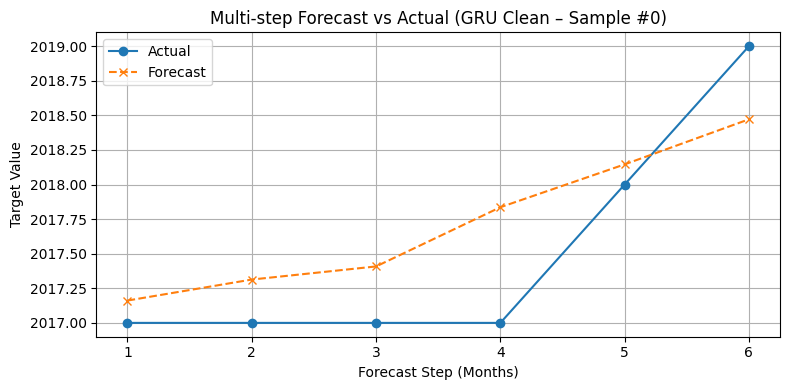

In [900]:
import torch.nn as nn

class GRUModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.gru = nn.GRU(input_size=num_x_features, hidden_size=128,
                          num_layers=2, batch_first=True, dropout=0.3)
        self.fc1 = nn.Linear(128, 64)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, output_seq_len * num_y_targets)

    def forward(self, x):
        output, _ = self.gru(x)
        x = self.fc1(output[:, -1, :])
        x = self.relu(x)
        x = self.dropout(x)
        return self.fc2(x)



# Config
input_seq_len = 12
output_seq_len = 6
num_features = X_test_reshaped.shape[2]
target_index = 0
base = "/content/drive/MyDrive/retail_forecasting_sequences"



# Load model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = GRUModel().to(device)
model.load_state_dict(torch.load(f"{base}/gru_clean_model.pt"))
model.eval()

# Forecast
X_test_tensor = torch.tensor(X_test_reshaped, dtype=torch.float32).to(device)
with torch.no_grad():
    preds = model(X_test_tensor).cpu().numpy()

# Reshape to [N, output_seq_len, num_features]
preds = preds.reshape(-1, output_seq_len, num_features)

# Inverse transform
y_scaler = joblib.load(f"{base}/train_y_scaler.save")
preds_inverse = y_scaler.inverse_transform(preds.reshape(-1, output_seq_len * num_features))
y_true_inverse = y_scaler.inverse_transform(y_test_reshaped.reshape(-1, output_seq_len * num_features))

# Visualize Sample Forecast
sample_idx = 0
pred_series = preds_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]
true_series = y_true_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]

plt.figure(figsize=(8, 4))
plt.plot(range(1, output_seq_len + 1), true_series, marker='o', label="Actual")
plt.plot(range(1, output_seq_len + 1), pred_series, marker='x', linestyle='--', label="Forecast")
plt.title(f"Multi-step Forecast vs Actual (GRU Clean – Sample #{sample_idx})")
plt.xlabel("Forecast Step (Months)")
plt.ylabel("Target Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [902]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, r2_score,
    mean_squared_log_error, explained_variance_score,
    max_error, median_absolute_error
)
import time

# Config
device = torch.device("cpu")
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

input_seq_len = 12
output_seq_len = 6
num_x_features = 19
num_y_targets = 19

batch_size = 64
epochs = 20
lr = 0.001

# Load Reshaped Arrays
X_train_noisy = np.load(f"{base}/X_train_noisy_reshaped.npy")
y_train_noisy = np.load(f"{base}/y_train_noisy_reshaped.npy")
X_val_noisy  = np.load(f"{base}/X_val_noisy_reshaped.npy")
y_val_noisy  = np.load(f"{base}/y_val_noisy_reshaped.npy")
X_test_noisy  = np.load(f"{base}/X_test_noisy_reshaped.npy")
y_test_noisy  = np.load(f"{base}/y_test_noisy_reshaped.npy")


# Convert to Tensors
X_train = torch.tensor(X_train_noisy, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(len(y_train), -1), dtype=torch.float32)
X_val   = torch.tensor(X_val_noisy, dtype=torch.float32)
y_val   = torch.tensor(y_val.reshape(len(y_val), -1), dtype=torch.float32)
X_test  = torch.tensor(X_test_noisy, dtype=torch.float32)
y_test  = torch.tensor(y_test.reshape(len(y_test), -1), dtype=torch.float32)

train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

# Model
class GRUModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.gru = nn.GRU(input_size=num_x_features, hidden_size=128,
                          num_layers=2, batch_first=True, dropout=0.3)
        self.fc1 = nn.Linear(128, 64)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, output_seq_len * num_y_targets)

    def forward(self, x):
        output, _ = self.gru(x)
        x = self.fc1(output[:, -1, :])
        x = self.relu(x)
        x = self.dropout(x)
        return self.fc2(x)

model = GRUModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Evaluation Function
def evaluate_all(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "EVS": explained_variance_score(y_true, y_pred),
        "MSLE": mean_squared_log_error(np.clip(y_true, 0, None), np.clip(y_pred, 0, None)),
        "MAXE": np.max(np.abs(y_true - y_pred)),
        "MEDAE": median_absolute_error(y_true, y_pred)
    }

# Training
history_gru_noisy = []
for epoch in range(1, epochs + 1):
    model.train()
    train_losses = []
    start_time = time.time()

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        pred = model(xb)
        loss = criterion(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    # Validation
    model.eval()
    val_preds, val_trues = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            val_preds.append(pred.cpu().numpy())
            val_trues.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds)
    val_trues = np.vstack(val_trues)
    metrics = evaluate_all(val_trues, val_preds)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch:02d} | Train Loss: {np.mean(train_losses):.4f} | "
          f"Val Loss: {metrics['MSE']:.4f} | R2: {metrics['R2']:.4f} | "
          f"MAE: {metrics['MAE']:.4f} | RMSE: {metrics['RMSE']:.4f} | Time: {epoch_time:.2f}s")

    history_gru_noisy.append({
        "epoch": epoch,
        "train_loss": np.mean(train_losses),
        "val_loss": metrics["MSE"],
        "r2": metrics["R2"],
        "mae": metrics["MAE"],
        "rmse": metrics["RMSE"],
        "msle": metrics["MSLE"],
        "evs": metrics["EVS"],
        "max_error": metrics["MAXE"],
        "medae": metrics["MEDAE"],
        "time_sec": epoch_time
    })

#  Save Results
hist_df = pd.DataFrame(history_gru_noisy)
hist_df.to_csv(f"{base}/gru_noisy_history_noisy.csv", index=False)
torch.save(model.state_dict(), f"{base}/gru_noisy_model_noisy.pt")

# Final Test Evaluation
model.eval()
with torch.no_grad():
    test_preds = model(X_test.to(device)).cpu().numpy()
    metrics = evaluate_all(y_test.numpy(), test_preds)

print("\nFinal Test Evaluation:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")

Epoch 01 | Train Loss: 0.0285 | Val Loss: 0.0231 | R2: 0.1777 | MAE: 0.1094 | RMSE: 0.1521 | Time: 97.10s
Epoch 02 | Train Loss: 0.0222 | Val Loss: 0.0224 | R2: 0.1913 | MAE: 0.1077 | RMSE: 0.1496 | Time: 94.10s
Epoch 03 | Train Loss: 0.0217 | Val Loss: 0.0222 | R2: 0.1941 | MAE: 0.1060 | RMSE: 0.1490 | Time: 94.58s
Epoch 04 | Train Loss: 0.0214 | Val Loss: 0.0227 | R2: 0.1870 | MAE: 0.1088 | RMSE: 0.1507 | Time: 95.10s
Epoch 05 | Train Loss: 0.0213 | Val Loss: 0.0219 | R2: 0.1992 | MAE: 0.1046 | RMSE: 0.1479 | Time: 95.28s
Epoch 06 | Train Loss: 0.0212 | Val Loss: 0.0217 | R2: 0.2002 | MAE: 0.1050 | RMSE: 0.1473 | Time: 94.48s
Epoch 07 | Train Loss: 0.0212 | Val Loss: 0.0222 | R2: 0.1942 | MAE: 0.1071 | RMSE: 0.1492 | Time: 94.05s
Epoch 08 | Train Loss: 0.0211 | Val Loss: 0.0218 | R2: 0.1977 | MAE: 0.1052 | RMSE: 0.1478 | Time: 96.36s
Epoch 09 | Train Loss: 0.0210 | Val Loss: 0.0225 | R2: 0.1903 | MAE: 0.1068 | RMSE: 0.1499 | Time: 93.30s
Epoch 10 | Train Loss: 0.0210 | Val Loss: 0.02

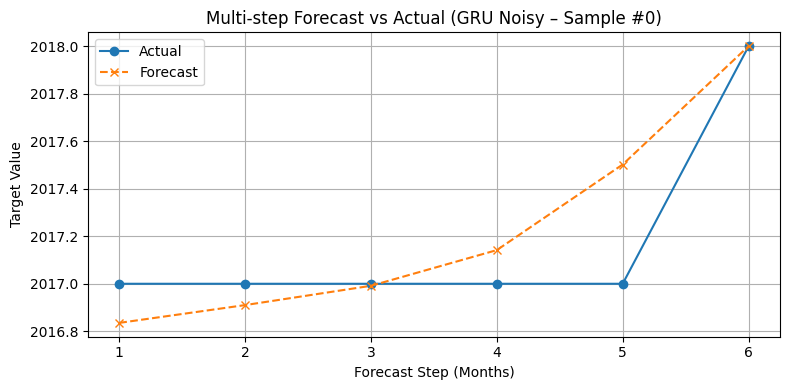

In [903]:
import torch.nn as nn
import torch
import numpy as np
import matplotlib.pyplot as plt
import joblib

# GRU Model Definition
class GRUModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.gru = nn.GRU(input_size=num_features, hidden_size=128,
                          num_layers=2, batch_first=True, dropout=0.3)
        self.fc1 = nn.Linear(128, 64)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, output_seq_len * num_features)

    def forward(self, x):
        output, _ = self.gru(x)  # [batch, seq_len, hidden]
        x = self.fc1(output[:, -1, :])
        x = self.relu(x)
        x = self.dropout(x)
        return self.fc2(x)

# Config
input_seq_len = 12
output_seq_len = 6
target_index = 0
base_noisy = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

# Load Noisy Data Arrays
X_test_noisy = np.load(f"{base_noisy}/X_test_noisy_reshaped.npy")
y_test_noisy = np.load(f"{base_noisy}/y_test_noisy_reshaped.npy")
num_features = X_test_noisy.shape[2]

# Load Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = GRUModel().to(device)
model.load_state_dict(torch.load(f"{base_noisy}/gru_noisy_model_noisy.pt"))
model.eval()

# Forecast
X_test_tensor = torch.tensor(X_test_noisy, dtype=torch.float32).to(device)
with torch.no_grad():
    preds = model(X_test_tensor).cpu().numpy()

# Reshape and Inverse Transform
preds = preds.reshape(-1, output_seq_len, num_features)

y_scaler = joblib.load(f"{base_noisy}/train_noisy_y_scaler.save")
preds_inverse = y_scaler.inverse_transform(preds.reshape(-1, output_seq_len * num_features))
y_true_inverse = y_scaler.inverse_transform(y_test_noisy.reshape(-1, output_seq_len * num_features))

# Visualize Forecast vs Actual
sample_idx = 0
pred_series = preds_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]
true_series = y_true_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]

plt.figure(figsize=(8, 4))
plt.plot(range(1, output_seq_len + 1), true_series, marker='o', label="Actual")
plt.plot(range(1, output_seq_len + 1), pred_series, marker='x', linestyle='--', label="Forecast")
plt.title(f"Multi-step Forecast vs Actual (GRU Noisy – Sample #{sample_idx})")
plt.xlabel("Forecast Step (Months)")
plt.ylabel("Target Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


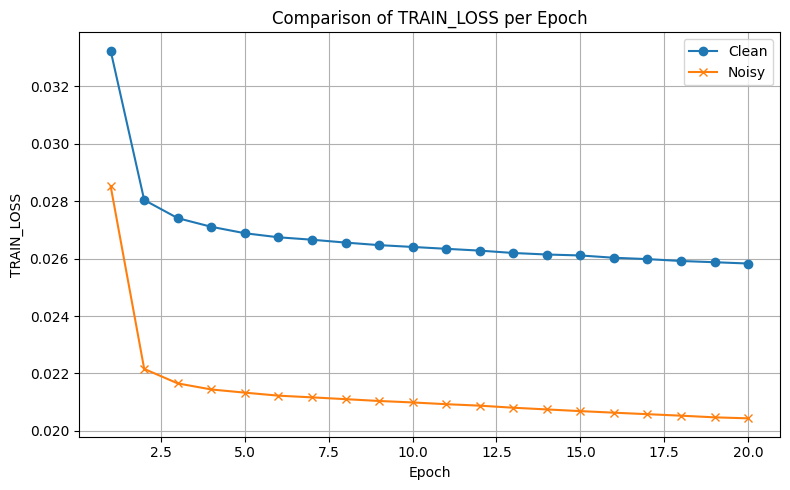

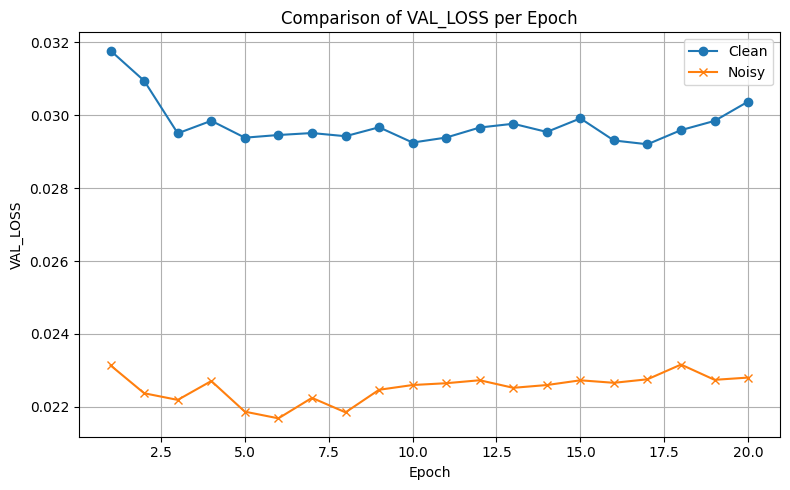

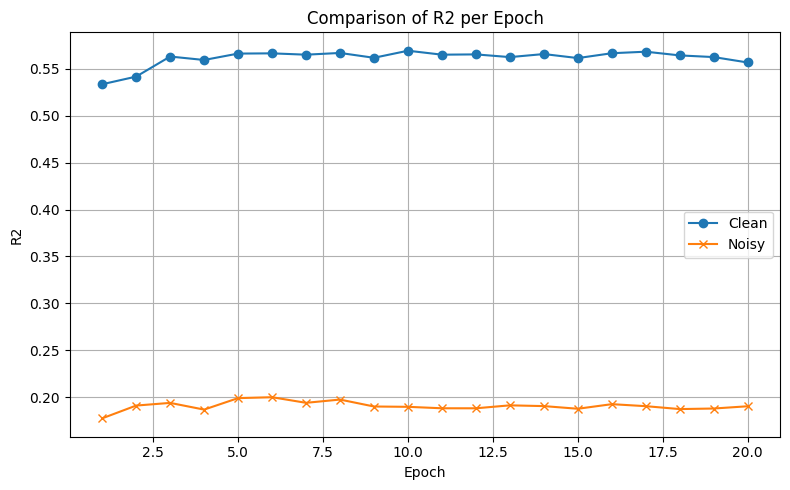

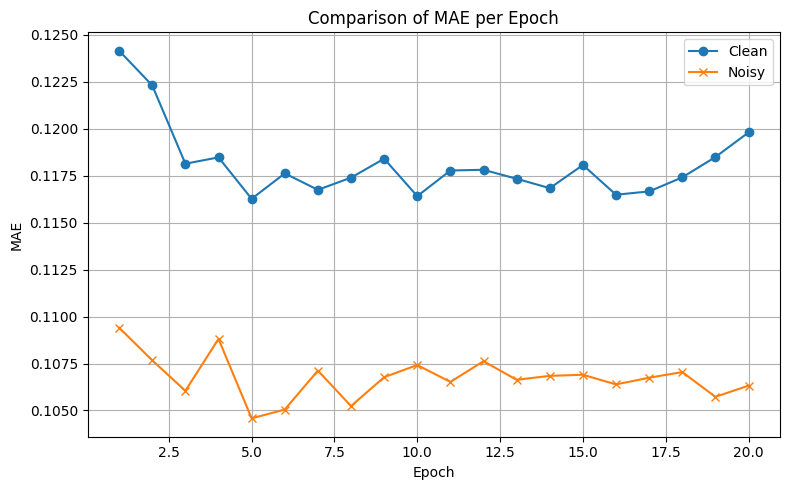

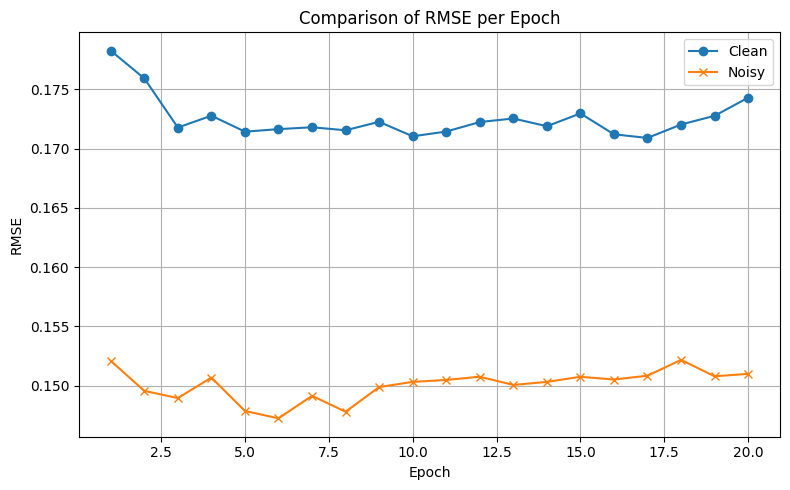

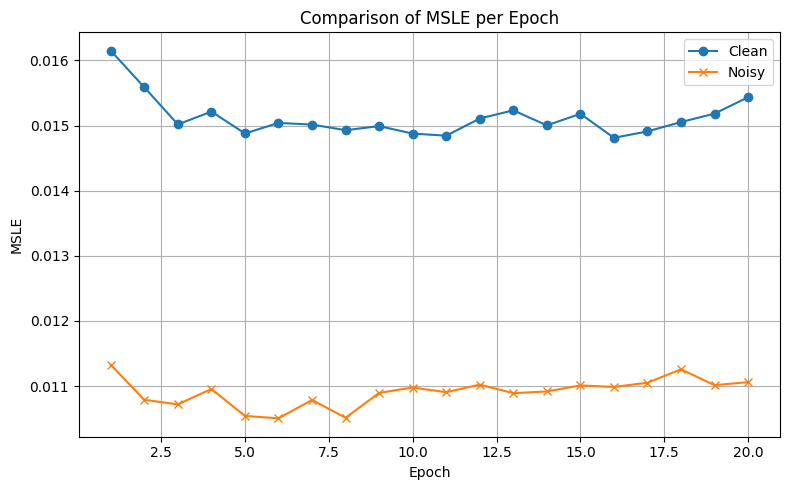

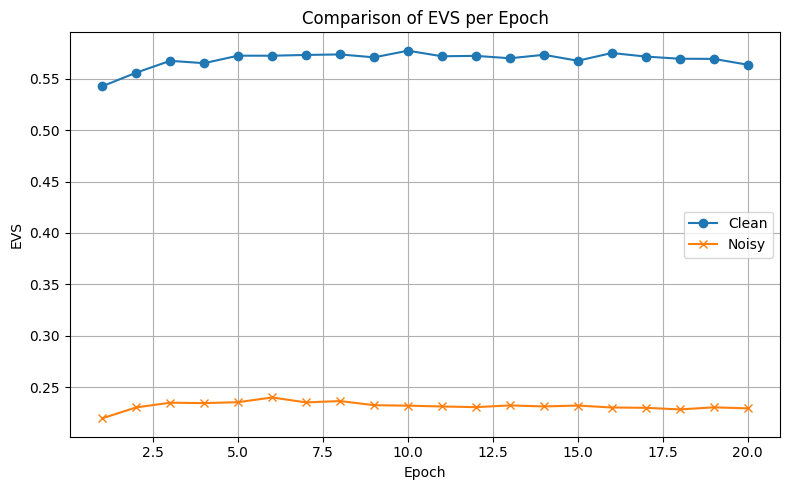

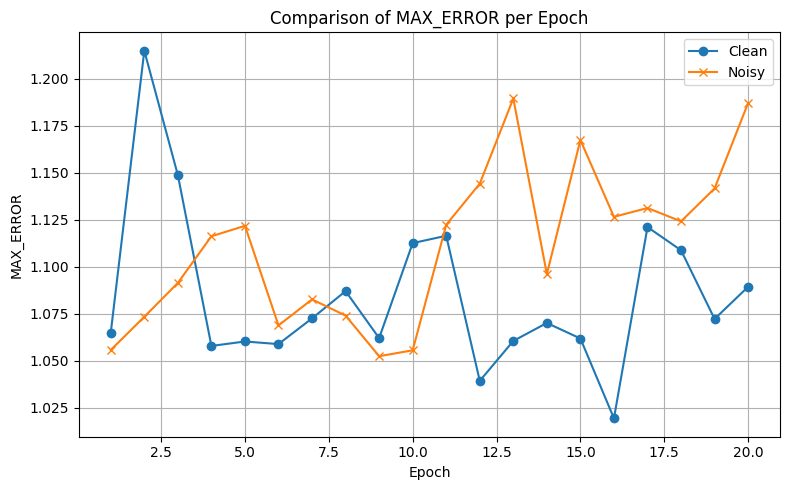

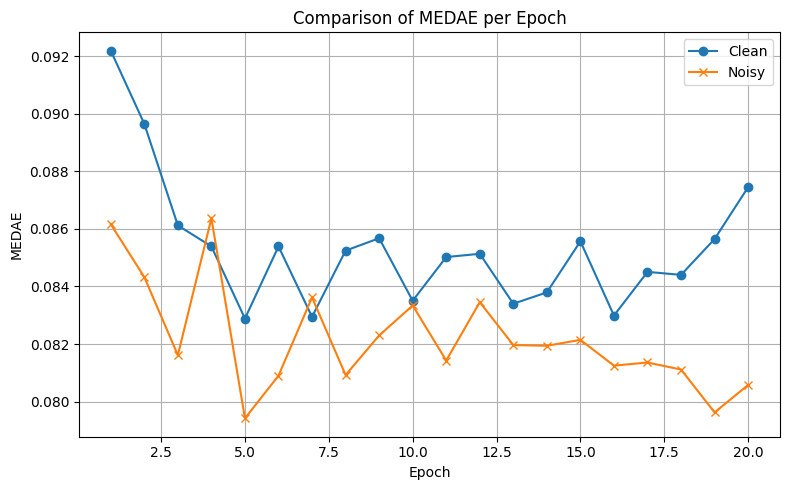

In [905]:
import pandas as pd
import matplotlib.pyplot as plt

#  Load training histories
clean_history_path = "/content/drive/MyDrive/retail_forecasting_sequences/gru_clean_history.csv"
noisy_history_path = "/content/drive/MyDrive/retail_forecasting_sequences_noisy/gru_noisy_history_noisy.csv"

df_clean = pd.read_csv(clean_history_path)
df_noisy = pd.read_csv(noisy_history_path)

# Define metrics to compare
metrics = ["train_loss", "val_loss", "r2", "mae", "rmse", "msle", "evs", "max_error", "medae"]

# Plot
for metric in metrics:
    plt.figure(figsize=(8, 5))
    plt.plot(df_clean["epoch"], df_clean[metric], label="Clean", marker='o')
    plt.plot(df_noisy["epoch"], df_noisy[metric], label="Noisy", marker='x')
    plt.xlabel("Epoch")
    plt.ylabel(metric.upper())
    plt.title(f"Comparison of {metric.upper()} per Epoch")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [906]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import time
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score, mean_squared_log_error, max_error, median_absolute_error

# Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
base = "/content/drive/MyDrive/retail_forecasting_sequences"

input_seq_len = 12
output_seq_len = 6
num_x_features = 19
num_y_targets = 19

batch_size = 64
epochs = 20
lr = 0.001

# Load Reshaped Arrays
X_train = np.load(f"{base}/X_train_reshaped.npy")
y_train = np.load(f"{base}/y_train_reshaped.npy")
X_val   = np.load(f"{base}/X_val_reshaped.npy")
y_val   = np.load(f"{base}/y_val_reshaped.npy")
X_test  = np.load(f"{base}/X_test_reshaped.npy")
y_test  = np.load(f"{base}/y_test_reshaped.npy")

# Convert to Tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(len(y_train), -1), dtype=torch.float32)
X_val   = torch.tensor(X_val, dtype=torch.float32)
y_val   = torch.tensor(y_val.reshape(len(y_val), -1), dtype=torch.float32)
X_test  = torch.tensor(X_test, dtype=torch.float32)
y_test  = torch.tensor(y_test.reshape(len(y_test), -1), dtype=torch.float32)

train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

# Transformer Model
class TimeSeriesTransformer(nn.Module):
    def __init__(self, input_dim, output_dim, seq_len, d_model=128, nhead=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.input_proj = nn.Linear(input_dim, d_model)
        self.positional_encoding = nn.Parameter(torch.randn(1, seq_len, d_model))
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.decoder = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        x = self.input_proj(x) + self.positional_encoding[:, :x.size(1), :]
        x = self.transformer(x)
        x = x[:, -1, :]  # Use the last time step
        return self.decoder(x)

model = TimeSeriesTransformer(
    input_dim=num_x_features,
    output_dim=output_seq_len * num_y_targets,
    seq_len=input_seq_len
).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Evaluation Function
def evaluate_all(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "EVS": explained_variance_score(y_true, y_pred),
        "MSLE": mean_squared_log_error(np.clip(y_true, 0, None), np.clip(y_pred, 0, None)),
        "MAXE": np.max(np.abs(y_true - y_pred)),
        "MEDAE": median_absolute_error(y_true, y_pred)
    }

# Training
history_transformer = []
for epoch in range(1, epochs + 1):
    model.train()
    train_losses = []
    start_time = time.time()

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        pred = model(xb)
        loss = criterion(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    # Validation
    model.eval()
    val_preds, val_trues = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            val_preds.append(pred.cpu().numpy())
            val_trues.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds)
    val_trues = np.vstack(val_trues)
    metrics = evaluate_all(val_trues, val_preds)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch:02d} | Train Loss: {np.mean(train_losses):.4f} | "
          f"Val Loss: {metrics['MSE']:.4f} | R2: {metrics['R2']:.4f} | "
          f"MAE: {metrics['MAE']:.4f} | RMSE: {metrics['RMSE']:.4f} | Time: {epoch_time:.2f}s")

    history_transformer.append({
        "epoch": epoch,
        "train_loss": np.mean(train_losses),
        "val_loss": metrics["MSE"],
        "r2": metrics["R2"],
        "mae": metrics["MAE"],
        "rmse": metrics["RMSE"],
        "msle": metrics["MSLE"],
        "evs": metrics["EVS"],
        "max_error": metrics["MAXE"],
        "medae": metrics["MEDAE"],
        "time_sec": epoch_time
    })

# Save
hist_df = pd.DataFrame(history_transformer)
hist_df.to_csv(f"{base}/transformer_clean_history.csv", index=False)
torch.save(model.state_dict(), f"{base}/transformer_clean_model.pt")

# Final Test
model.eval()
with torch.no_grad():
    test_preds = model(X_test.to(device)).cpu().numpy()
    metrics = evaluate_all(y_test.numpy(), test_preds)

print("\nFinal Test Evaluation:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


Epoch 01 | Train Loss: 0.0322 | Val Loss: 0.0308 | R2: 0.5432 | MAE: 0.1225 | RMSE: 0.1756 | Time: 40.14s
Epoch 02 | Train Loss: 0.0268 | Val Loss: 0.0298 | R2: 0.5612 | MAE: 0.1177 | RMSE: 0.1725 | Time: 38.93s
Epoch 03 | Train Loss: 0.0261 | Val Loss: 0.0293 | R2: 0.5650 | MAE: 0.1162 | RMSE: 0.1711 | Time: 41.64s
Epoch 04 | Train Loss: 0.0257 | Val Loss: 0.0297 | R2: 0.5654 | MAE: 0.1170 | RMSE: 0.1725 | Time: 38.58s
Epoch 05 | Train Loss: 0.0254 | Val Loss: 0.0289 | R2: 0.5726 | MAE: 0.1146 | RMSE: 0.1699 | Time: 40.19s
Epoch 06 | Train Loss: 0.0251 | Val Loss: 0.0282 | R2: 0.5801 | MAE: 0.1119 | RMSE: 0.1681 | Time: 39.73s
Epoch 07 | Train Loss: 0.0248 | Val Loss: 0.0283 | R2: 0.5811 | MAE: 0.1116 | RMSE: 0.1682 | Time: 39.62s
Epoch 08 | Train Loss: 0.0245 | Val Loss: 0.0285 | R2: 0.5787 | MAE: 0.1112 | RMSE: 0.1687 | Time: 41.39s
Epoch 09 | Train Loss: 0.0242 | Val Loss: 0.0281 | R2: 0.5826 | MAE: 0.1115 | RMSE: 0.1677 | Time: 40.02s
Epoch 10 | Train Loss: 0.0240 | Val Loss: 0.02

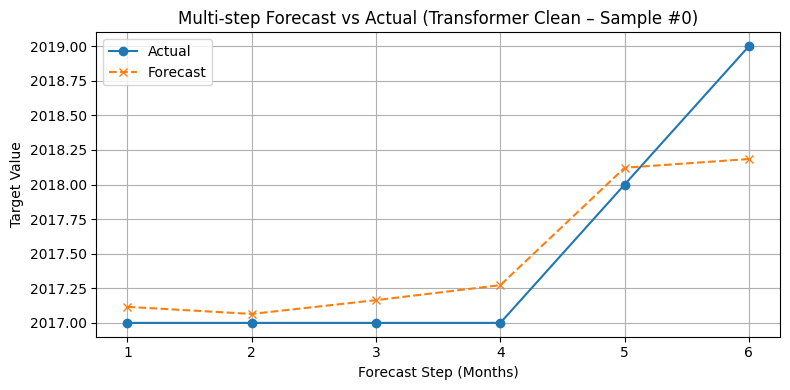

In [907]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import joblib

# Config
input_seq_len = 12
output_seq_len = 6
num_features = X_test_reshaped.shape[2]
target_index = 0
base = "/content/drive/MyDrive/retail_forecasting_sequences"

# Transformer Model
class TimeSeriesTransformer(nn.Module):
    def __init__(self, input_dim, output_dim, seq_len, d_model=128, nhead=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.input_proj = nn.Linear(input_dim, d_model)
        self.positional_encoding = nn.Parameter(torch.randn(1, seq_len, d_model))
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.decoder = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        x = self.input_proj(x) + self.positional_encoding[:, :x.size(1), :]
        x = self.transformer(x)
        x = x[:, -1, :]
        return self.decoder(x)

# Load model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TimeSeriesTransformer(
    input_dim=num_features,
    output_dim=output_seq_len * num_features,
    seq_len=input_seq_len
).to(device)

model.load_state_dict(torch.load(f"{base}/transformer_clean_model.pt"))
model.eval()

# Forecast
X_test_tensor = torch.tensor(X_test_reshaped, dtype=torch.float32).to(device)
with torch.no_grad():
    preds = model(X_test_tensor).cpu().numpy()

# Reshape and inverse transform
preds = preds.reshape(-1, output_seq_len, num_features)
y_scaler = joblib.load(f"{base}/train_y_scaler.save")
preds_inverse = y_scaler.inverse_transform(preds.reshape(-1, output_seq_len * num_features))
y_true_inverse = y_scaler.inverse_transform(y_test_reshaped.reshape(-1, output_seq_len * num_features))

# Visualize
sample_idx = 0
pred_series = preds_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]
true_series = y_true_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]

plt.figure(figsize=(8, 4))
plt.plot(range(1, output_seq_len + 1), true_series, marker='o', label="Actual")
plt.plot(range(1, output_seq_len + 1), pred_series, marker='x', linestyle='--', label="Forecast")
plt.title(f"Multi-step Forecast vs Actual (Transformer Clean – Sample #{sample_idx})")
plt.xlabel("Forecast Step (Months)")
plt.ylabel("Target Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [908]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score, mean_squared_log_error, max_error, median_absolute_error
import time

# Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

input_seq_len = 12
output_seq_len = 6
num_x_features = 19
num_y_targets = 19

batch_size = 64
epochs = 20
lr = 0.001

# Load Clean Data and Add Noise
X_train = np.load(f"{base}/X_train_noisy_reshaped.npy")
X_val   = np.load(f"{base}/X_val_noisy_reshaped.npy")
X_test = np.load(f"{base}/X_test_noisy_reshaped.npy")
y_train = np.load(f"{base}/y_train_noisy_reshaped.npy")
y_val   = np.load(f"{base}/y_val_noisy_reshaped.npy")
y_test  = np.load(f"{base}/y_test_noisy_reshaped.npy")


# Convert to Tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(len(y_train), -1), dtype=torch.float32)
X_val   = torch.tensor(X_val, dtype=torch.float32)
y_val   = torch.tensor(y_val.reshape(len(y_val), -1), dtype=torch.float32)
X_test  = torch.tensor(X_test, dtype=torch.float32)
y_test  = torch.tensor(y_test.reshape(len(y_test), -1), dtype=torch.float32)

train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

# Transformer Model
class TimeSeriesTransformer(nn.Module):
    def __init__(self, input_dim, output_dim, seq_len, d_model=128, nhead=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.input_proj = nn.Linear(input_dim, d_model)
        self.positional_encoding = nn.Parameter(torch.randn(1, seq_len, d_model))
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.decoder = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        x = self.input_proj(x) + self.positional_encoding[:, :x.size(1), :]
        x = self.transformer(x)
        return self.decoder(x[:, -1, :])

model = TimeSeriesTransformer(
    input_dim=num_x_features,
    output_dim=output_seq_len * num_y_targets,
    seq_len=input_seq_len
).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Evaluation Function
def evaluate_all(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "EVS": explained_variance_score(y_true, y_pred),
        "MSLE": mean_squared_log_error(np.clip(y_true, 0, None), np.clip(y_pred, 0, None)),
        "MAXE": np.max(np.abs(y_true - y_pred)),
        "MEDAE": median_absolute_error(y_true, y_pred)
    }

# Training
history_transformer_noisy = []
for epoch in range(1, epochs + 1):
    model.train()
    train_losses = []
    start_time = time.time()

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        pred = model(xb)
        loss = criterion(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    model.eval()
    val_preds, val_trues = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            val_preds.append(pred.cpu().numpy())
            val_trues.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds)
    val_trues = np.vstack(val_trues)
    metrics = evaluate_all(val_trues, val_preds)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch:02d} | Train Loss: {np.mean(train_losses):.4f} | "
          f"Val Loss: {metrics['MSE']:.4f} | R2: {metrics['R2']:.4f} | "
          f"MAE: {metrics['MAE']:.4f} | RMSE: {metrics['RMSE']:.4f} | Time: {epoch_time:.2f}s")

    history_transformer_noisy.append({
        "epoch": epoch,
        "train_loss": np.mean(train_losses),
        "val_loss": metrics["MSE"],
        "r2": metrics["R2"],
        "mae": metrics["MAE"],
        "rmse": metrics["RMSE"],
        "msle": metrics["MSLE"],
        "evs": metrics["EVS"],
        "max_error": metrics["MAXE"],
        "medae": metrics["MEDAE"],
        "time_sec": epoch_time
    })

# Save
hist_df = pd.DataFrame(history_transformer_noisy)
hist_df.to_csv(f"{base}/transformer_noisy_history.csv", index=False)
torch.save(model.state_dict(), f"{base}/transformer_noisy_model.pt")

# Final Test
model.eval()
with torch.no_grad():
    test_preds = model(X_test.to(device)).cpu().numpy()
    metrics = evaluate_all(y_test.numpy(), test_preds)

print("\nFinal Test Evaluation:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


Epoch 01 | Train Loss: 0.0267 | Val Loss: 0.0228 | R2: 0.1842 | MAE: 0.1081 | RMSE: 0.1509 | Time: 39.15s
Epoch 02 | Train Loss: 0.0218 | Val Loss: 0.0223 | R2: 0.1902 | MAE: 0.1059 | RMSE: 0.1493 | Time: 40.30s
Epoch 03 | Train Loss: 0.0213 | Val Loss: 0.0221 | R2: 0.1940 | MAE: 0.1055 | RMSE: 0.1487 | Time: 40.03s
Epoch 04 | Train Loss: 0.0211 | Val Loss: 0.0220 | R2: 0.1977 | MAE: 0.1045 | RMSE: 0.1482 | Time: 40.10s
Epoch 05 | Train Loss: 0.0209 | Val Loss: 0.0222 | R2: 0.1924 | MAE: 0.1052 | RMSE: 0.1490 | Time: 40.00s
Epoch 06 | Train Loss: 0.0208 | Val Loss: 0.0219 | R2: 0.1972 | MAE: 0.1041 | RMSE: 0.1479 | Time: 41.55s
Epoch 07 | Train Loss: 0.0207 | Val Loss: 0.0223 | R2: 0.1917 | MAE: 0.1062 | RMSE: 0.1493 | Time: 38.33s
Epoch 08 | Train Loss: 0.0206 | Val Loss: 0.0221 | R2: 0.1945 | MAE: 0.1041 | RMSE: 0.1488 | Time: 40.05s
Epoch 09 | Train Loss: 0.0204 | Val Loss: 0.0222 | R2: 0.1936 | MAE: 0.1049 | RMSE: 0.1490 | Time: 40.01s
Epoch 10 | Train Loss: 0.0203 | Val Loss: 0.02

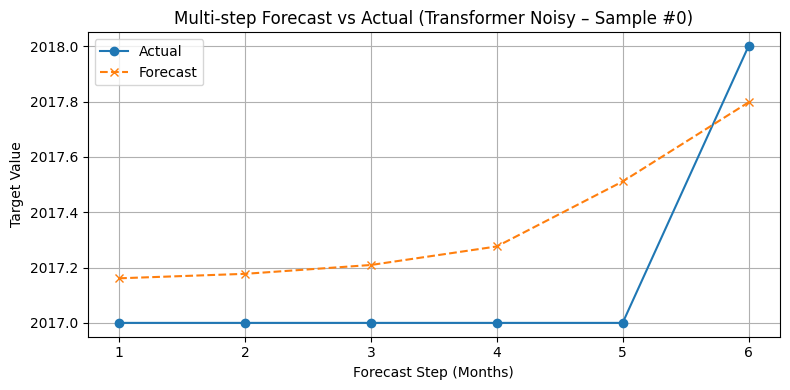

In [910]:
import torch.nn as nn
import torch
import numpy as np
import matplotlib.pyplot as plt
import joblib

# Transformer Model Definition

class TimeSeriesTransformer(nn.Module):
    def __init__(self, input_dim, output_dim, seq_len, d_model=128, nhead=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.input_proj = nn.Linear(input_dim, d_model)
        self.positional_encoding = nn.Parameter(torch.randn(1, seq_len, d_model))
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.decoder = nn.Sequential(
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        x = self.input_proj(x) + self.positional_encoding[:, :x.size(1), :]
        x = self.transformer(x)
        return self.decoder(x[:, -1, :])
# Config
input_seq_len = 12
output_seq_len = 6
target_index = 0
base_noisy = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

# Load Noisy Data Arrays
X_test_noisy = np.load(f"{base_noisy}/X_test_noisy_reshaped.npy")
y_test_noisy = np.load(f"{base_noisy}/y_test_noisy_reshaped.npy")
num_features = X_test_noisy.shape[2]

# Load Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TimeSeriesTransformer(
    input_dim=num_features,
    output_dim=output_seq_len * num_features,
    seq_len=input_seq_len
).to(device)
model.load_state_dict(torch.load(f"{base_noisy}/transformer_noisy_model.pt"))
model.eval()

# Forecast
X_test_tensor = torch.tensor(X_test_noisy, dtype=torch.float32).to(device)
with torch.no_grad():
    preds = model(X_test_tensor).cpu().numpy()

# Reshape and Inverse Transform
preds = preds.reshape(-1, output_seq_len, num_features)

y_scaler = joblib.load(f"{base_noisy}/train_noisy_y_scaler.save")
preds_inverse = y_scaler.inverse_transform(preds.reshape(-1, output_seq_len * num_features))
y_true_inverse = y_scaler.inverse_transform(y_test_noisy.reshape(-1, output_seq_len * num_features))

# Visualize Forecast vs Actual
sample_idx = 0
pred_series = preds_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]
true_series = y_true_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]

plt.figure(figsize=(8, 4))
plt.plot(range(1, output_seq_len + 1), true_series, marker='o', label="Actual")
plt.plot(range(1, output_seq_len + 1), pred_series, marker='x', linestyle='--', label="Forecast")
plt.title(f"Multi-step Forecast vs Actual (Transformer Noisy – Sample #{sample_idx})")
plt.xlabel("Forecast Step (Months)")
plt.ylabel("Target Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


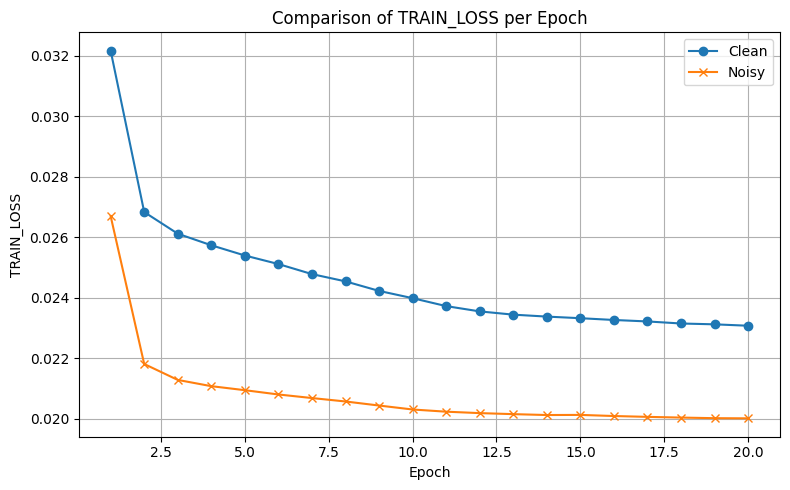

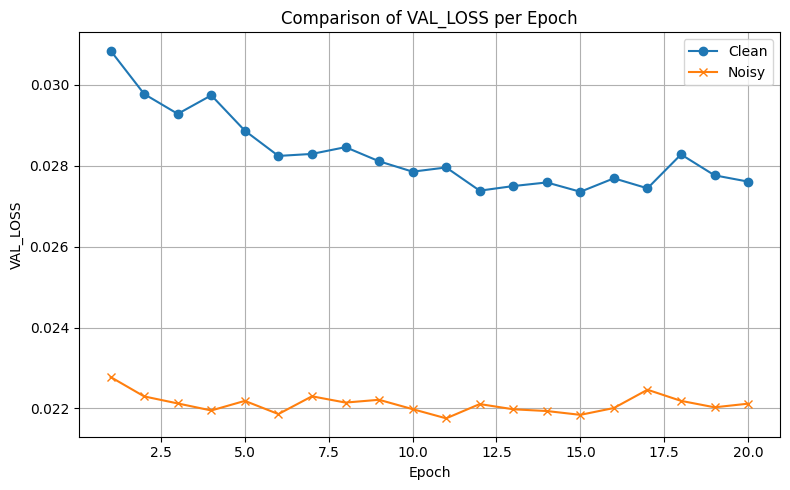

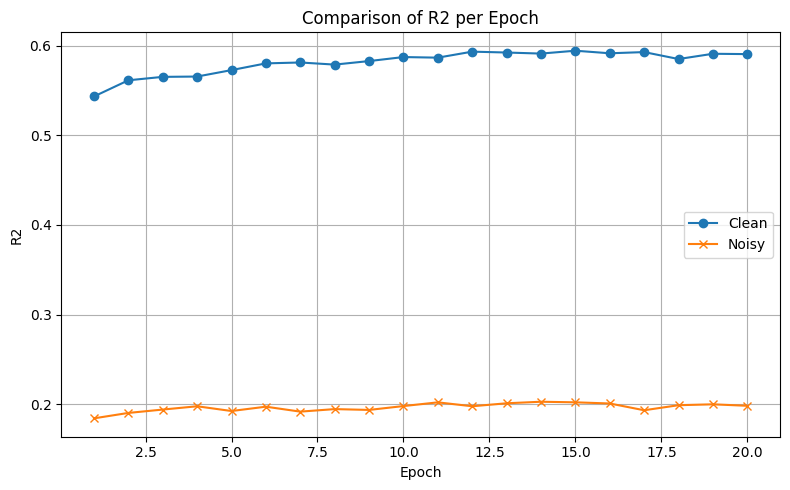

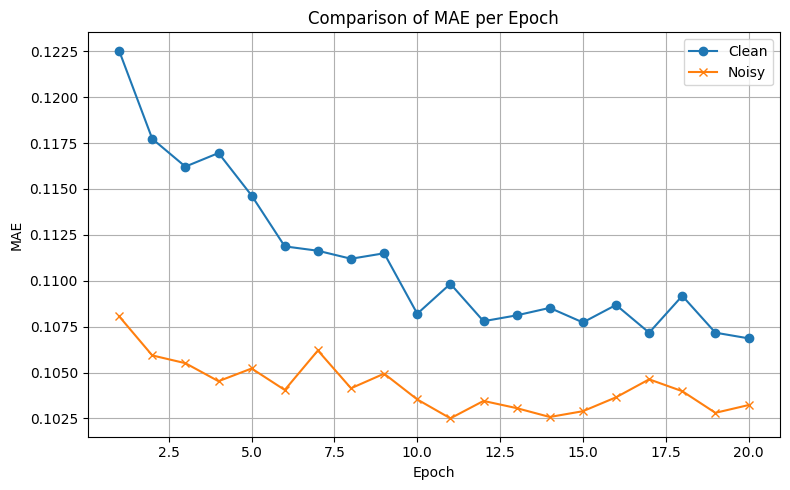

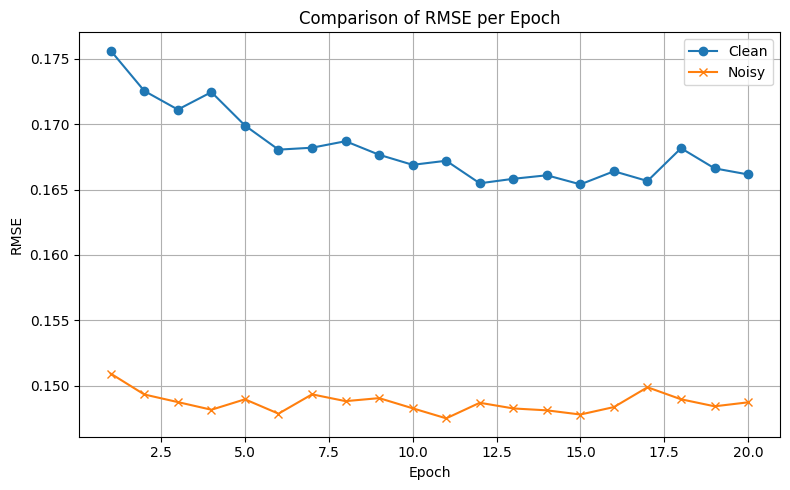

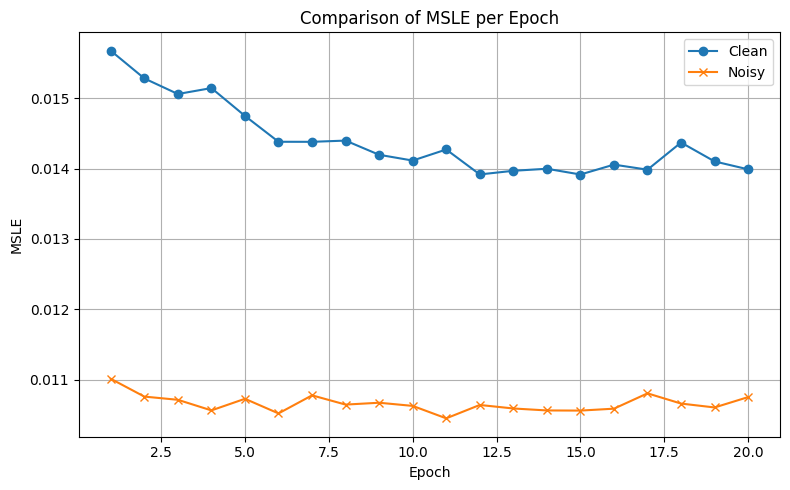

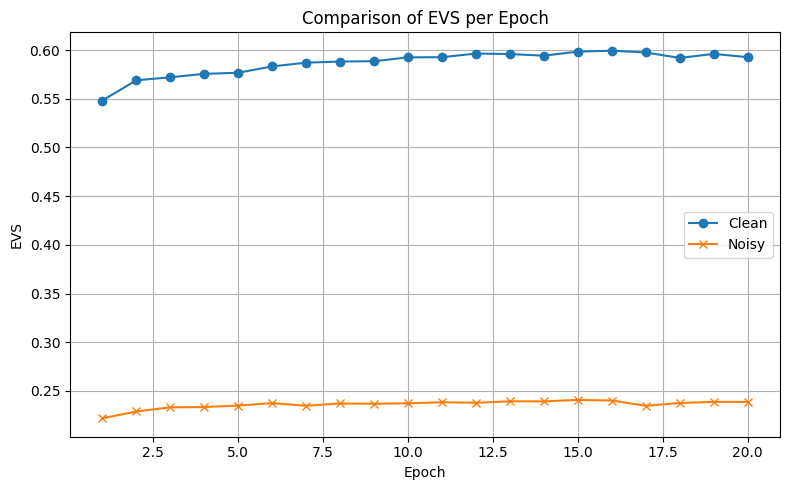

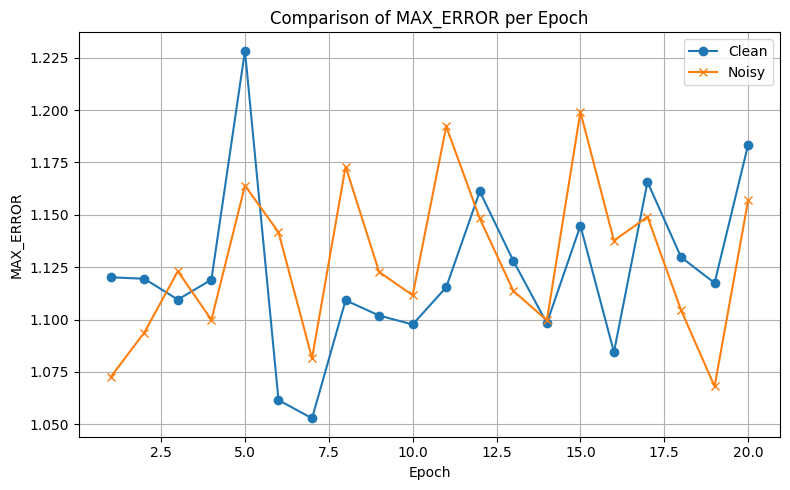

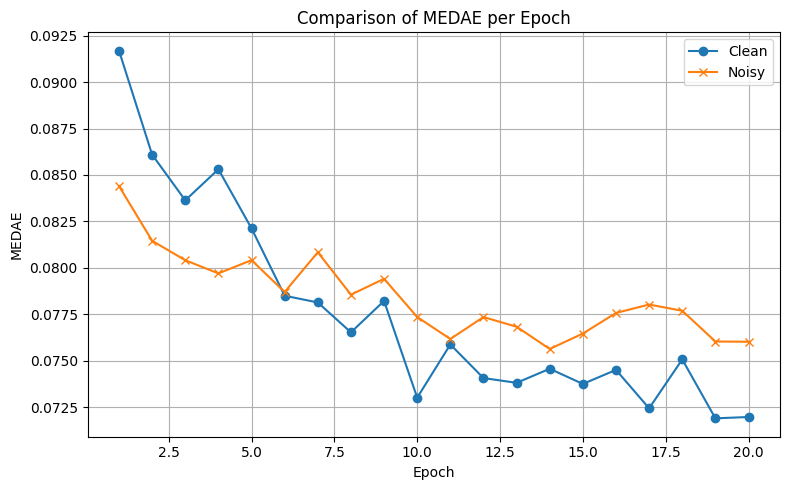

In [911]:
import pandas as pd
import matplotlib.pyplot as plt

# Load training histories
clean_history_path = "/content/drive/MyDrive/retail_forecasting_sequences/transformer_clean_history.csv"
noisy_history_path = "/content/drive/MyDrive/retail_forecasting_sequences_noisy/transformer_noisy_history.csv"

df_clean = pd.read_csv(clean_history_path)
df_noisy = pd.read_csv(noisy_history_path)

# Define metrics to compare
metrics = ["train_loss", "val_loss", "r2", "mae", "rmse", "msle", "evs", "max_error", "medae"]

# Plotting
for metric in metrics:
    plt.figure(figsize=(8, 5))
    plt.plot(df_clean["epoch"], df_clean[metric], label="Clean", marker='o')
    plt.plot(df_noisy["epoch"], df_noisy[metric], label="Noisy", marker='x')
    plt.xlabel("Epoch")
    plt.ylabel(metric.upper())
    plt.title(f"Comparison of {metric.upper()} per Epoch")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [913]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, r2_score,
    explained_variance_score, mean_squared_log_error,
    max_error, median_absolute_error
)
import time

# Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
base = "/content/drive/MyDrive/retail_forecasting_sequences"

input_seq_len = 12
output_seq_len = 6
num_x_features = 19
num_y_targets = 19
batch_size = 64
epochs = 20
lr = 0.001

# Load Data
X_train = np.load(f"{base}/X_train_reshaped.npy")
y_train = np.load(f"{base}/y_train_reshaped.npy")
X_val   = np.load(f"{base}/X_val_reshaped.npy")
y_val   = np.load(f"{base}/y_val_reshaped.npy")
X_test  = np.load(f"{base}/X_test_reshaped.npy")
y_test  = np.load(f"{base}/y_test_reshaped.npy")

# Tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(len(y_train), -1), dtype=torch.float32)
X_val   = torch.tensor(X_val, dtype=torch.float32)
y_val   = torch.tensor(y_val.reshape(len(y_val), -1), dtype=torch.float32)
X_test  = torch.tensor(X_test, dtype=torch.float32)
y_test  = torch.tensor(y_test.reshape(len(y_test), -1), dtype=torch.float32)

train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

# CNN-RNN Model
class CNNRNNModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(in_channels=num_x_features, out_channels=64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Conv1d(in_channels=64, out_channels=32, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.gru = nn.GRU(input_size=32, hidden_size=128, num_layers=2, batch_first=True, dropout=0.3)
        self.fc1 = nn.Linear(128, 64)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, output_seq_len * num_y_targets)

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.cnn(x)
        x = x.permute(0, 2, 1)
        x, _ = self.gru(x)
        x = self.fc1(x[:, -1, :])
        x = self.dropout(torch.relu(x))
        return self.fc2(x)

model = CNNRNNModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Metrics
def evaluate_all(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "EVS": explained_variance_score(y_true, y_pred),
        "MSLE": mean_squared_log_error(np.clip(y_true, 0, None), np.clip(y_pred, 0, None)),
        "MAXE": np.max(np.abs(y_true - y_pred)),
        "MEDAE": median_absolute_error(y_true, y_pred)
    }

# Training
history_cnn = []
for epoch in range(1, epochs + 1):
    model.train()
    train_losses = []
    start_time = time.time()
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        pred = model(xb)
        loss = criterion(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    model.eval()
    val_preds, val_trues = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            val_preds.append(pred.cpu().numpy())
            val_trues.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds)
    val_trues = np.vstack(val_trues)
    metrics = evaluate_all(val_trues, val_preds)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch:02d} | Train Loss: {np.mean(train_losses):.4f} | "
          f"Val Loss: {metrics['MSE']:.4f} | R2: {metrics['R2']:.4f} | "
          f"MAE: {metrics['MAE']:.4f} | RMSE: {metrics['RMSE']:.4f} | Time: {epoch_time:.2f}s")

    history_cnn.append({
        "epoch": epoch,
        "train_loss": np.mean(train_losses),
        "val_loss": metrics["MSE"],
        "r2": metrics["R2"],
        "mae": metrics["MAE"],
        "rmse": metrics["RMSE"],
        "msle": metrics["MSLE"],
        "evs": metrics["EVS"],
        "max_error": metrics["MAXE"],
        "medae": metrics["MEDAE"],
        "time_sec": epoch_time
    })

# Save Model and History
hist_df = pd.DataFrame(history_cnn)
hist_df.to_csv(f"{base}/cnn_rnn_clean_history.csv", index=False)
torch.save(model.state_dict(), f"{base}/cnn_rnn_clean_model.pt")

# Final Test Evaluation
model.eval()
with torch.no_grad():
    test_preds = model(X_test.to(device)).cpu().numpy()
    metrics = evaluate_all(y_test.numpy(), test_preds)

print("\nFinal Test Evaluation:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")

Epoch 01 | Train Loss: 0.0374 | Val Loss: 0.0352 | R2: 0.4837 | MAE: 0.1347 | RMSE: 0.1876 | Time: 24.70s
Epoch 02 | Train Loss: 0.0298 | Val Loss: 0.0316 | R2: 0.5314 | MAE: 0.1253 | RMSE: 0.1779 | Time: 25.18s
Epoch 03 | Train Loss: 0.0287 | Val Loss: 0.0316 | R2: 0.5304 | MAE: 0.1243 | RMSE: 0.1779 | Time: 24.97s
Epoch 04 | Train Loss: 0.0282 | Val Loss: 0.0311 | R2: 0.5402 | MAE: 0.1227 | RMSE: 0.1763 | Time: 24.99s
Epoch 05 | Train Loss: 0.0279 | Val Loss: 0.0312 | R2: 0.5415 | MAE: 0.1238 | RMSE: 0.1767 | Time: 25.06s
Epoch 06 | Train Loss: 0.0277 | Val Loss: 0.0315 | R2: 0.5378 | MAE: 0.1238 | RMSE: 0.1775 | Time: 25.82s
Epoch 07 | Train Loss: 0.0276 | Val Loss: 0.0307 | R2: 0.5475 | MAE: 0.1212 | RMSE: 0.1752 | Time: 24.77s
Epoch 08 | Train Loss: 0.0274 | Val Loss: 0.0302 | R2: 0.5527 | MAE: 0.1199 | RMSE: 0.1738 | Time: 25.08s
Epoch 09 | Train Loss: 0.0273 | Val Loss: 0.0307 | R2: 0.5497 | MAE: 0.1212 | RMSE: 0.1752 | Time: 25.59s
Epoch 10 | Train Loss: 0.0272 | Val Loss: 0.03

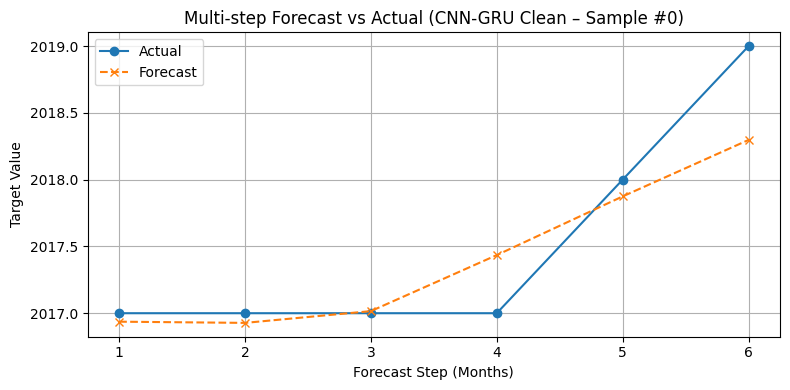

In [914]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import joblib

# Config
input_seq_len = 12
output_seq_len = 6
num_features = X_test_reshaped.shape[2]
target_index = 0
base = "/content/drive/MyDrive/retail_forecasting_sequences"

# CNN-GRU Model Definition
class CNNRNNModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(in_channels=num_features, out_channels=64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Conv1d(in_channels=64, out_channels=32, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.gru = nn.GRU(input_size=32, hidden_size=128, num_layers=2, batch_first=True, dropout=0.3)
        self.fc1 = nn.Linear(128, 64)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, output_seq_len * num_features)

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.cnn(x)
        x = x.permute(0, 2, 1)
        x, _ = self.gru(x)
        x = self.fc1(x[:, -1, :])
        x = self.dropout(torch.relu(x))
        return self.fc2(x)

# Load model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNRNNModel().to(device)
model.load_state_dict(torch.load(f"{base}/cnn_rnn_clean_model.pt"))
model.eval()

# Forecast
X_test_tensor = torch.tensor(X_test_reshaped, dtype=torch.float32).to(device)
with torch.no_grad():
    preds = model(X_test_tensor).cpu().numpy()

# Reshape and Inverse Transform
preds = preds.reshape(-1, output_seq_len, num_features)
y_scaler = joblib.load(f"{base}/train_y_scaler.save")
preds_inverse = y_scaler.inverse_transform(preds.reshape(-1, output_seq_len * num_features))
y_true_inverse = y_scaler.inverse_transform(y_test_reshaped.reshape(-1, output_seq_len * num_features))

# Visualize Forecast
sample_idx = 0
pred_series = preds_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]
true_series = y_true_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]

plt.figure(figsize=(8, 4))
plt.plot(range(1, output_seq_len + 1), true_series, marker='o', label="Actual")
plt.plot(range(1, output_seq_len + 1), pred_series, marker='x', linestyle='--', label="Forecast")
plt.title(f"Multi-step Forecast vs Actual (CNN-GRU Clean – Sample #{sample_idx})")
plt.xlabel("Forecast Step (Months)")
plt.ylabel("Target Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [915]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    mean_squared_error, mean_absolute_error, r2_score,
    explained_variance_score, mean_squared_log_error,
    max_error, median_absolute_error
)
import time

# Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

input_seq_len = 12
output_seq_len = 6
num_x_features = 19
num_y_targets = 19
batch_size = 64
epochs = 20
lr = 0.001

#  Load Clean Data
X_train_noisy = np.load(f"{base}/X_train_noisy_reshaped.npy")
y_train = np.load(f"{base}/y_train_noisy_reshaped.npy")
X_val_noisy   = np.load(f"{base}/X_val_noisy_reshaped.npy")
y_val         = np.load(f"{base}/y_val_noisy_reshaped.npy")
X_test_noisy  = np.load(f"{base}/X_test_noisy_reshaped.npy")
y_test        = np.load(f"{base}/y_test_noisy_reshaped.npy")


# Convert to Tensors
X_train = torch.tensor(X_train_noisy, dtype=torch.float32)
y_train = torch.tensor(y_train.reshape(len(y_train), -1), dtype=torch.float32)
X_val   = torch.tensor(X_val_noisy, dtype=torch.float32)
y_val   = torch.tensor(y_val.reshape(len(y_val), -1), dtype=torch.float32)
X_test  = torch.tensor(X_test_noisy, dtype=torch.float32)
y_test  = torch.tensor(y_test.reshape(len(y_test), -1), dtype=torch.float32)

train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size)

#  Model
class CNNRNNModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(in_channels=num_x_features, out_channels=64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Conv1d(in_channels=64, out_channels=32, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.gru = nn.GRU(input_size=32, hidden_size=128, num_layers=2, batch_first=True, dropout=0.3)
        self.fc1 = nn.Linear(128, 64)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, output_seq_len * num_y_targets)

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.cnn(x)
        x = x.permute(0, 2, 1)
        x, _ = self.gru(x)
        x = self.fc1(x[:, -1, :])
        x = self.dropout(torch.relu(x))
        return self.fc2(x)

model = CNNRNNModel().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()

# Metrics
def evaluate_all(y_true, y_pred):
    return {
        "MSE": mean_squared_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "EVS": explained_variance_score(y_true, y_pred),
        "MSLE": mean_squared_log_error(np.clip(y_true, 0, None), np.clip(y_pred, 0, None)),
        "MAXE": np.max(np.abs(y_true - y_pred)),
        "MEDAE": median_absolute_error(y_true, y_pred)
    }

# Training
history_cnn_noisy = []
for epoch in range(1, epochs + 1):
    model.train()
    train_losses = []
    start_time = time.time()

    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        pred = model(xb)
        loss = criterion(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    # Validation
    model.eval()
    val_preds, val_trues = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            pred = model(xb)
            val_preds.append(pred.cpu().numpy())
            val_trues.append(yb.cpu().numpy())

    val_preds = np.vstack(val_preds)
    val_trues = np.vstack(val_trues)
    metrics = evaluate_all(val_trues, val_preds)
    epoch_time = time.time() - start_time

    print(f"Epoch {epoch:02d} | Train Loss: {np.mean(train_losses):.4f} | "
          f"Val Loss: {metrics['MSE']:.4f} | R2: {metrics['R2']:.4f} | "
          f"MAE: {metrics['MAE']:.4f} | RMSE: {metrics['RMSE']:.4f} | Time: {epoch_time:.2f}s")

    history_cnn_noisy.append({
        "epoch": epoch,
        "train_loss": np.mean(train_losses),
        "val_loss": metrics["MSE"],
        "r2": metrics["R2"],
        "mae": metrics["MAE"],
        "rmse": metrics["RMSE"],
        "msle": metrics["MSLE"],
        "evs": metrics["EVS"],
        "max_error": metrics["MAXE"],
        "medae": metrics["MEDAE"],
        "time_sec": epoch_time
    })

# Save
hist_df = pd.DataFrame(history_cnn_noisy)
hist_df.to_csv(f"{base}/cnn_rnn_noisy_history.csv", index=False)
torch.save(model.state_dict(), f"{base}/cnn_rnn_noisy_model.pt")

# Final Test
model.eval()
with torch.no_grad():
    test_preds = model(X_test.to(device)).cpu().numpy()
    metrics = evaluate_all(y_test.numpy(), test_preds)

print("\nFinal Test Evaluation:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


Epoch 01 | Train Loss: 0.0297 | Val Loss: 0.0244 | R2: 0.1620 | MAE: 0.1127 | RMSE: 0.1561 | Time: 23.46s
Epoch 02 | Train Loss: 0.0231 | Val Loss: 0.0234 | R2: 0.1763 | MAE: 0.1096 | RMSE: 0.1530 | Time: 25.93s
Epoch 03 | Train Loss: 0.0223 | Val Loss: 0.0231 | R2: 0.1845 | MAE: 0.1095 | RMSE: 0.1519 | Time: 25.39s
Epoch 04 | Train Loss: 0.0220 | Val Loss: 0.0232 | R2: 0.1807 | MAE: 0.1093 | RMSE: 0.1524 | Time: 24.71s
Epoch 05 | Train Loss: 0.0218 | Val Loss: 0.0226 | R2: 0.1888 | MAE: 0.1077 | RMSE: 0.1503 | Time: 24.72s
Epoch 06 | Train Loss: 0.0216 | Val Loss: 0.0231 | R2: 0.1850 | MAE: 0.1077 | RMSE: 0.1518 | Time: 24.59s
Epoch 07 | Train Loss: 0.0215 | Val Loss: 0.0224 | R2: 0.1921 | MAE: 0.1066 | RMSE: 0.1495 | Time: 25.88s
Epoch 08 | Train Loss: 0.0214 | Val Loss: 0.0229 | R2: 0.1877 | MAE: 0.1080 | RMSE: 0.1514 | Time: 24.82s
Epoch 09 | Train Loss: 0.0213 | Val Loss: 0.0230 | R2: 0.1880 | MAE: 0.1076 | RMSE: 0.1517 | Time: 23.96s
Epoch 10 | Train Loss: 0.0213 | Val Loss: 0.02

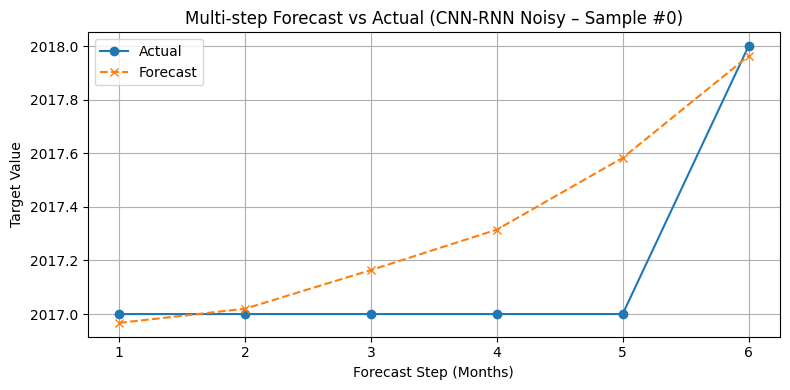

In [916]:
import torch.nn as nn
import torch
import numpy as np
import matplotlib.pyplot as plt
import joblib

# Transformer Model Definition
class CNNRNNModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(in_channels=num_x_features, out_channels=64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Conv1d(in_channels=64, out_channels=32, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.gru = nn.GRU(input_size=32, hidden_size=128, num_layers=2, batch_first=True, dropout=0.3)
        self.fc1 = nn.Linear(128, 64)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, output_seq_len * num_y_targets)

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.cnn(x)
        x = x.permute(0, 2, 1)
        x, _ = self.gru(x)
        x = self.fc1(x[:, -1, :])
        x = self.dropout(torch.relu(x))
        return self.fc2(x)

# Config
input_seq_len = 12
output_seq_len = 6
target_index = 0
base_noisy = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

# Load Noisy Data Arrays
X_test_noisy = np.load(f"{base_noisy}/X_test_noisy_reshaped.npy")
y_test_noisy = np.load(f"{base_noisy}/y_test_noisy_reshaped.npy")
num_features = X_test_noisy.shape[2]

# Load Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNRNNModel().to(device)
model.load_state_dict(torch.load(f"{base_noisy}/cnn_rnn_noisy_model.pt"))
model.eval()

# Forecast
X_test_tensor = torch.tensor(X_test_noisy, dtype=torch.float32).to(device)
with torch.no_grad():
    preds = model(X_test_tensor).cpu().numpy()

#  Reshape and Inverse Transform
preds = preds.reshape(-1, output_seq_len, num_features)

y_scaler = joblib.load(f"{base_noisy}/train_noisy_y_scaler.save")
preds_inverse = y_scaler.inverse_transform(preds.reshape(-1, output_seq_len * num_features))
y_true_inverse = y_scaler.inverse_transform(y_test_noisy.reshape(-1, output_seq_len * num_features))

# Visualize Forecast vs Actual
sample_idx = 0
pred_series = preds_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]
true_series = y_true_inverse[sample_idx].reshape(output_seq_len, num_features)[:, target_index]

plt.figure(figsize=(8, 4))
plt.plot(range(1, output_seq_len + 1), true_series, marker='o', label="Actual")
plt.plot(range(1, output_seq_len + 1), pred_series, marker='x', linestyle='--', label="Forecast")
plt.title(f"Multi-step Forecast vs Actual (CNN-RNN Noisy – Sample #{sample_idx})")
plt.xlabel("Forecast Step (Months)")
plt.ylabel("Target Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


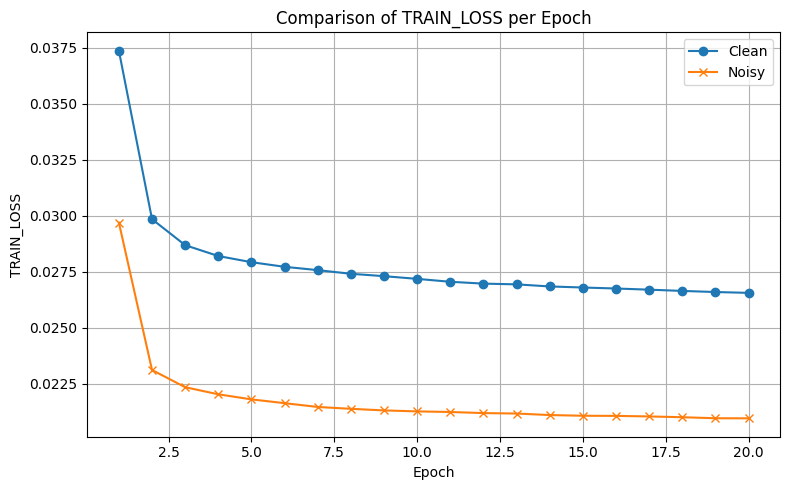

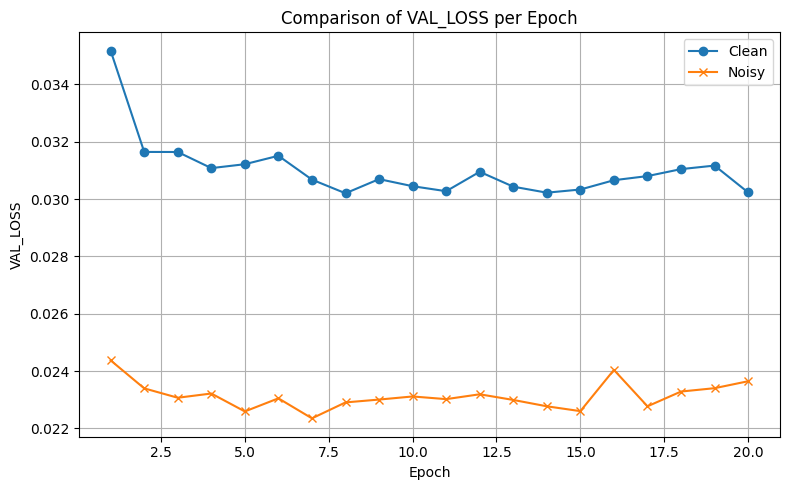

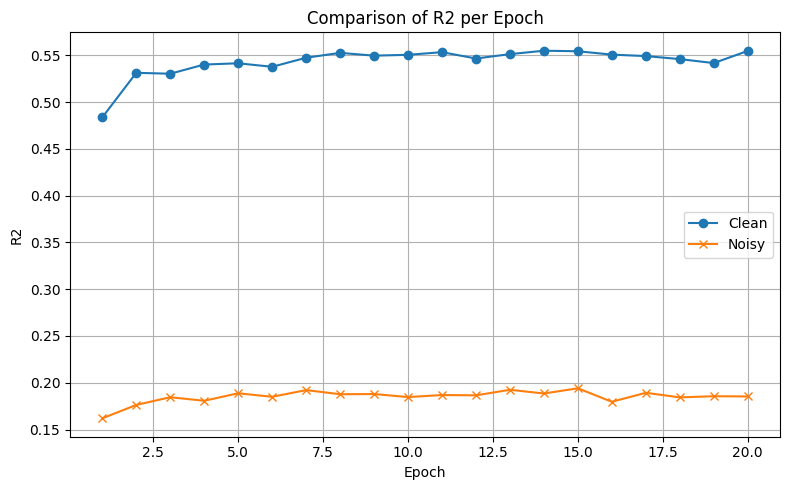

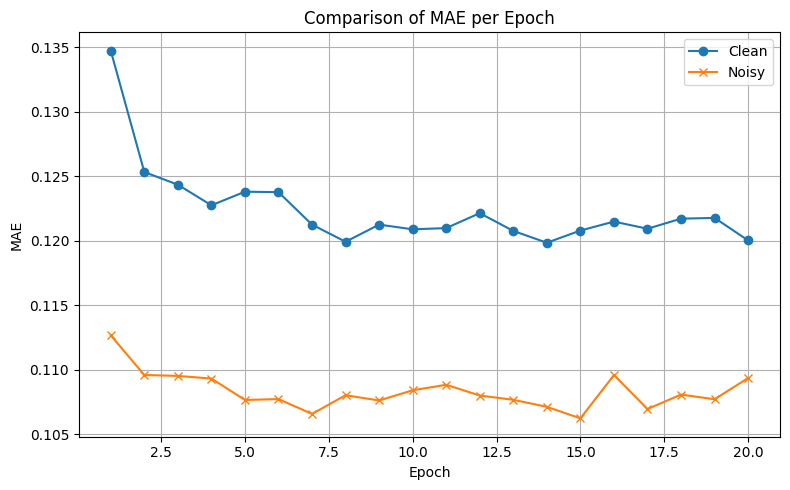

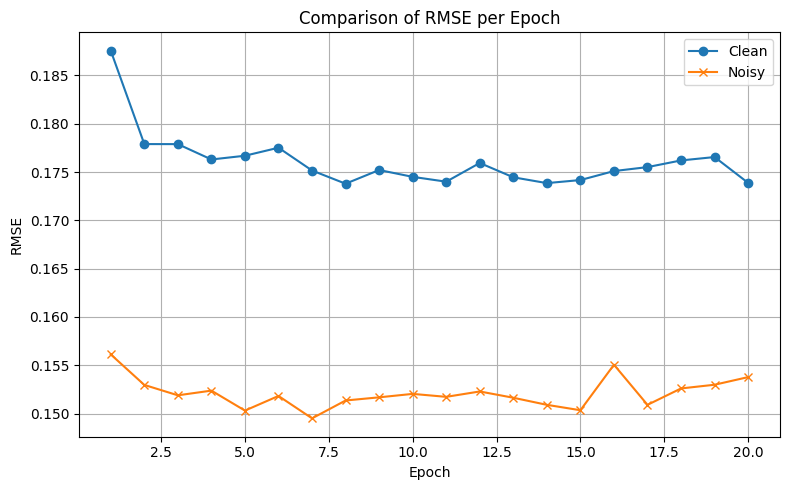

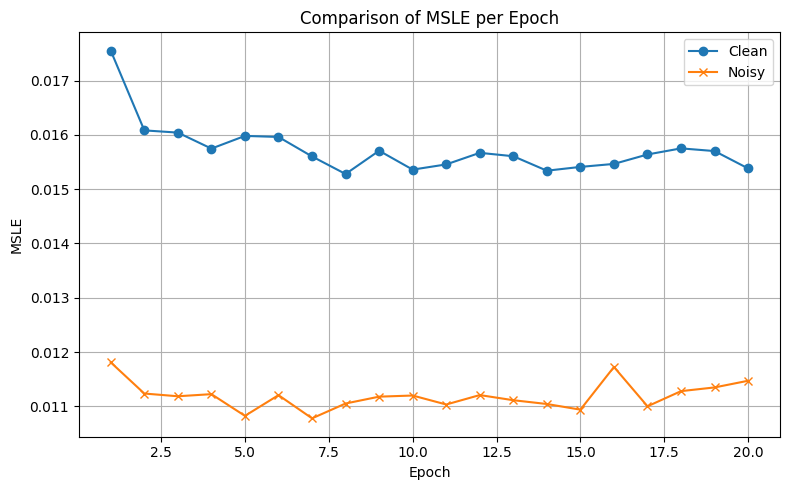

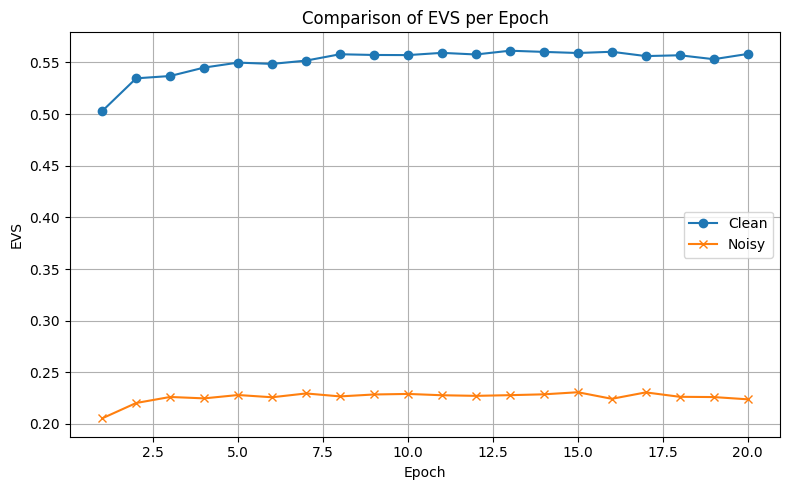

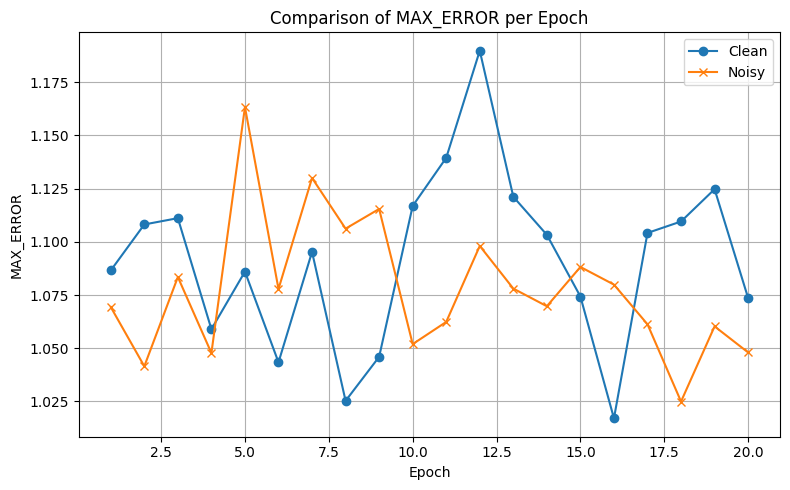

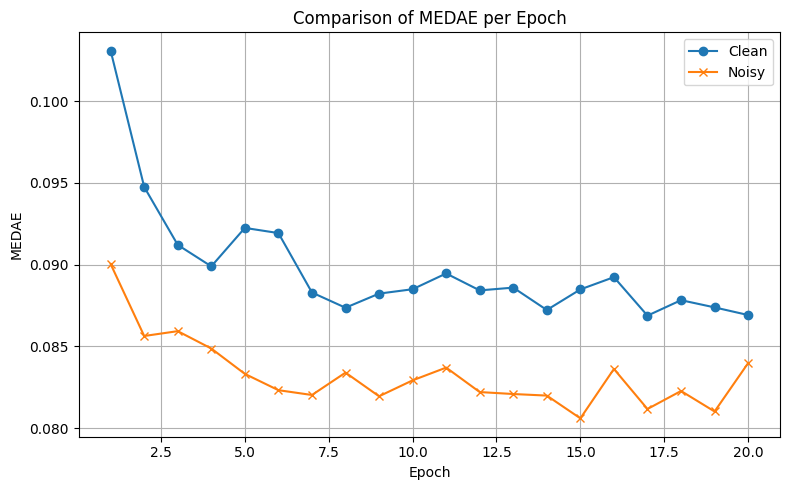

In [917]:
import pandas as pd
import matplotlib.pyplot as plt

# Load training histories
clean_history_path = "/content/drive/MyDrive/retail_forecasting_sequences/cnn_rnn_clean_history.csv"
noisy_history_path = "/content/drive/MyDrive/retail_forecasting_sequences_noisy/cnn_rnn_noisy_history.csv"

df_clean = pd.read_csv(clean_history_path)
df_noisy = pd.read_csv(noisy_history_path)

# Define metrics to compare
metrics = ["train_loss", "val_loss", "r2", "mae", "rmse", "msle", "evs", "max_error", "medae"]

# Plot
for metric in metrics:
    plt.figure(figsize=(8, 5))
    plt.plot(df_clean["epoch"], df_clean[metric], label="Clean", marker='o')
    plt.plot(df_noisy["epoch"], df_noisy[metric], label="Noisy", marker='x')
    plt.xlabel("Epoch")
    plt.ylabel(metric.upper())
    plt.title(f"Comparison of {metric.upper()} per Epoch")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


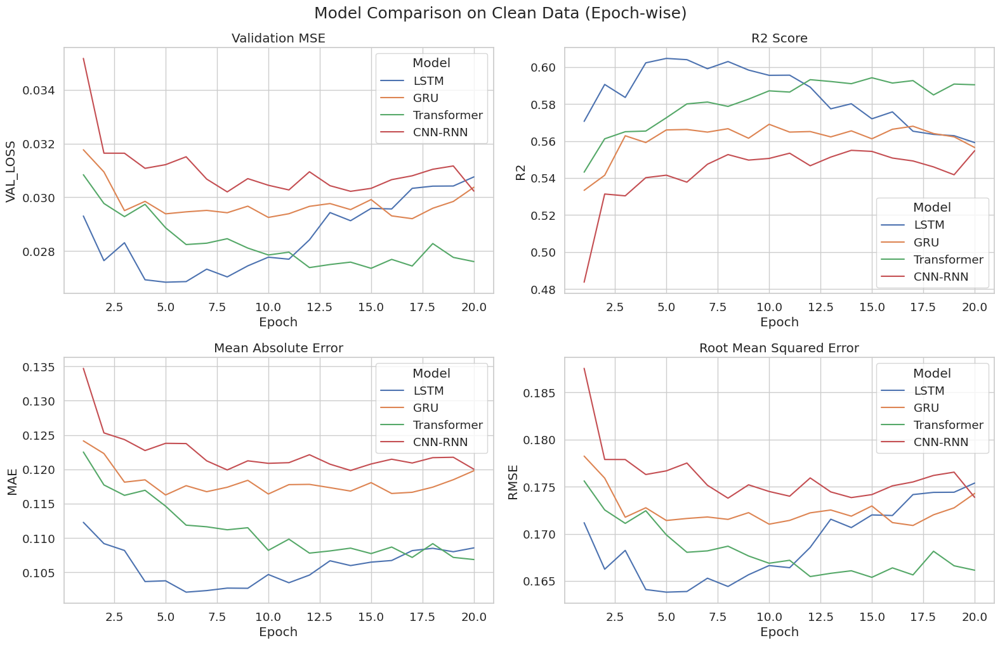

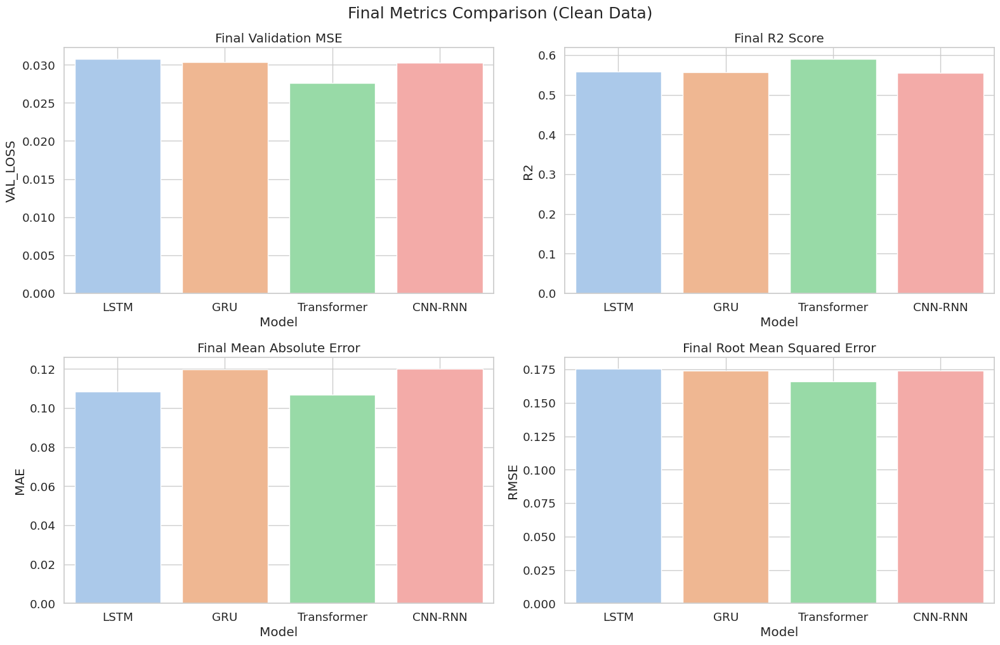

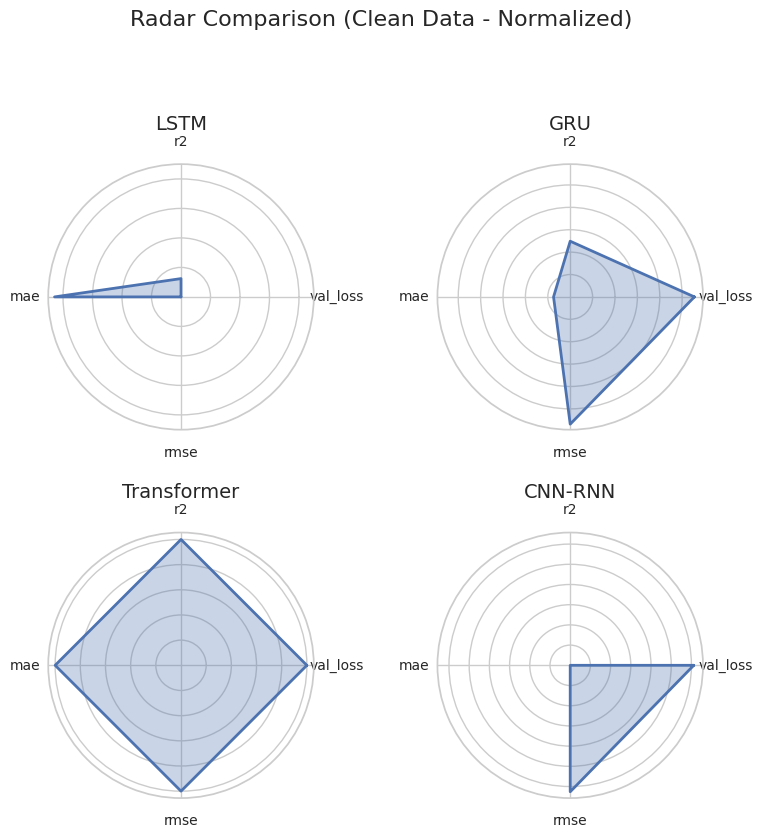

In [920]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from math import pi

# Config
base = "/content/drive/MyDrive/retail_forecasting_sequences"
files = {
    "LSTM": f"{base}/lstm_clean_history.csv",
    "GRU": f"{base}/gru_clean_history.csv",
    "Transformer": f"{base}/transformer_clean_history.csv",
    "CNN-RNN": f"{base}/cnn_rnn_clean_history.csv",
}

# Load and Combine
df_all = []
for model, path in files.items():
    df = pd.read_csv(path)
    df["Model"] = model
    df_all.append(df)

df_combined = pd.concat(df_all)

# Line Plots Over Epochs
sns.set(style="whitegrid", font_scale=1.2)
fig, axs = plt.subplots(2, 2, figsize=(16, 10))

metrics = ["val_loss", "r2", "mae", "rmse"]
titles = ["Validation MSE", "R2 Score", "Mean Absolute Error", "Root Mean Squared Error"]

for i, (metric, title) in enumerate(zip(metrics, titles)):
    ax = axs[i//2][i%2]
    sns.lineplot(data=df_combined, x="epoch", y=metric, hue="Model", ax=ax)
    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel(metric.upper())
    ax.legend(title="Model")
    ax.grid(True)

plt.tight_layout()
plt.suptitle("Model Comparison on Clean Data (Epoch-wise)", fontsize=18, y=1.02)
plt.show()

# Bar Plot of Final Epoch Metrics
final_df = df_combined.groupby("Model").tail(1)

fig, axs = plt.subplots(2, 2, figsize=(16, 10))
for i, (metric, title) in enumerate(zip(metrics, titles)):
    ax = axs[i//2][i%2]
    sns.barplot(data=final_df, x="Model", y=metric, ax=ax, palette="pastel")
    ax.set_title(f"Final {title}")
    ax.set_ylabel(metric.upper())
    ax.grid(True)

plt.tight_layout()
plt.suptitle("Final Metrics Comparison (Clean Data)", fontsize=18, y=1.02)
plt.show()

# Radar Chart for Normalized Metrics
radar_df = final_df.set_index("Model")[metrics].copy()
radar_df["val_loss"] = 1 / radar_df["val_loss"]
radar_df["mae"] = 1 / radar_df["mae"]
radar_df["rmse"] = 1 / radar_df["rmse"]

# Normalize to 0–1
radar_df_norm = (radar_df - radar_df.min()) / (radar_df.max() - radar_df.min())

# Radar chart
labels = radar_df_norm.columns.tolist()
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]

fig = plt.figure(figsize=(8, 8))
for model in radar_df_norm.index:
    values = radar_df_norm.loc[model].tolist()
    values += values[:1]
    ax = plt.subplot(2, 2, list(radar_df_norm.index).index(model)+1, polar=True)
    ax.plot(angles, values, linewidth=2, label=model)
    ax.fill(angles, values, alpha=0.3)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=10)
    ax.set_title(model, size=14, y=1.1)
    ax.set_yticklabels([])
    ax.grid(True)

plt.suptitle("Radar Comparison (Clean Data - Normalized)", fontsize=16, y=1.05)
plt.tight_layout()
plt.show()


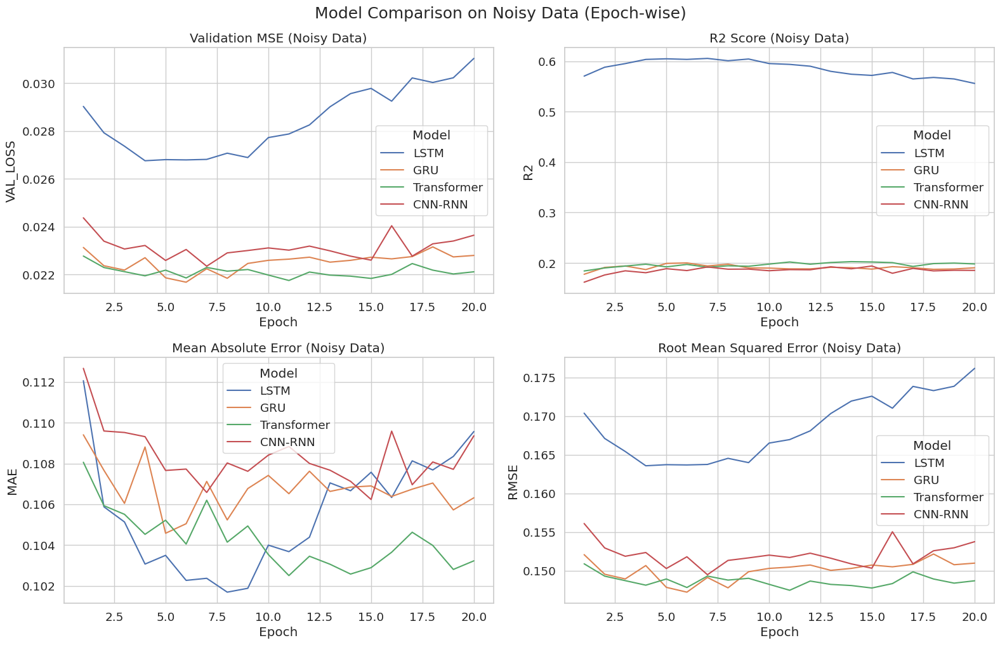

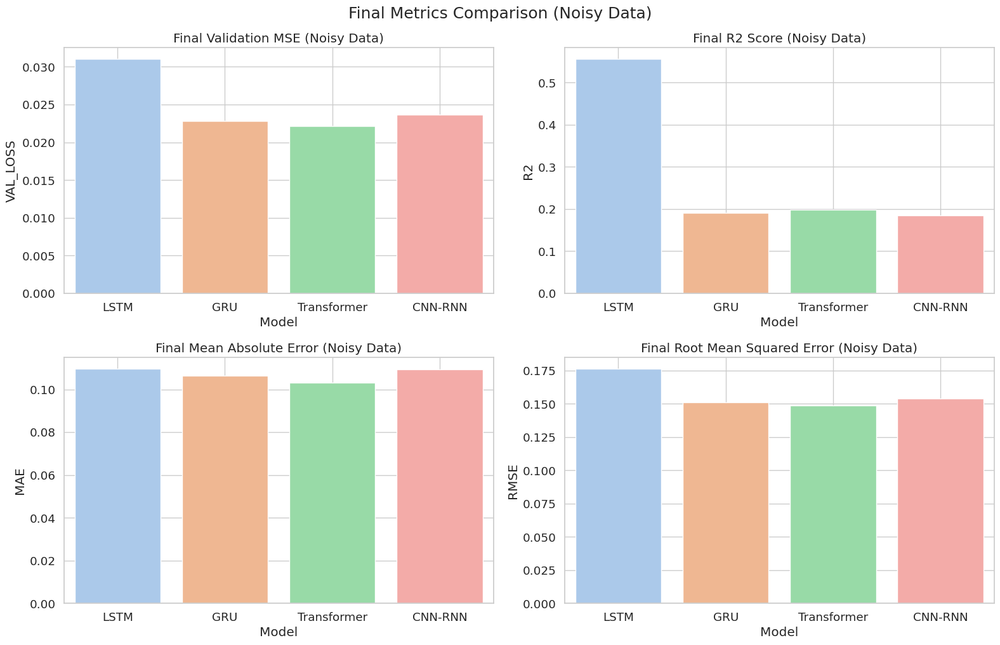

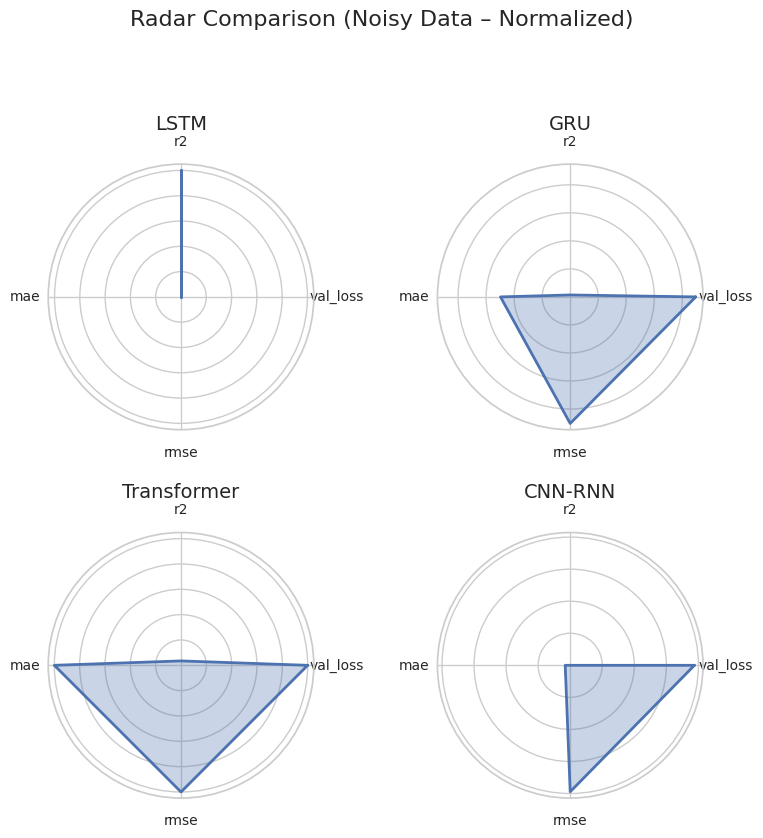

In [921]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from math import pi

# Config
base = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"
files = {
    "LSTM": f"{base}/lstm_noisy_history.csv",
    "GRU": f"{base}/gru_noisy_history_noisy.csv",
    "Transformer": f"{base}/transformer_noisy_history.csv",
    "CNN-RNN": f"{base}/cnn_rnn_noisy_history.csv",
}

# Load and Combine Histories
df_all = []
for model, path in files.items():
    df = pd.read_csv(path)
    df["Model"] = model
    df_all.append(df)

df_combined = pd.concat(df_all)

# Line Plots Over Epochs
sns.set(style="whitegrid", font_scale=1.2)
fig, axs = plt.subplots(2, 2, figsize=(16, 10))

metrics = ["val_loss", "r2", "mae", "rmse"]
titles = ["Validation MSE", "R2 Score", "Mean Absolute Error", "Root Mean Squared Error"]

for i, (metric, title) in enumerate(zip(metrics, titles)):
    ax = axs[i//2][i%2]
    sns.lineplot(data=df_combined, x="epoch", y=metric, hue="Model", ax=ax)
    ax.set_title(f"{title} (Noisy Data)")
    ax.set_xlabel("Epoch")
    ax.set_ylabel(metric.upper())
    ax.legend(title="Model")
    ax.grid(True)

plt.tight_layout()
plt.suptitle("Model Comparison on Noisy Data (Epoch-wise)", fontsize=18, y=1.02)
plt.show()

# Bar Plot of Final Epoch Metrics
final_df = df_combined.groupby("Model").tail(1)

fig, axs = plt.subplots(2, 2, figsize=(16, 10))
for i, (metric, title) in enumerate(zip(metrics, titles)):
    ax = axs[i//2][i%2]
    sns.barplot(data=final_df, x="Model", y=metric, ax=ax, palette="pastel")
    ax.set_title(f"Final {title} (Noisy Data)")
    ax.set_ylabel(metric.upper())
    ax.grid(True)

plt.tight_layout()
plt.suptitle("Final Metrics Comparison (Noisy Data)", fontsize=18, y=1.02)
plt.show()

# Radar Chart for Normalized Metrics
radar_df = final_df.set_index("Model")[metrics].copy()
radar_df["val_loss"] = 1 / radar_df["val_loss"]
radar_df["mae"] = 1 / radar_df["mae"]
radar_df["rmse"] = 1 / radar_df["rmse"]

# Normalize to 0–1
radar_df_norm = (radar_df - radar_df.min()) / (radar_df.max() - radar_df.min())

# Radar chart
labels = radar_df_norm.columns.tolist()
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]

fig = plt.figure(figsize=(8, 8))
for model in radar_df_norm.index:
    values = radar_df_norm.loc[model].tolist()
    values += values[:1]
    ax = plt.subplot(2, 2, list(radar_df_norm.index).index(model)+1, polar=True)
    ax.plot(angles, values, linewidth=2, label=model)
    ax.fill(angles, values, alpha=0.3)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=10)
    ax.set_title(model, size=14, y=1.1)
    ax.set_yticklabels([])
    ax.grid(True)

plt.suptitle("Radar Comparison (Noisy Data – Normalized)", fontsize=16, y=1.05)
plt.tight_layout()
plt.show()


In [5]:
# Clean data path
clean_path = "/content/drive/MyDrive/retail_forecasting_sequences"

X_train_clean = np.load(f"{clean_path}/X_train_reshaped.npy")
y_train_clean = np.load(f"{clean_path}/y_train_reshaped.npy")
X_val_clean   = np.load(f"{clean_path}/X_val_reshaped.npy")
y_val_clean   = np.load(f"{clean_path}/y_val_reshaped.npy")
X_test_clean  = np.load(f"{clean_path}/X_test_reshaped.npy")
y_test_clean  = np.load(f"{clean_path}/y_test_reshaped.npy")

print("CLEAN DATA")
print("Train:", X_train_clean.shape, y_train_clean.shape)
print("Val:  ", X_val_clean.shape, y_val_clean.shape)
print("Test: ", X_test_clean.shape, y_test_clean.shape)

# Noisy data path
noisy_path = f"/content/drive/MyDrive/retail_forecasting_sequences_noisy"

X_train_noisy = np.load(f"{noisy_path}/X_train_noisy_reshaped.npy")
y_train_noisy = np.load(f"{noisy_path}/y_train_noisy_reshaped.npy")
X_val_noisy   = np.load(f"{noisy_path}/X_val_noisy_reshaped.npy")
y_val_noisy   = np.load(f"{noisy_path}/y_val_noisy_reshaped.npy")
X_test_noisy  = np.load(f"{noisy_path}/X_test_noisy_reshaped.npy")
y_test_noisy  = np.load(f"{noisy_path}/y_test_noisy_reshaped.npy")

print("\n NOISY DATA")
print("Train:", X_train_noisy.shape, y_train_noisy.shape)
print("Val:  ", X_val_noisy.shape, y_val_noisy.shape)
print("Test: ", X_test_noisy.shape, y_test_noisy.shape)

CLEAN DATA
Train: (202883, 12, 19) (202883, 6, 19)
Val:   (43475, 12, 19) (43475, 6, 19)
Test:  (43475, 12, 19) (43475, 6, 19)

 NOISY DATA
Train: (202883, 12, 19) (202883, 6, 19)
Val:   (43474, 12, 19) (43474, 6, 19)
Test:  (43476, 12, 19) (43476, 6, 19)


In [9]:
import torch
from torch.utils.data import DataLoader, TensorDataset


def get_loaders(X, y, batch_size=64, shuffle=True):
    tensor_x = torch.tensor(X, dtype=torch.float32)
    tensor_y = torch.tensor(y, dtype=torch.float32)
    dataset = TensorDataset(tensor_x, tensor_y)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)
    return loader

train_loader_clean = get_loaders(X_train_clean, y_train_clean)
val_loader_clean   = get_loaders(X_val_clean, y_val_clean)
test_loader_clean  = get_loaders(X_test_clean, y_test_clean)

train_loader_noisy = get_loaders(X_train_noisy, y_train_noisy)
val_loader_noisy   = get_loaders(X_val_noisy, y_val_noisy)
test_loader_noisy  = get_loaders(X_test_noisy, y_test_noisy)

In [45]:
import torch
import torch.nn as nn
import numpy as np
import os
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Sinusoidal Positional Encoding
def get_sinusoidal_encoding(seq_len, d_model):
    pe = torch.zeros(seq_len, d_model)
    position = torch.arange(0, seq_len, dtype=torch.float).unsqueeze(1)
    div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-np.log(10000.0) / d_model))
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    return pe.unsqueeze(0)

# Transformer Model
class TimeSeriesTransformer(nn.Module):
    def __init__(self, input_dim, output_dim, seq_len, d_model, nhead, num_layers, dropout, output_seq_len):
        super(TimeSeriesTransformer, self).__init__()
        self.input_projection = nn.Linear(input_dim, d_model)
        self.positional_encoding = get_sinusoidal_encoding(seq_len, d_model)
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout, batch_first=True)
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.norm = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)
        self.head = nn.Sequential(
            nn.Linear(d_model, d_model),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model, output_dim)
        )
        self.output_seq_len = output_seq_len

    def forward(self, x):
        pe = self.positional_encoding[:, :x.size(1), :].to(x.device)
        x = self.input_projection(x) + pe
        x = self.encoder(x)
        x = self.norm(x)
        x = self.dropout(x[:, -self.output_seq_len:, :])
        return self.head(x)

# Training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = X_train_clean.shape[2]
output_dim = y_train_clean.shape[2]
input_seq_len = X_train_clean.shape[1]
output_seq_len = y_train_clean.shape[1]

hyperparams_list = [
    (64, 1, 0.1, 0.001),
    (128, 2, 0.2, 0.001),
    (128, 2, 0.3, 0.0005),
    (256, 2, 0.3, 0.0003),
    (64, 3, 0.5, 0.0001),
]

results_transformer = []

for data_mode in ['clean', 'noisy']:
    if data_mode == 'clean':
        train_loader, val_loader, test_loader = train_loader_clean, val_loader_clean, test_loader_clean
        y_test = y_test_clean
        save_dir = "/content/drive/MyDrive/retail_forecasting_sequences"
    else:
        train_loader, val_loader, test_loader = train_loader_noisy, val_loader_noisy, test_loader_noisy
        y_test = y_test_noisy
        save_dir = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

    os.makedirs(save_dir, exist_ok=True)

    for i, (d_model, num_layers, dropout, lr) in enumerate(hyperparams_list):
        print(f"\nTraining [{data_mode.upper()}] Transformer Set {i} -> d_model={d_model}, layers={num_layers}, dropout={dropout}, lr={lr}")

        model = TimeSeriesTransformer(
            input_dim=input_dim,
            output_dim=output_dim,
            seq_len=input_seq_len,
            d_model=d_model,
            nhead=4,
            num_layers=num_layers,
            dropout=dropout,
            output_seq_len=output_seq_len
        ).to(device)

        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

        train_losses, val_losses = [], []

        for epoch in range(20):
            model.train()
            total_loss = 0
            for x_batch, y_batch in train_loader:
                x_batch = x_batch.float().to(device)
                y_batch = y_batch.float().to(device)

                optimizer.zero_grad()
                output = model(x_batch)
                loss = criterion(output, y_batch)
                loss.backward()
                optimizer.step()
                total_loss += loss.item()

            avg_train_loss = total_loss / len(train_loader)
            train_losses.append(avg_train_loss)

            # Validation
            model.eval()
            val_loss = 0
            with torch.no_grad():
                for x_batch, y_batch in val_loader:
                    x_batch = x_batch.float().to(device)
                    y_batch = y_batch.float().to(device)
                    output = model(x_batch)
                    val_loss += criterion(output, y_batch).item()

            avg_val_loss = val_loss / len(val_loader)
            val_losses.append(avg_val_loss)
            scheduler.step(avg_val_loss)

            print(f"Epoch {epoch+1:02d}: Train Loss = {avg_train_loss:.4f}, Val Loss = {avg_val_loss:.4f}")

        # --- Test ---
        model.eval()
        preds, targets = [], []
        with torch.no_grad():
            for x_batch, y_batch in test_loader:
                x_batch = x_batch.float().to(device)
                y_batch = y_batch.float().to(device)
                output = model(x_batch)
                preds.append(output.cpu().numpy())
                targets.append(y_batch.cpu().numpy())

        preds = np.concatenate(preds, axis=0).reshape(-1, output_dim)
        targets = np.concatenate(targets, axis=0).reshape(-1, output_dim)

        mse = mean_squared_error(targets, preds)
        mae = mean_absolute_error(targets, preds)
        rmse = np.sqrt(mse)
        r2 = r2_score(targets, preds)

        print(f"[{data_mode.upper()} - SET {i}] Test MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

        # Save model
        torch.save(model.state_dict(), os.path.join(save_dir, f"transformer_{data_mode}_set{i}.pt"))

        results_transformer.append({
            "data_mode": data_mode,
            "set": i,
            "d_model": d_model,
            "num_layers": num_layers,
            "dropout": dropout,
            "lr": lr,
            "train_losses": train_losses,
            "val_losses": val_losses,
            "test_mse": mse,
            "test_mae": mae,
            "test_rmse": rmse,
            "test_r2": r2,
            "model": model
        })



Training [CLEAN] Transformer Set 0 -> d_model=64, layers=1, dropout=0.1, lr=0.001
Epoch 01: Train Loss = 0.0327, Val Loss = 0.0340
Epoch 02: Train Loss = 0.0291, Val Loss = 0.0341
Epoch 03: Train Loss = 0.0287, Val Loss = 0.0344
Epoch 04: Train Loss = 0.0285, Val Loss = 0.0349
Epoch 05: Train Loss = 0.0283, Val Loss = 0.0334
Epoch 06: Train Loss = 0.0281, Val Loss = 0.0338
Epoch 07: Train Loss = 0.0280, Val Loss = 0.0325
Epoch 08: Train Loss = 0.0279, Val Loss = 0.0323
Epoch 09: Train Loss = 0.0279, Val Loss = 0.0324
Epoch 10: Train Loss = 0.0279, Val Loss = 0.0342
Epoch 11: Train Loss = 0.0279, Val Loss = 0.0343
Epoch 12: Train Loss = 0.0278, Val Loss = 0.0333
Epoch 13: Train Loss = 0.0275, Val Loss = 0.0316
Epoch 14: Train Loss = 0.0275, Val Loss = 0.0318
Epoch 15: Train Loss = 0.0275, Val Loss = 0.0318
Epoch 16: Train Loss = 0.0275, Val Loss = 0.0321
Epoch 17: Train Loss = 0.0274, Val Loss = 0.0316
Epoch 18: Train Loss = 0.0272, Val Loss = 0.0325
Epoch 19: Train Loss = 0.0272, Val 

In [46]:
from tabulate import tabulate

# Collect evaluation summary for Transformer
summary = []
for res in results_transformer:
    row = [
        res["data_mode"].upper(),
        res["set"],
        res["d_model"],
        res["num_layers"],
        res["dropout"],
        res["lr"],
        round(res["train_losses"][-1], 6),
        round(res["val_losses"][-1], 6),
        round(res["test_mse"], 6),
        round(res["test_mae"], 6),
        round(res["test_rmse"], 6),
        round(res["test_r2"], 6),
    ]
    summary.append(row)

# Table headers
headers = [
    "Data", "Set", "d_model", "Layers", "Dropout", "LR",
    "Final Train Loss", "Final Val Loss",
    "Test MSE", "Test MAE", "Test RMSE", "Test R²"
]

# Print table
print(tabulate(summary, headers=headers, tablefmt="grid"))


+--------+-------+-----------+----------+-----------+--------+--------------------+------------------+------------+------------+-------------+-----------+
| Data   |   Set |   d_model |   Layers |   Dropout |     LR |   Final Train Loss |   Final Val Loss |   Test MSE |   Test MAE |   Test RMSE |   Test R² |
+========+=======+===========+==========+===========+========+====================+==================+============+============+=============+===========+
| CLEAN  |     0 |        64 |        1 |       0.1 | 0.001  |           0.027213 |         0.031153 |   0.02809  |   0.113288 |    0.167602 |  0.590071 |
+--------+-------+-----------+----------+-----------+--------+--------------------+------------------+------------+------------+-------------+-----------+
| CLEAN  |     1 |       128 |        2 |       0.2 | 0.001  |           0.027401 |         0.031597 |   0.028832 |   0.11737  |    0.169799 |  0.577488 |
+--------+-------+-----------+----------+-----------+--------+--------

In [47]:
import pandas as pd

# Create DataFrame from results
df = pd.DataFrame([{
    "Data": res["data_mode"].upper(),
    "Set": res["set"],
    "d_model": res["d_model"],
    "Layers": res["num_layers"],
    "Dropout": res["dropout"],
    "LR": res["lr"],
    "Train_Loss": res["train_losses"][-1],
    "Val_Loss": res["val_losses"][-1],
    "MSE": res["test_mse"],
    "MAE": res["test_mae"],
    "RMSE": res["test_rmse"],
    "R2": res["test_r2"]
} for res in results_transformer])

# Pivot by Set and Data Mode
sets = sorted(df["Set"].unique())
combined_scores = []

for s in sets:
    row_clean = df[(df["Set"] == s) & (df["Data"] == "CLEAN")]
    row_noisy = df[(df["Set"] == s) & (df["Data"] == "NOISY")]

    if not row_clean.empty and not row_noisy.empty:
        # Combine metrics (lower is better for all except R²)
        score = (
            row_clean["Train_Loss"].values[0] +
            row_noisy["Train_Loss"].values[0] +
            row_clean["Val_Loss"].values[0] +
            row_noisy["Val_Loss"].values[0] +
            row_clean["MSE"].values[0] +
            row_noisy["MSE"].values[0] +
            row_clean["MAE"].values[0] +
            row_noisy["MAE"].values[0] +
            row_clean["RMSE"].values[0] +
            row_noisy["RMSE"].values[0] -
            row_clean["R2"].values[0] -  # Higher is better for R²
            row_noisy["R2"].values[0]
        )
        combined_scores.append((s, score))

# Find best overall set
best_set = sorted(combined_scores, key=lambda x: x[1])[0][0]

# Output
print(f"\n Best Set (Clean + Noisy) is Set {best_set}")
print("\nClean Metrics:")
print(df[(df["Set"] == best_set) & (df["Data"] == "CLEAN")].to_string(index=False))

print("\nNoisy Metrics:")
print(df[(df["Set"] == best_set) & (df["Data"] == "NOISY")].to_string(index=False))



 Best Set (Clean + Noisy) is Set 3

Clean Metrics:
 Data  Set  d_model  Layers  Dropout     LR  Train_Loss  Val_Loss      MSE     MAE     RMSE       R2
CLEAN    3      256       2      0.3 0.0003    0.026921  0.031175 0.027774 0.11144 0.166655 0.591588

Noisy Metrics:
 Data  Set  d_model  Layers  Dropout     LR  Train_Loss  Val_Loss      MSE      MAE     RMSE       R2
NOISY    3      256       2      0.3 0.0003    0.021656  0.023091 0.020871 0.103601 0.144469 0.227492


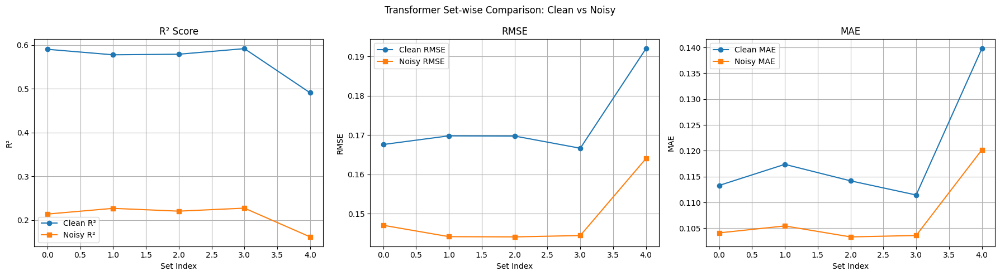

In [48]:
import matplotlib.pyplot as plt
import torch
import os

#  Save model weights into subfolders
for result in results_transformer:
    set_id = result["set"]
    model = result["model"]
    data_mode = result["data_mode"]

    # Define root and subdirectory
    if data_mode == "clean":
        base_dir = "/content/drive/MyDrive/retail_forecasting_sequences/tune_transformer_clean"
    else:
        base_dir = "/content/drive/MyDrive/retail_forecasting_sequences_noisy/tune_transformer_noisy"

    # Create set-specific subfolder
    set_dir = os.path.join(base_dir, f"set{set_id}")
    os.makedirs(set_dir, exist_ok=True)

    # Save the model
    save_path = os.path.join(set_dir, f"transformer_{data_mode}_set{set_id}.pt")
    torch.save(model.state_dict(), save_path)

#  Extract metrics for plotting
clean_results = [r for r in results_transformer if r['data_mode'] == 'clean']
noisy_results = [r for r in results_transformer if r['data_mode'] == 'noisy']
sets = list(range(len(clean_results)))

def extract_metric(metric):
    return {
        "clean": [r[metric] for r in clean_results],
        "noisy": [r[metric] for r in noisy_results]
    }

r2_scores = extract_metric("test_r2")
rmse_scores = extract_metric("test_rmse")
mae_scores = extract_metric("test_mae")

#  Plotting
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(sets, r2_scores['clean'], marker='o', label='Clean R²')
axes[0].plot(sets, r2_scores['noisy'], marker='s', label='Noisy R²')
axes[0].set_title("R² Score")
axes[0].set_xlabel("Set Index")
axes[0].set_ylabel("R²")
axes[0].legend()
axes[0].grid(True)

axes[1].plot(sets, rmse_scores['clean'], marker='o', label='Clean RMSE')
axes[1].plot(sets, rmse_scores['noisy'], marker='s', label='Noisy RMSE')
axes[1].set_title("RMSE")
axes[1].set_xlabel("Set Index")
axes[1].set_ylabel("RMSE")
axes[1].legend()
axes[1].grid(True)

axes[2].plot(sets, mae_scores['clean'], marker='o', label='Clean MAE')
axes[2].plot(sets, mae_scores['noisy'], marker='s', label='Noisy MAE')
axes[2].set_title("MAE")
axes[2].set_xlabel("Set Index")
axes[2].set_ylabel("MAE")
axes[2].legend()
axes[2].grid(True)

fig.suptitle("Transformer Set-wise Comparison: Clean vs Noisy")
plt.tight_layout()
plt.show()


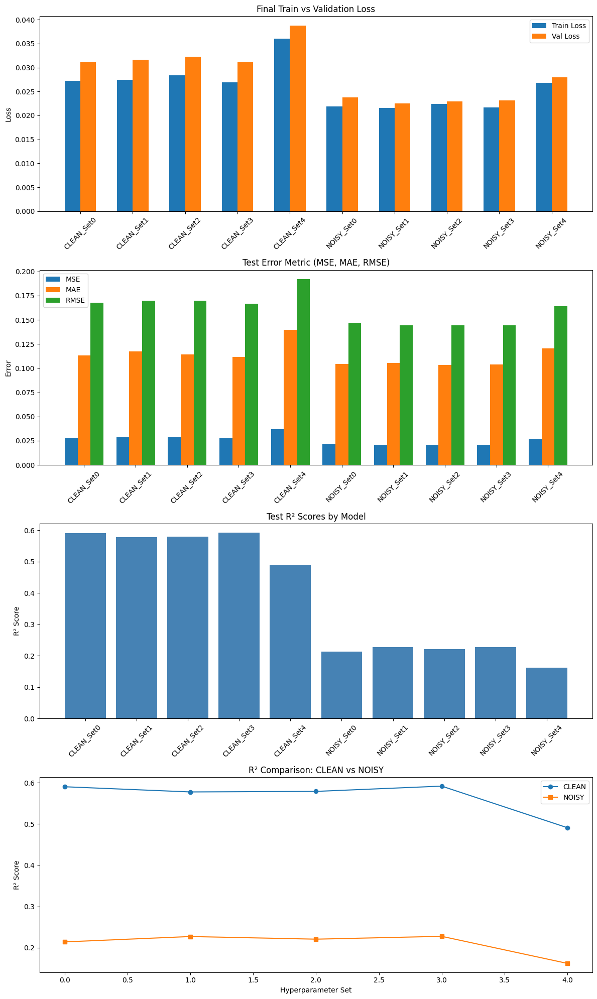

In [49]:
import matplotlib.pyplot as plt
import numpy as np

# Build labels and values for plotting
labels = []
train_losses = []
val_losses = []
mse_list = []
mae_list = []
rmse_list = []
r2_list = []

for res in results_transformer:
    label = f"{res['data_mode'].upper()}_Set{res['set']}"
    labels.append(label)
    train_losses.append(res["train_losses"][-1])
    val_losses.append(res["val_losses"][-1])
    mse_list.append(res["test_mse"])
    mae_list.append(res["test_mae"])
    rmse_list.append(res["test_rmse"])
    r2_list.append(res["test_r2"])

# Start plotting
fig, axs = plt.subplots(4, 1, figsize=(12, 20))

# Plot 1: Final Train vs Validation Loss
x = np.arange(len(labels))
axs[0].bar(x - 0.15, train_losses, width=0.3, label='Train Loss')
axs[0].bar(x + 0.15, val_losses, width=0.3, label='Val Loss')
axs[0].set_title("Final Train vs Validation Loss")
axs[0].set_ylabel("Loss")
axs[0].set_xticks(x)
axs[0].set_xticklabels(labels, rotation=45)
axs[0].legend()

# Plot 2: Test Error Metrics (MSE, MAE, RMSE)
width = 0.25
axs[1].bar(x - width, mse_list, width=width, label='MSE')
axs[1].bar(x, mae_list, width=width, label='MAE')
axs[1].bar(x + width, rmse_list, width=width, label='RMSE')
axs[1].set_title("Test Error Metric (MSE, MAE, RMSE)")
axs[1].set_ylabel("Error")
axs[1].set_xticks(x)
axs[1].set_xticklabels(labels, rotation=45)
axs[1].legend()

# Plot 3: Test R² Scores
axs[2].bar(x, r2_list, color='steelblue')
axs[2].set_title("Test R² Scores by Model")
axs[2].set_ylabel("R² Score")
axs[2].set_xticks(x)
axs[2].set_xticklabels(labels, rotation=45)

# Plot 4: Clean vs Noisy R² Comparison
sets = sorted(set(res["set"] for res in results_transformer))
clean_r2 = [res["test_r2"] for res in results_transformer if res["data_mode"] == "clean"]
noisy_r2 = [res["test_r2"] for res in results_transformer if res["data_mode"] == "noisy"]
axs[3].plot(sets, clean_r2, label="CLEAN", marker='o')
axs[3].plot(sets, noisy_r2, label="NOISY", marker='s')
axs[3].set_title("R² Comparison: CLEAN vs NOISY")
axs[3].set_xlabel("Hyperparameter Set")
axs[3].set_ylabel("R² Score")
axs[3].legend()

plt.tight_layout()
plt.show()


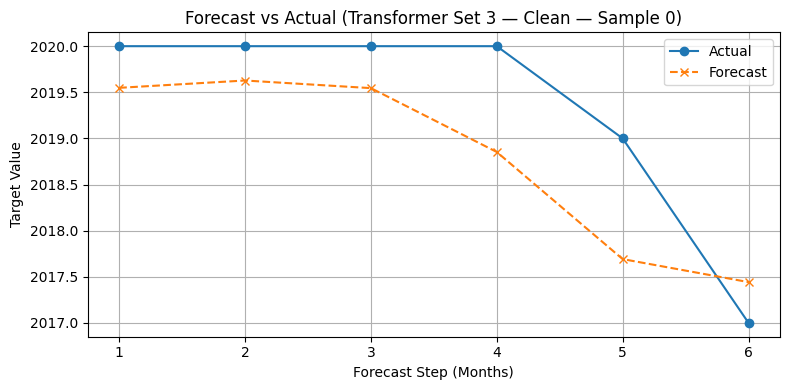

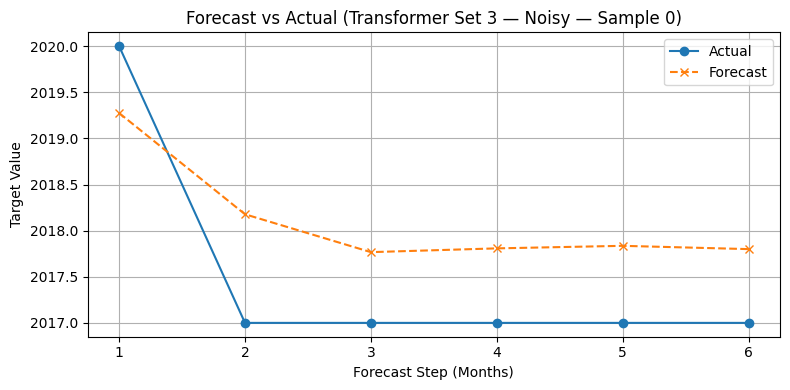

In [55]:
import torch
import matplotlib.pyplot as plt
import joblib
import numpy as np

# Recreate the model architecture (must match training)
model = TimeSeriesTransformer(
    input_dim=input_dim,
    output_dim=output_dim,
    seq_len=input_seq_len,
    d_model=256,
    nhead=4,
    num_layers=2,
    dropout=0.3,
    output_seq_len=output_seq_len
).to(device)

def plot_forecast(model_path, test_loader, scaler_path, data_mode, sample_idx=0):
    # Load model weights
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    # Get a batch from the test loader
    X_test_batch, y_test_batch = next(iter(test_loader))
    X_sample = X_test_batch[sample_idx:sample_idx+1].float().to(device)
    y_true = y_test_batch[sample_idx:sample_idx+1].float()

    with torch.no_grad():
        y_pred = model(X_sample).cpu().numpy()

    # Load y_scaler
    y_scaler = joblib.load(scaler_path)

    # Flatten predictions and ground truth for inverse transform
    y_pred_flat = y_pred.reshape(-1, y_pred.shape[-1])
    y_true_flat = y_true.numpy().reshape(-1, y_true.shape[-1])

    # If scaler expects more features, pad predictions to match
    if y_pred_flat.shape[1] < y_scaler.n_features_in_:
        pad_width = y_scaler.n_features_in_ - y_pred_flat.shape[1]
        y_pred_padded = np.pad(y_pred_flat, ((0, 0), (0, pad_width)), mode='constant')
        y_true_padded = np.pad(y_true_flat, ((0, 0), (0, pad_width)), mode='constant')

        y_pred_inv_full = y_scaler.inverse_transform(y_pred_padded)
        y_true_inv_full = y_scaler.inverse_transform(y_true_padded)

        # Keep only the actual predicted features
        y_pred_inv = y_pred_inv_full[:, :y_pred.shape[-1]]
        y_true_inv = y_true_inv_full[:, :y_pred.shape[-1]]
    else:
        # Direct inverse transform if shape matches
        y_pred_inv = y_scaler.inverse_transform(y_pred_flat)
        y_true_inv = y_scaler.inverse_transform(y_true_flat)

    # Plot for first 6 forecast steps
    forecast_steps = min(6, y_pred_inv.shape[0])
    months = list(range(1, forecast_steps + 1))
    target_index = 0  # you can change this to plot other features

    plt.figure(figsize=(8, 4))
    plt.plot(months, y_true_inv[:forecast_steps, target_index], marker='o', label='Actual')
    plt.plot(months, y_pred_inv[:forecast_steps, target_index], marker='x', linestyle='--', label='Forecast')
    plt.title(f"Forecast vs Actual (Transformer Set 3 — {data_mode.capitalize()} — Sample {sample_idx})")
    plt.xlabel("Forecast Step (Months)")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


#  Call for Clean
plot_forecast(
    model_path="/content/drive/MyDrive/retail_forecasting_sequences/tune_transformer_clean/set3/transformer_clean_set3.pt",
    test_loader=test_loader_clean,
    scaler_path="/content/drive/MyDrive/retail_forecasting_sequences/train_y_scaler.save",
    data_mode="clean",
    sample_idx=0
)

#  Call for Noisy
plot_forecast(
    model_path="/content/drive/MyDrive/retail_forecasting_sequences_noisy/tune_transformer_noisy/set3/transformer_noisy_set3.pt",
    test_loader=test_loader_noisy,
    scaler_path="/content/drive/MyDrive/retail_forecasting_sequences_noisy/train_noisy_y_scaler.save",
    data_mode="noisy",
    sample_idx=0
)


In [56]:
import torch
import torch.nn as nn
import numpy as np
import os
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# CNN-RNN Model
class CNNRNNModel(nn.Module):
    def __init__(self, input_dim, output_dim, output_seq_len, dropout):
        super().__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(in_channels=input_dim, out_channels=64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Conv1d(in_channels=64, out_channels=32, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.gru = nn.GRU(input_size=32, hidden_size=128, num_layers=2, batch_first=True, dropout=dropout)
        self.fc1 = nn.Linear(128, 64)
        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.Linear(64, output_seq_len * output_dim)
        self.output_seq_len = output_seq_len
        self.output_dim = output_dim

    def forward(self, x):
        x = x.permute(0, 2, 1)  # (B, input_dim, seq_len)
        x = self.cnn(x)         # (B, 32, seq_len)
        x = x.permute(0, 2, 1)  # (B, seq_len, 32)
        x, _ = self.gru(x)      # (B, seq_len, 128)
        x = self.fc1(x[:, -1, :])  # (B, 64)
        x = self.dropout(torch.relu(x))
        x = self.fc2(x)  # (B, output_seq_len * output_dim)
        return x.view(-1, self.output_seq_len, self.output_dim)

#  Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = X_train_clean.shape[2]
output_dim = y_train_clean.shape[2]
output_seq_len = y_train_clean.shape[1]

results_cnnrnn = []

# Match same hyperparameter list and training config
hyperparams_list = [
    (64, 1, 0.1, 0.001),
    (128, 2, 0.2, 0.001),
    (128, 2, 0.3, 0.0005),
    (256, 2, 0.3, 0.0003),
    (64, 3, 0.5, 0.0001),
]

for data_mode in ['clean', 'noisy']:
    if data_mode == 'clean':
        train_loader, val_loader, test_loader = train_loader_clean, val_loader_clean, test_loader_clean
        y_test = y_test_clean
        save_dir = "/content/drive/MyDrive/retail_forecasting_sequences"
    else:
        train_loader, val_loader, test_loader = train_loader_noisy, val_loader_noisy, test_loader_noisy
        y_test = y_test_noisy
        save_dir = "/content/drive/MyDrive/retail_forecasting_sequences_noisy"

    os.makedirs(save_dir, exist_ok=True)

    for i, (d_model, num_layers, dropout, lr) in enumerate(hyperparams_list):
        print(f"\nTraining [{data_mode.upper()}] CNN-RNN Set {i} -> dropout={dropout}, lr={lr}")

        model = CNNRNNModel(input_dim, output_dim, output_seq_len, dropout).to(device)
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

        train_losses, val_losses = [], []

        for epoch in range(20):
            model.train()
            total_loss = 0
            for x_batch, y_batch in train_loader:
                x_batch = x_batch.float().to(device)
                y_batch = y_batch.float().to(device)

                optimizer.zero_grad()
                output = model(x_batch)
                loss = criterion(output, y_batch)
                loss.backward()
                optimizer.step()
                total_loss += loss.item()

            avg_train_loss = total_loss / len(train_loader)
            train_losses.append(avg_train_loss)

            # Validation
            model.eval()
            val_loss = 0
            with torch.no_grad():
                for x_batch, y_batch in val_loader:
                    x_batch = x_batch.float().to(device)
                    y_batch = y_batch.float().to(device)
                    output = model(x_batch)
                    val_loss += criterion(output, y_batch).item()

            avg_val_loss = val_loss / len(val_loader)
            val_losses.append(avg_val_loss)
            scheduler.step(avg_val_loss)

            print(f"Epoch {epoch+1:02d}: Train Loss = {avg_train_loss:.4f}, Val Loss = {avg_val_loss:.4f}")

        # Test
        model.eval()
        preds, targets = [], []
        with torch.no_grad():
            for x_batch, y_batch in test_loader:
                x_batch = x_batch.float().to(device)
                y_batch = y_batch.float().to(device)
                output = model(x_batch)
                preds.append(output.cpu().numpy())
                targets.append(y_batch.cpu().numpy())

        preds = np.concatenate(preds, axis=0).reshape(-1, output_dim)
        targets = np.concatenate(targets, axis=0).reshape(-1, output_dim)

        mse = mean_squared_error(targets, preds)
        mae = mean_absolute_error(targets, preds)
        rmse = np.sqrt(mse)
        r2 = r2_score(targets, preds)

        print(f"[{data_mode.upper()} - SET {i}] Test MSE: {mse:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")



        results_cnnrnn.append({
            "data_mode": data_mode,
            "set": i,
            "dropout": dropout,
            "lr": lr,
            "train_losses": train_losses,
            "val_losses": val_losses,
            "test_mse": mse,
            "test_mae": mae,
            "test_rmse": rmse,
            "test_r2": r2,
            "model": model
        })



Training [CLEAN] CNN-RNN Set 0 -> dropout=0.1, lr=0.001
Epoch 01: Train Loss = 0.0378, Val Loss = 0.0408
Epoch 02: Train Loss = 0.0331, Val Loss = 0.0421
Epoch 03: Train Loss = 0.0312, Val Loss = 0.0369
Epoch 04: Train Loss = 0.0303, Val Loss = 0.0374
Epoch 05: Train Loss = 0.0298, Val Loss = 0.0355
Epoch 06: Train Loss = 0.0297, Val Loss = 0.0361
Epoch 07: Train Loss = 0.0296, Val Loss = 0.0369
Epoch 08: Train Loss = 0.0296, Val Loss = 0.0350
Epoch 09: Train Loss = 0.0295, Val Loss = 0.0357
Epoch 10: Train Loss = 0.0294, Val Loss = 0.0364
Epoch 11: Train Loss = 0.0294, Val Loss = 0.0354
Epoch 12: Train Loss = 0.0291, Val Loss = 0.0343
Epoch 13: Train Loss = 0.0287, Val Loss = 0.0345
Epoch 14: Train Loss = 0.0287, Val Loss = 0.0364
Epoch 15: Train Loss = 0.0286, Val Loss = 0.0342
Epoch 16: Train Loss = 0.0286, Val Loss = 0.0347
Epoch 17: Train Loss = 0.0286, Val Loss = 0.0359
Epoch 18: Train Loss = 0.0286, Val Loss = 0.0339
Epoch 19: Train Loss = 0.0286, Val Loss = 0.0344
Epoch 20: Tr

In [59]:
from tabulate import tabulate

# Collect evaluation summary for CNN-RNN
summary_cnnrnn = []
for res in results_cnnrnn:
    row = [
        res["data_mode"].upper(),
        res["set"],
        res["dropout"],
        res["lr"],
        round(res["train_losses"][-1], 6),
        round(res["val_losses"][-1], 6),
        round(res["test_mse"], 6),
        round(res["test_mae"], 6),
        round(res["test_rmse"], 6),
        round(res["test_r2"], 6),
    ]
    summary_cnnrnn.append(row)

# Same headers for fair comparison
headers = [
    "Data", "Set", "Dropout", "LR",
    "Final Train Loss", "Final Val Loss",
    "Test MSE", "Test MAE", "Test RMSE", "Test R²"
]

# Print CNN-RNN Results Table
print(tabulate(summary_cnnrnn, headers=headers, tablefmt="grid"))


+--------+-------+-----------+--------+--------------------+------------------+------------+------------+-------------+-----------+
| Data   |   Set |   Dropout |     LR |   Final Train Loss |   Final Val Loss |   Test MSE |   Test MAE |   Test RMSE |   Test R² |
+========+=======+===========+========+====================+==================+============+============+=============+===========+
| CLEAN  |     0 |       0.1 | 0.001  |           0.028552 |         0.034186 |   0.031605 |   0.124473 |    0.177778 |  0.553002 |
+--------+-------+-----------+--------+--------------------+------------------+------------+------------+-------------+-----------+
| CLEAN  |     1 |       0.2 | 0.001  |           0.030709 |         0.036039 |   0.034081 |   0.13156  |    0.18461  |  0.518847 |
+--------+-------+-----------+--------+--------------------+------------------+------------+------------+-------------+-----------+
| CLEAN  |     2 |       0.3 | 0.0005 |           0.034109 |         0.04054

In [60]:
import pandas as pd

# Create DataFrame from CNN-RNN results
df_cnnrnn = pd.DataFrame([{
    "Data": res["data_mode"].upper(),
    "Set": res["set"],
    "Dropout": res["dropout"],
    "LR": res["lr"],
    "Train_Loss": res["train_losses"][-1],
    "Val_Loss": res["val_losses"][-1],
    "MSE": res["test_mse"],
    "MAE": res["test_mae"],
    "RMSE": res["test_rmse"],
    "R2": res["test_r2"]
} for res in results_cnnrnn])

# Get unique sets
sets_cnn = sorted(df_cnnrnn["Set"].unique())
combined_scores_cnn = []

for s in sets_cnn:
    row_clean = df_cnnrnn[(df_cnnrnn["Set"] == s) & (df_cnnrnn["Data"] == "CLEAN")]
    row_noisy = df_cnnrnn[(df_cnnrnn["Set"] == s) & (df_cnnrnn["Data"] == "NOISY")]

    if not row_clean.empty and not row_noisy.empty:
        score = (
            row_clean["Train_Loss"].values[0] +
            row_noisy["Train_Loss"].values[0] +
            row_clean["Val_Loss"].values[0] +
            row_noisy["Val_Loss"].values[0] +
            row_clean["MSE"].values[0] +
            row_noisy["MSE"].values[0] +
            row_clean["MAE"].values[0] +
            row_noisy["MAE"].values[0] +
            row_clean["RMSE"].values[0] +
            row_noisy["RMSE"].values[0] -
            row_clean["R2"].values[0] -
            row_noisy["R2"].values[0]
        )
        combined_scores_cnn.append((s, score))

# Best overall CNN-RNN set (lowest total score)
best_cnn_set = sorted(combined_scores_cnn, key=lambda x: x[1])[0][0]

# Output best set for CNN-RNN
print(f"\n Best CNN-RNN Set (Clean + Noisy) is Set {best_cnn_set}")
print("\nClean Metrics:")
print(df_cnnrnn[(df_cnnrnn["Set"] == best_cnn_set) & (df_cnnrnn["Data"] == "CLEAN")].to_string(index=False))

print("\nNoisy Metrics:")
print(df_cnnrnn[(df_cnnrnn["Set"] == best_cnn_set) & (df_cnnrnn["Data"] == "NOISY")].to_string(index=False))



 Best CNN-RNN Set (Clean + Noisy) is Set 0

Clean Metrics:
 Data  Set  Dropout    LR  Train_Loss  Val_Loss      MSE      MAE     RMSE       R2
CLEAN    0      0.1 0.001    0.028552  0.034186 0.031605 0.124473 0.177778 0.553002

Noisy Metrics:
 Data  Set  Dropout    LR  Train_Loss  Val_Loss      MSE     MAE     RMSE       R2
NOISY    0      0.1 0.001    0.022614  0.023809 0.022226 0.10685 0.149085 0.200312


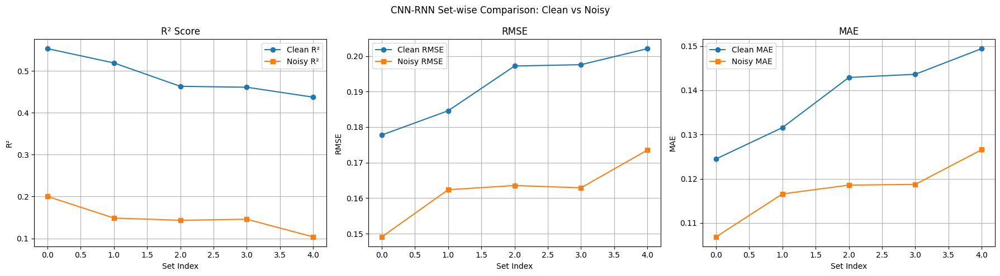

In [61]:
import matplotlib.pyplot as plt
import torch
import os

#  Save CNN-RNN model weights into subfolders
for result in results_cnnrnn:
    set_id = result["set"]
    model = result["model"]
    data_mode = result["data_mode"]

    if data_mode == "clean":
        base_dir = "/content/drive/MyDrive/retail_forecasting_sequences/tune_cnnrnn_clean"
    else:
        base_dir = "/content/drive/MyDrive/retail_forecasting_sequences_noisy/tune_cnnrnn_noisy"

    set_dir = os.path.join(base_dir, f"set{set_id}")
    os.makedirs(set_dir, exist_ok=True)

    save_path = os.path.join(set_dir, f"cnn_rnn_{data_mode}_set{set_id}.pt")
    torch.save(model.state_dict(), save_path)

#  Extract metrics for plotting
clean_results = [r for r in results_cnnrnn if r['data_mode'] == 'clean']
noisy_results = [r for r in results_cnnrnn if r['data_mode'] == 'noisy']
sets = list(range(len(clean_results)))

def extract_metric(metric):
    return {
        "clean": [r[metric] for r in clean_results],
        "noisy": [r[metric] for r in noisy_results]
    }

r2_scores = extract_metric("test_r2")
rmse_scores = extract_metric("test_rmse")
mae_scores = extract_metric("test_mae")

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# R² Plot
axes[0].plot(sets, r2_scores['clean'], marker='o', label='Clean R²')
axes[0].plot(sets, r2_scores['noisy'], marker='s', label='Noisy R²')
axes[0].set_title("R² Score")
axes[0].set_xlabel("Set Index")
axes[0].set_ylabel("R²")
axes[0].legend()
axes[0].grid(True)

# RMSE Plot
axes[1].plot(sets, rmse_scores['clean'], marker='o', label='Clean RMSE')
axes[1].plot(sets, rmse_scores['noisy'], marker='s', label='Noisy RMSE')
axes[1].set_title("RMSE")
axes[1].set_xlabel("Set Index")
axes[1].set_ylabel("RMSE")
axes[1].legend()
axes[1].grid(True)

# MAE Plot
axes[2].plot(sets, mae_scores['clean'], marker='o', label='Clean MAE')
axes[2].plot(sets, mae_scores['noisy'], marker='s', label='Noisy MAE')
axes[2].set_title("MAE")
axes[2].set_xlabel("Set Index")
axes[2].set_ylabel("MAE")
axes[2].legend()
axes[2].grid(True)

fig.suptitle("CNN-RNN Set-wise Comparison: Clean vs Noisy")
plt.tight_layout()
plt.show()


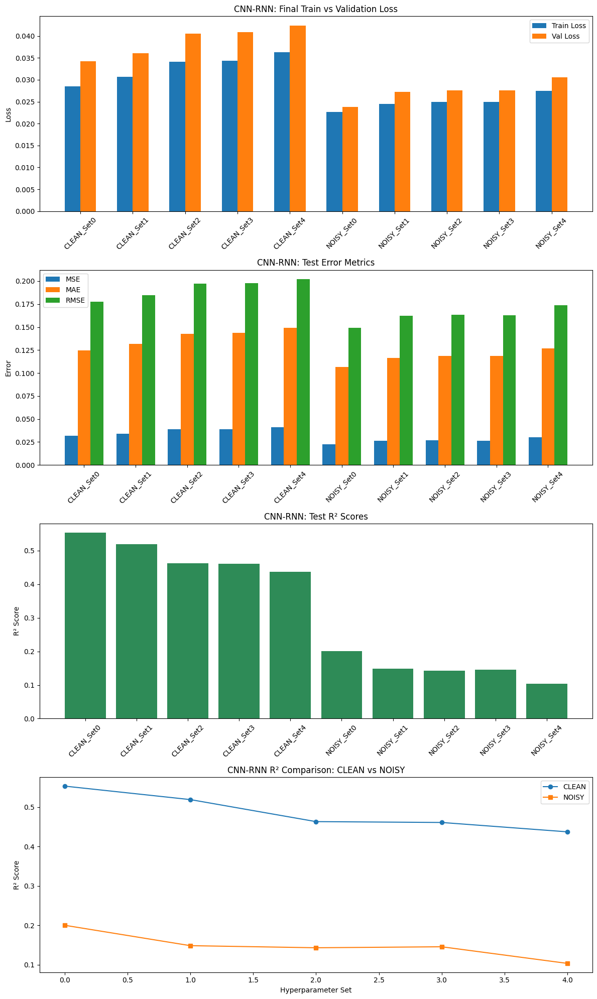

In [62]:
import matplotlib.pyplot as plt
import numpy as np

# Build labels and values
labels = []
train_losses = []
val_losses = []
mse_list = []
mae_list = []
rmse_list = []
r2_list = []

for res in results_cnnrnn:
    label = f"{res['data_mode'].upper()}_Set{res['set']}"
    labels.append(label)
    train_losses.append(res["train_losses"][-1])
    val_losses.append(res["val_losses"][-1])
    mse_list.append(res["test_mse"])
    mae_list.append(res["test_mae"])
    rmse_list.append(res["test_rmse"])
    r2_list.append(res["test_r2"])

# Start plotting
fig, axs = plt.subplots(4, 1, figsize=(12, 20))
x = np.arange(len(labels))

# Plot 1: Final Train vs Validation Loss
axs[0].bar(x - 0.15, train_losses, width=0.3, label='Train Loss')
axs[0].bar(x + 0.15, val_losses, width=0.3, label='Val Loss')
axs[0].set_title("CNN-RNN: Final Train vs Validation Loss")
axs[0].set_ylabel("Loss")
axs[0].set_xticks(x)
axs[0].set_xticklabels(labels, rotation=45)
axs[0].legend()

# Plot 2: Test Error Metrics (MSE, MAE, RMSE)
width = 0.25
axs[1].bar(x - width, mse_list, width=width, label='MSE')
axs[1].bar(x, mae_list, width=width, label='MAE')
axs[1].bar(x + width, rmse_list, width=width, label='RMSE')
axs[1].set_title("CNN-RNN: Test Error Metrics")
axs[1].set_ylabel("Error")
axs[1].set_xticks(x)
axs[1].set_xticklabels(labels, rotation=45)
axs[1].legend()

# Plot 3: Test R² Scores
axs[2].bar(x, r2_list, color='seagreen')
axs[2].set_title("CNN-RNN: Test R² Scores")
axs[2].set_ylabel("R² Score")
axs[2].set_xticks(x)
axs[2].set_xticklabels(labels, rotation=45)

# Plot 4: Clean vs Noisy R² Comparison
sets = sorted(set(res["set"] for res in results_cnnrnn))
clean_r2 = [res["test_r2"] for res in results_cnnrnn if res["data_mode"] == "clean"]
noisy_r2 = [res["test_r2"] for res in results_cnnrnn if res["data_mode"] == "noisy"]
axs[3].plot(sets, clean_r2, label="CLEAN", marker='o')
axs[3].plot(sets, noisy_r2, label="NOISY", marker='s')
axs[3].set_title("CNN-RNN R² Comparison: CLEAN vs NOISY")
axs[3].set_xlabel("Hyperparameter Set")
axs[3].set_ylabel("R² Score")
axs[3].legend()

plt.tight_layout()
plt.show()


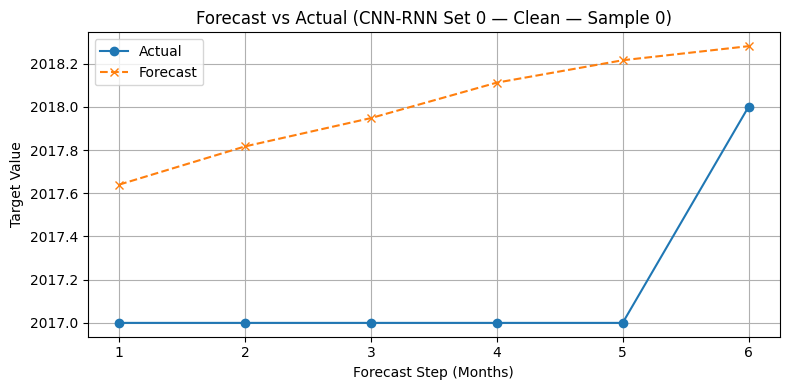

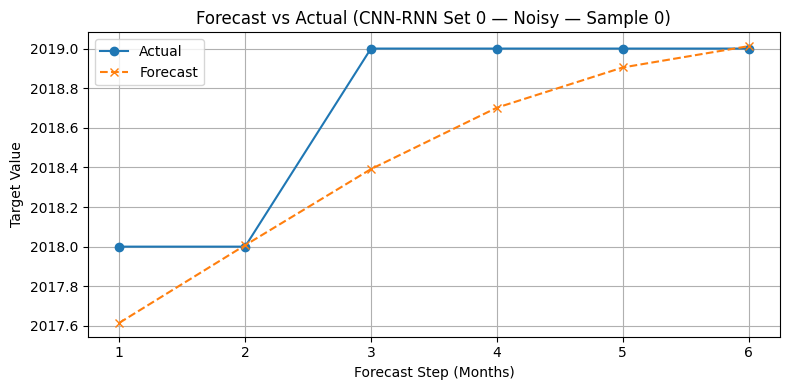

In [67]:
import torch
import matplotlib.pyplot as plt
import joblib
import numpy as np

#  Function to plot forecast
def plot_forecast_cnnrnn(model_path, test_loader, scaler_path, data_mode, sample_idx=0):
    # Initialize model with required args
    model = CNNRNNModel(
        input_dim=input_dim,
        output_dim=output_dim,
        output_seq_len=output_seq_len,
        dropout=0.3
    ).to(device)

    # Load model weights
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    # Fetch sample
    X_test_batch, y_test_batch = next(iter(test_loader))
    X_sample = X_test_batch[sample_idx:sample_idx+1].float().to(device)
    y_true = y_test_batch[sample_idx:sample_idx+1].float()

    with torch.no_grad():
        y_pred = model(X_sample).cpu().numpy()

    # Flatten for inverse transform
    y_scaler = joblib.load(scaler_path)
    y_pred_flat = y_pred.reshape(-1, output_dim)
    y_true_flat = y_true.numpy().reshape(-1, output_dim)

    # Pad
    if y_pred_flat.shape[1] < y_scaler.n_features_in_:
        pad_width = y_scaler.n_features_in_ - y_pred_flat.shape[1]
        y_pred_padded = np.pad(y_pred_flat, ((0, 0), (0, pad_width)), mode='constant')
        y_true_padded = np.pad(y_true_flat, ((0, 0), (0, pad_width)), mode='constant')

        y_pred_inv_full = y_scaler.inverse_transform(y_pred_padded)
        y_true_inv_full = y_scaler.inverse_transform(y_true_padded)

        y_pred_inv = y_pred_inv_full[:, :output_dim]
        y_true_inv = y_true_inv_full[:, :output_dim]
    else:
        y_pred_inv = y_scaler.inverse_transform(y_pred_flat)
        y_true_inv = y_scaler.inverse_transform(y_true_flat)

    # Plot forecast vs actual
    forecast_steps = min(6, y_pred_inv.shape[0])
    months = list(range(1, forecast_steps + 1))
    target_index = 0  # can change to visualize another feature

    plt.figure(figsize=(8, 4))
    plt.plot(months, y_true_inv[:forecast_steps, target_index], marker='o', label='Actual')
    plt.plot(months, y_pred_inv[:forecast_steps, target_index], marker='x', linestyle='--', label='Forecast')
    plt.title(f"Forecast vs Actual (CNN-RNN Set 0 — {data_mode.capitalize()} — Sample {sample_idx})")
    plt.xlabel("Forecast Step (Months)")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
# Clean
plot_forecast_cnnrnn(
    model_path="/content/drive/MyDrive/retail_forecasting_sequences/tune_cnnrnn_clean/set0/cnn_rnn_clean_set0.pt",
    test_loader=test_loader_clean,
    scaler_path="/content/drive/MyDrive/retail_forecasting_sequences/train_y_scaler.save",
    data_mode="clean",
    sample_idx=0
)

# Noisy
plot_forecast_cnnrnn(
    model_path="/content/drive/MyDrive/retail_forecasting_sequences_noisy/tune_cnnrnn_noisy/set0/cnn_rnn_noisy_set0.pt",
    test_loader=test_loader_noisy,
    scaler_path="/content/drive/MyDrive/retail_forecasting_sequences_noisy/train_noisy_y_scaler.save",
    data_mode="noisy",
    sample_idx=0
)


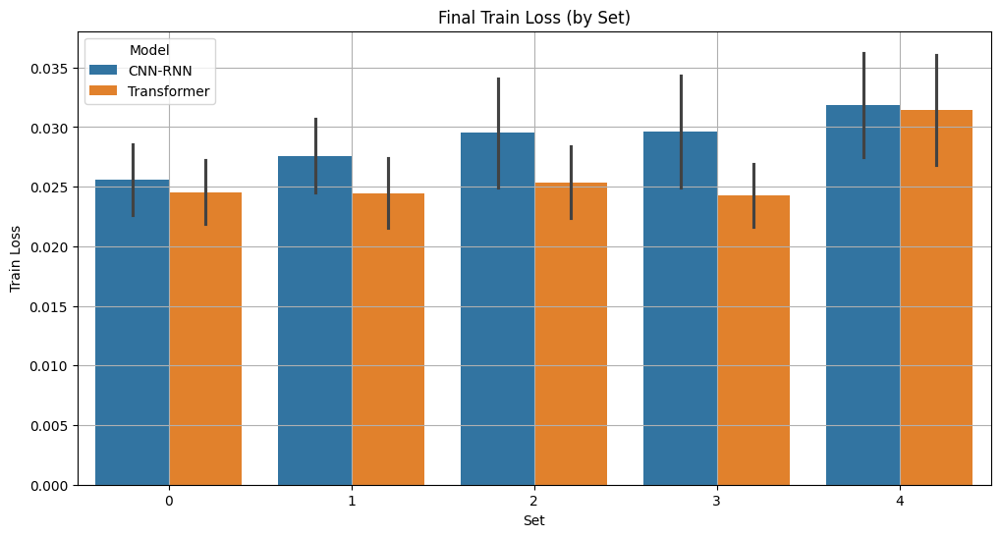

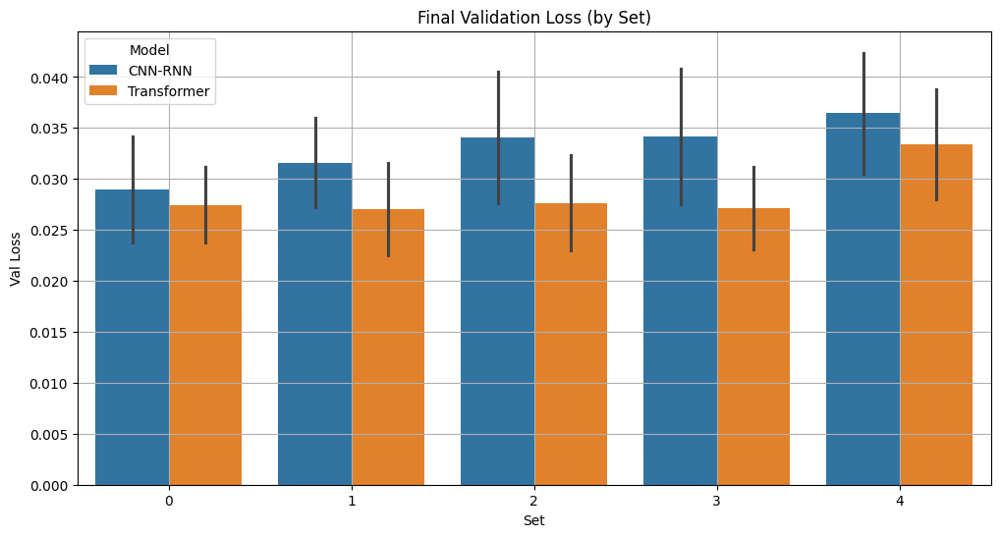

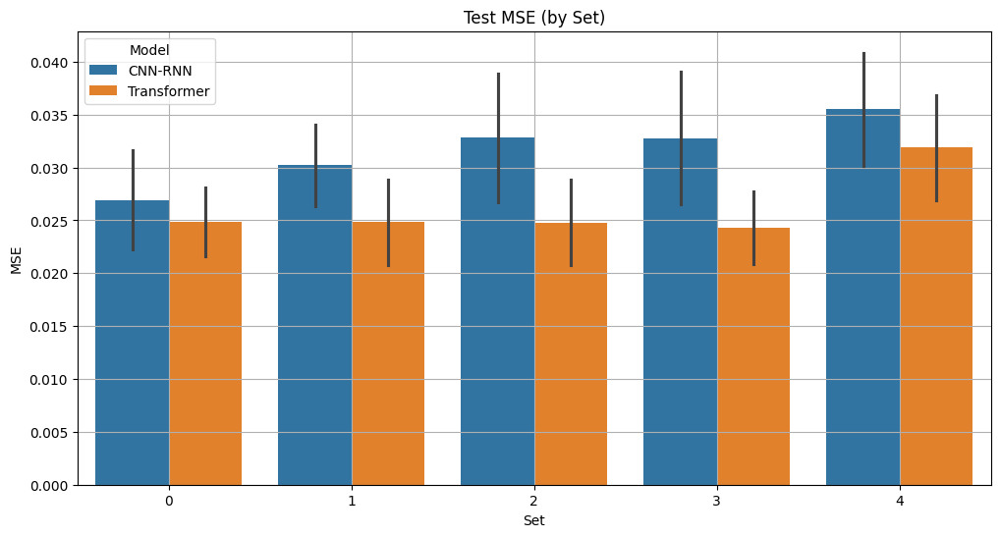

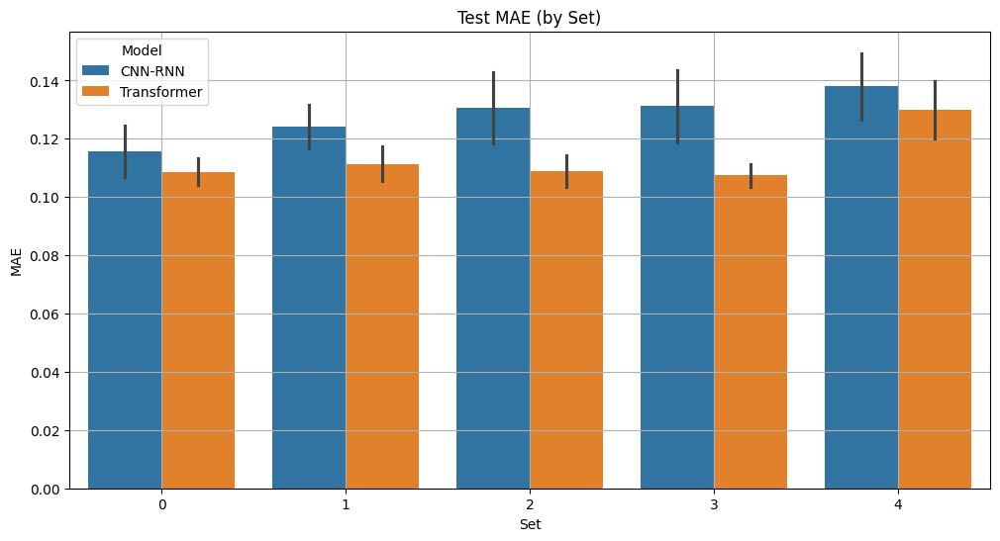

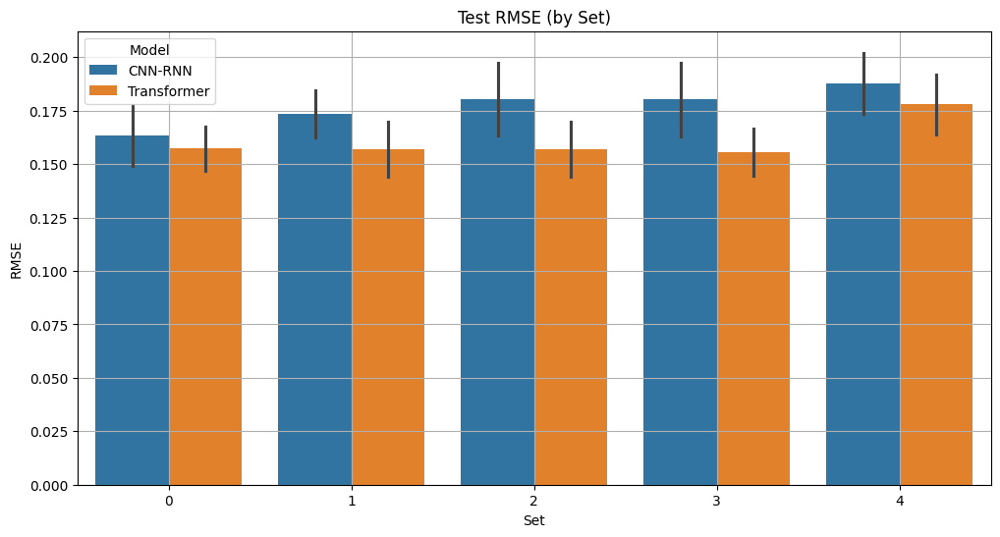

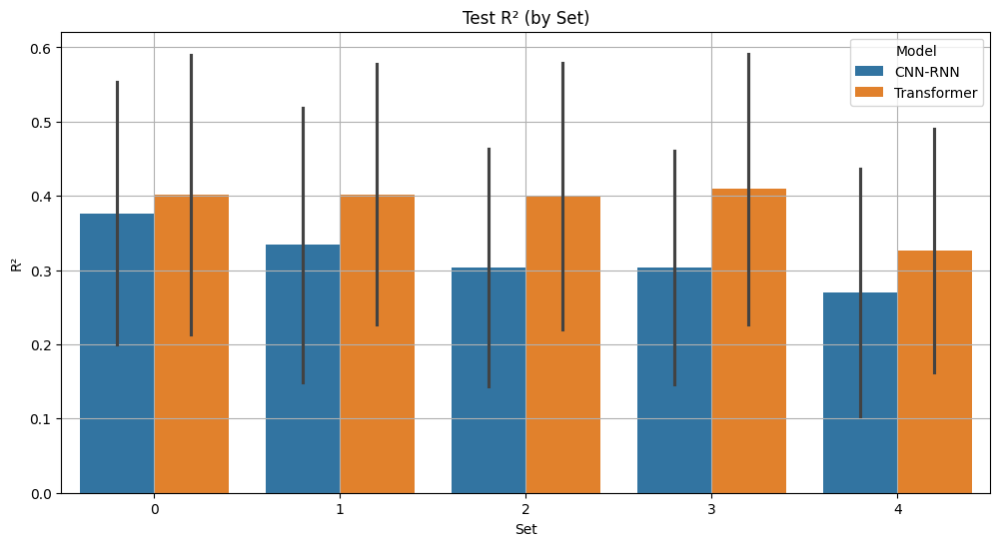

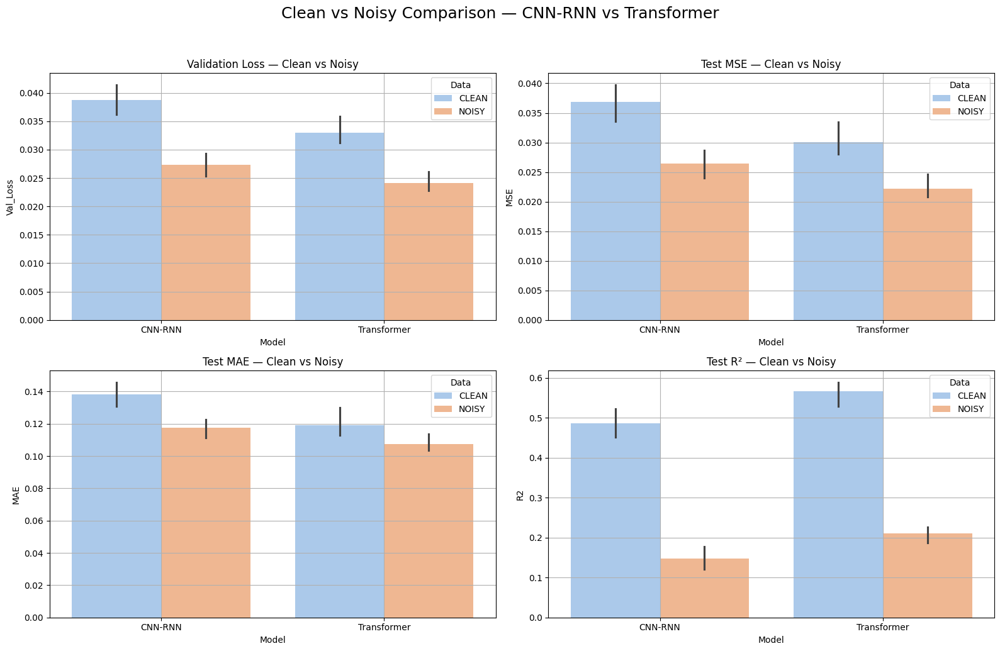

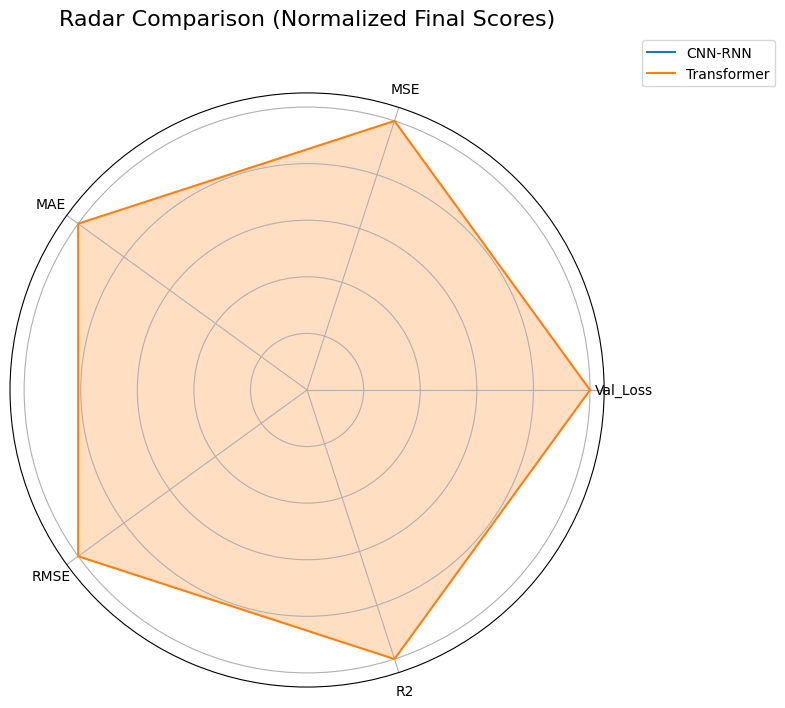

In [68]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
from math import pi

# Helper to convert results to DataFrame
def results_to_df(results, model_name):
    rows = []
    for res in results:
        rows.append({
            "Model": model_name,
            "Data": res["data_mode"].upper(),
            "Set": res["set"],
            "Train_Loss": res["train_losses"][-1],
            "Val_Loss": res["val_losses"][-1],
            "MSE": res["test_mse"],
            "MAE": res["test_mae"],
            "RMSE": res["test_rmse"],
            "R2": res["test_r2"]
        })
    return pd.DataFrame(rows)

# Convert both result sets
df_cnnrnn = results_to_df(results_cnnrnn, "CNN-RNN")
df_transformer = results_to_df(results_transformer, "Transformer")
df_all = pd.concat([df_cnnrnn, df_transformer])

#  Plot 1: Final Train vs Val Loss
plt.figure(figsize=(12, 6))
sns.barplot(data=df_all, x="Set", y="Train_Loss", hue="Model")
plt.title("Final Train Loss (by Set)")
plt.ylabel("Train Loss")
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(data=df_all, x="Set", y="Val_Loss", hue="Model")
plt.title("Final Validation Loss (by Set)")
plt.ylabel("Val Loss")
plt.grid(True)
plt.show()

#  Plot 2: Final Test Error Metrics
metrics = ["MSE", "MAE", "RMSE"]
for metric in metrics:
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_all, x="Set", y=metric, hue="Model")
    plt.title(f"Test {metric} (by Set)")
    plt.ylabel(metric)
    plt.grid(True)
    plt.show()

#  Plot 3: Test R²
plt.figure(figsize=(12, 6))
sns.barplot(data=df_all, x="Set", y="R2", hue="Model")
plt.title("Test R² (by Set)")
plt.ylabel("R²")
plt.grid(True)
plt.show()

# Plot 4: Clean vs Noisy Comparison by Model
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
compare_metrics = ["Val_Loss", "MSE", "MAE", "R2"]
titles = ["Validation Loss", "Test MSE", "Test MAE", "Test R²"]

for i, (metric, title) in enumerate(zip(compare_metrics, titles)):
    ax = axs[i//2][i%2]
    sns.barplot(data=df_all, x="Model", y=metric, hue="Data", ax=ax, palette="pastel")
    ax.set_title(f"{title} — Clean vs Noisy")
    ax.set_ylabel(metric)
    ax.grid(True)

plt.suptitle("Clean vs Noisy Comparison — CNN-RNN vs Transformer", fontsize=18, y=1.03)
plt.tight_layout()
plt.show()

# Plot 5: Radar Chart (Normalized)
# Create radar-ready df
radar_df = df_all.groupby("Model")[["Val_Loss", "MSE", "MAE", "RMSE", "R2"]].mean()
radar_df["Val_Loss"] = 1 / radar_df["Val_Loss"]
radar_df["MSE"] = 1 / radar_df["MSE"]
radar_df["MAE"] = 1 / radar_df["MAE"]
radar_df["RMSE"] = 1 / radar_df["RMSE"]
# R2 is kept as-is

# Normalize
radar_df_norm = (radar_df - radar_df.min()) / (radar_df.max() - radar_df.min())
labels = radar_df_norm.columns.tolist()
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]

# Radar plot
plt.figure(figsize=(8, 8))
for model in radar_df_norm.index:
    values = radar_df_norm.loc[model].tolist()
    values += values[:1]
    ax = plt.subplot(1, 1, 1, polar=True)
    ax.plot(angles, values, label=model)
    ax.fill(angles, values, alpha=0.25)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    ax.set_yticklabels([])
    ax.grid(True)

plt.title("Radar Comparison (Normalized Final Scores)", y=1.1, fontsize=16)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()


/tmp/ipython-input-73-3166567534.py:28: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(data=df, x="Model", y=metric, ax=ax, ci="sd", estimator=np.mean, palette="pastel")
/tmp/ipython-input-73-3166567534.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x="Model", y=metric, ax=ax, ci="sd", estimator=np.mean, palette="pastel")
/tmp/ipython-input-73-3166567534.py:28: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(data=df, x="Model", y=metric, ax=ax, ci="sd", estimator=np.mean, palette="pastel")
/tmp/ipython-input-73-3166567534.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect

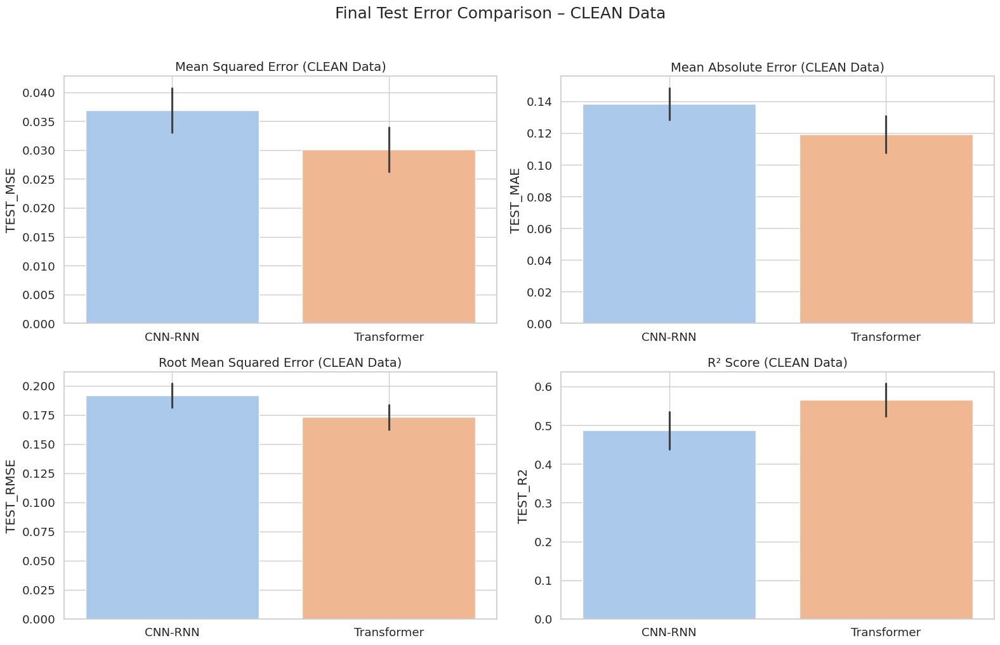

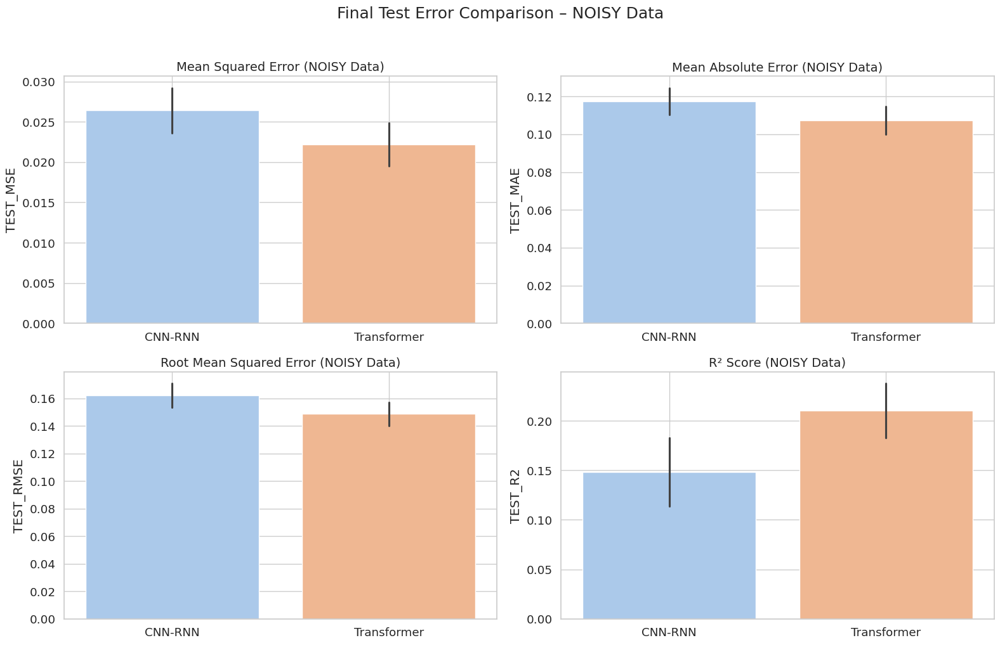

In [73]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Convert to DataFrames and label explicitly
df_cnnrnn = pd.DataFrame(results_cnnrnn)
df_cnnrnn["Model"] = "CNN-RNN"

df_transformer = pd.DataFrame(results_transformer)
df_transformer["Model"] = "Transformer"

# Combine all results
df_all = pd.concat([df_cnnrnn, df_transformer], ignore_index=True)

# Plotting settings
sns.set(style="whitegrid", font_scale=1.2)
metrics = ["test_mse", "test_mae", "test_rmse", "test_r2"]
titles = ["Mean Squared Error", "Mean Absolute Error", "Root Mean Squared Error", "R² Score"]

# Loop for clean and noisy
for mode in ["clean", "noisy"]:
    df = df_all[df_all["data_mode"] == mode]

    fig, axs = plt.subplots(2, 2, figsize=(16, 10))
    for i, (metric, title) in enumerate(zip(metrics, titles)):
        ax = axs[i//2][i%2]
        sns.barplot(data=df, x="Model", y=metric, ax=ax, ci="sd", estimator=np.mean, palette="pastel")
        ax.set_title(f"{title} ({mode.upper()} Data)", fontsize=14)
        ax.set_ylabel(metric.upper())
        ax.set_xlabel("")
        ax.grid(True)

    plt.suptitle(f"Final Test Error Comparison – {mode.upper()} Data", fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()


Best Model for both Clean and Noisy compared to all other models

GRU Forecasts for Clean Data (Set 1):


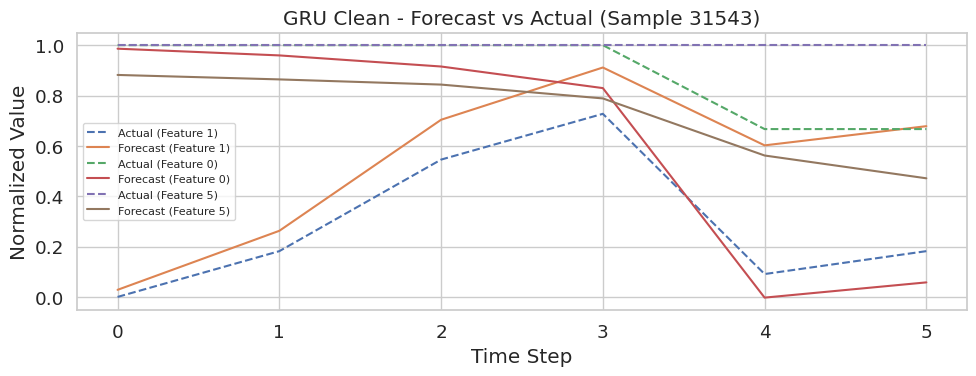

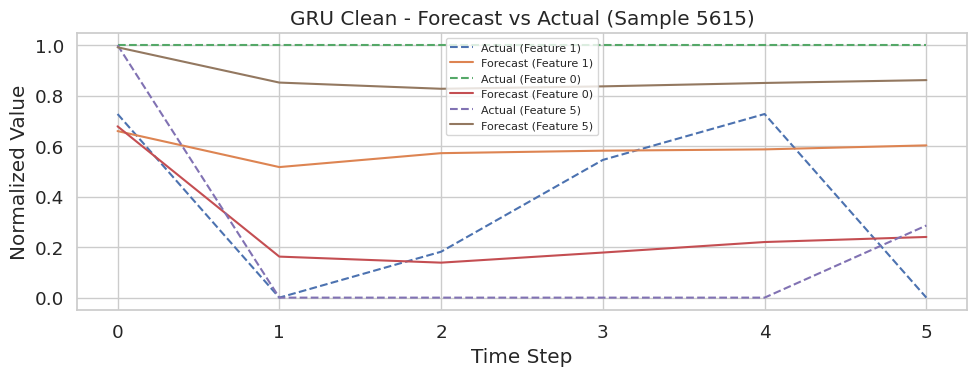

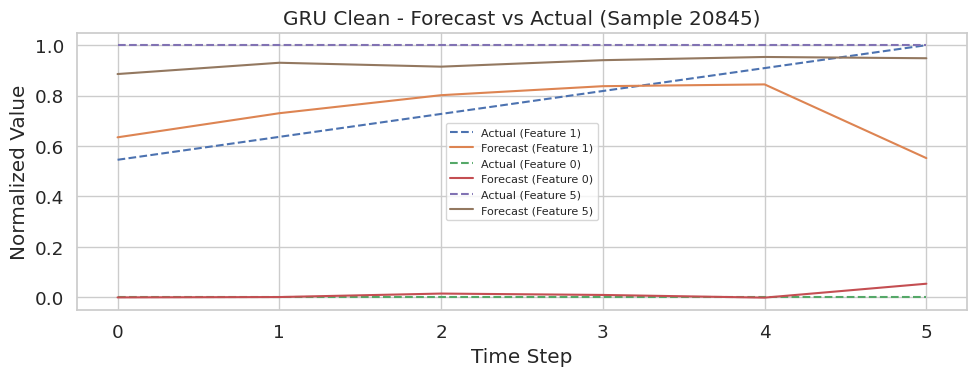

GRU Forecasts for Noisy Data (Set 1):


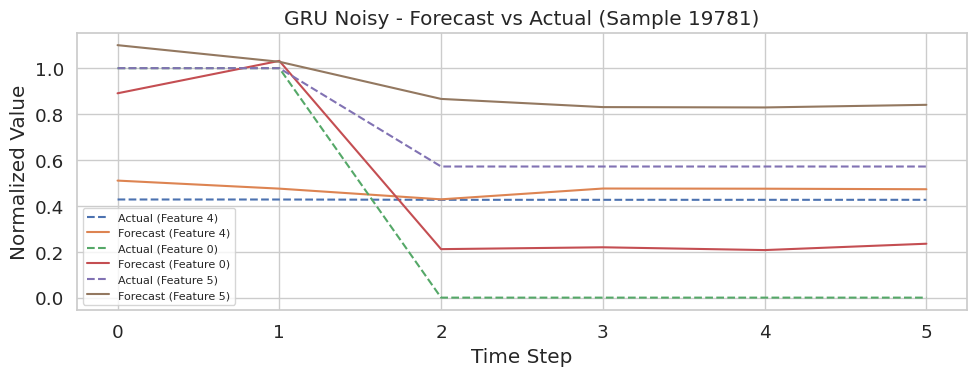

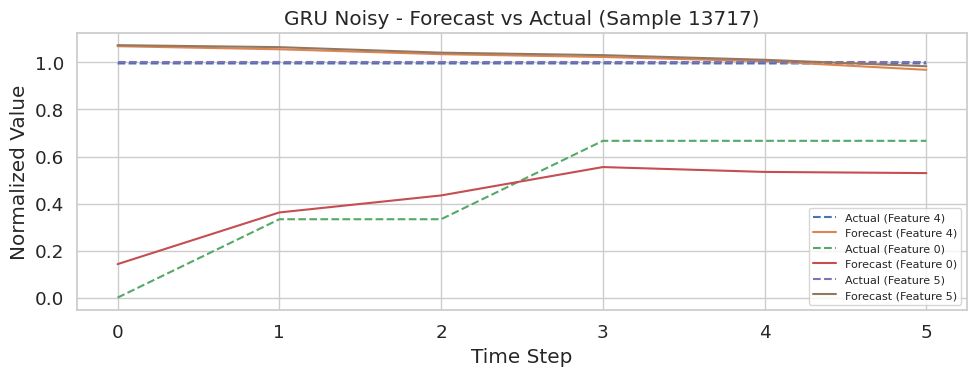

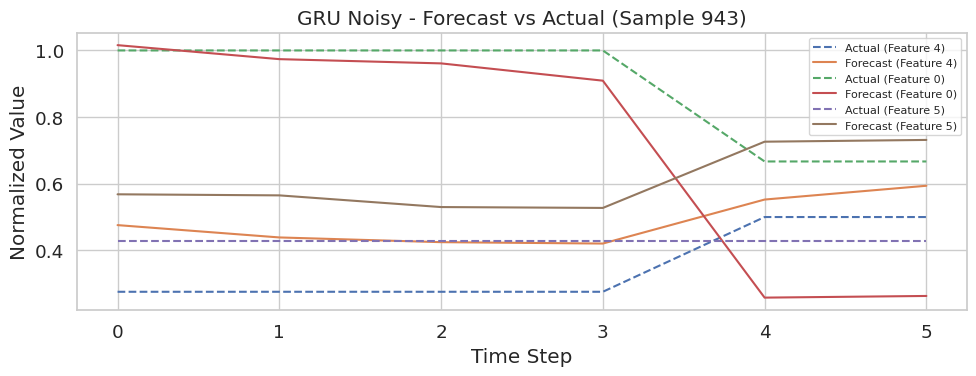

In [77]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
import random

# GRU Autoencoder Definition
class GRU_Autoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers, dropout, output_seq_len):
        super(GRU_Autoencoder, self).__init__()
        self.output_seq_len = output_seq_len
        self.encoder = nn.GRU(input_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout if num_layers > 1 else 0.0)
        self.decoder = nn.GRU(hidden_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout if num_layers > 1 else 0.0)
        self.output_layer = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        _, hidden = self.encoder(x)
        decoder_input = hidden[-1].unsqueeze(1).repeat(1, self.output_seq_len, 1)
        decoded_output, _ = self.decoder(decoder_input, hidden)
        return self.output_layer(decoded_output)

# Configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = X_test_clean.shape[2]
output_dim = y_test_clean.shape[2]
output_seq_len = y_test_clean.shape[1]
hidden_dim = 64
num_layers = 1
dropout = 0.1

# Load Pretrained Model
def load_model(path):
    model = GRU_Autoencoder(input_dim, hidden_dim, output_dim, num_layers, dropout, output_seq_len).to(device)
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()
    return model

model_clean = load_model("/content/drive/MyDrive/retail_forecasting_sequences/tuned_gru_clean/gru_clean_set1.pt")
model_noisy = load_model("/content/drive/MyDrive/retail_forecasting_sequences_noisy/tuned_gru_noisy/gru_noisy_set1.pt")

# Forecast Plot Function
def plot_forecast_vs_actual(model, X_test, y_test, title_prefix, top_k_features=3, num_samples=3):
    X_test_tensor = torch.tensor(X_test).float().to(device)
    with torch.no_grad():
        preds = model(X_test_tensor).cpu().numpy()

    y_test_np = np.array(y_test)
    indices = random.sample(range(len(X_test)), num_samples)

    # Identify top-k varying features
    feature_variances = np.var(y_test_np, axis=(0, 1))
    top_features = np.argsort(feature_variances)[-top_k_features:]

    for i in indices:
        plt.figure(figsize=(10, 4))
        for f in top_features:
            plt.plot(range(output_seq_len), y_test_np[i, :, f], '--', label=f"Actual (Feature {f})")
            plt.plot(range(output_seq_len), preds[i, :, f], label=f"Forecast (Feature {f})")
        plt.title(f"{title_prefix} - Forecast vs Actual (Sample {i})")
        plt.xlabel("Time Step")
        plt.ylabel("Normalized Value")
        plt.grid(True)
        plt.legend(fontsize=8)
        plt.tight_layout()
        plt.show()

# Run for Clean and Noisy
print("GRU Forecasts for Clean Data (Set 1):")
plot_forecast_vs_actual(model_clean, X_test_clean, y_test_clean, title_prefix="GRU Clean")

print("GRU Forecasts for Noisy Data (Set 1):")
plot_forecast_vs_actual(model_noisy, X_test_noisy, y_test_noisy, title_prefix="GRU Noisy")


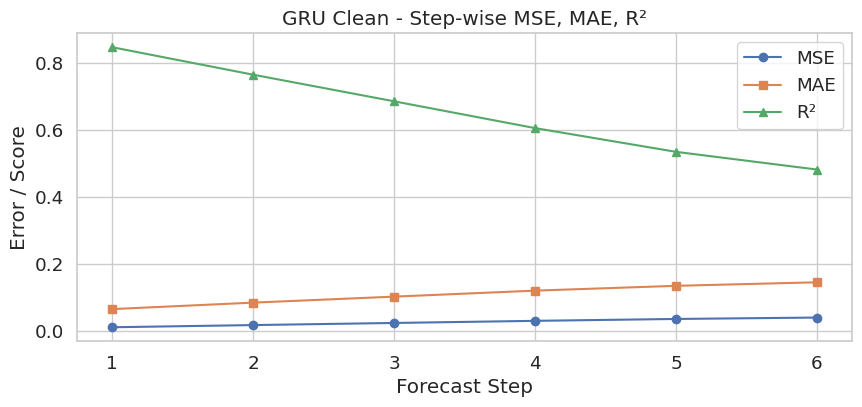

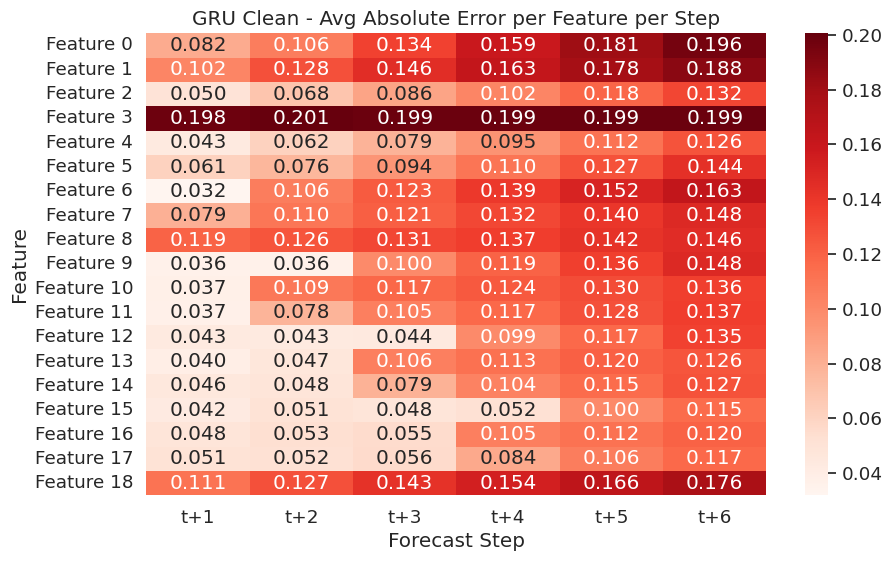

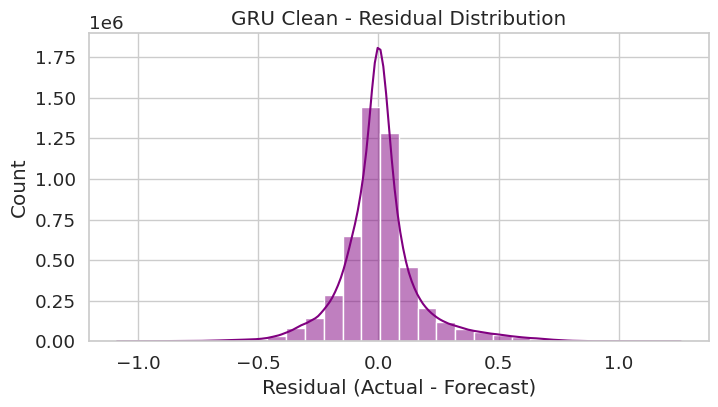

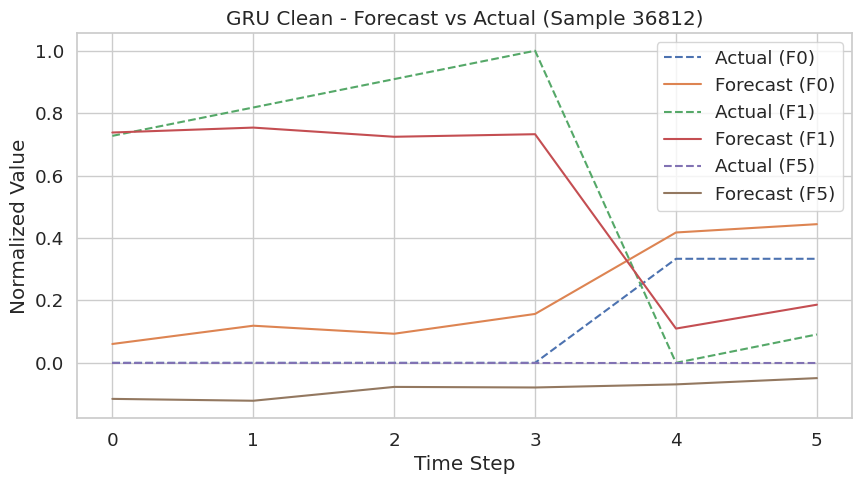

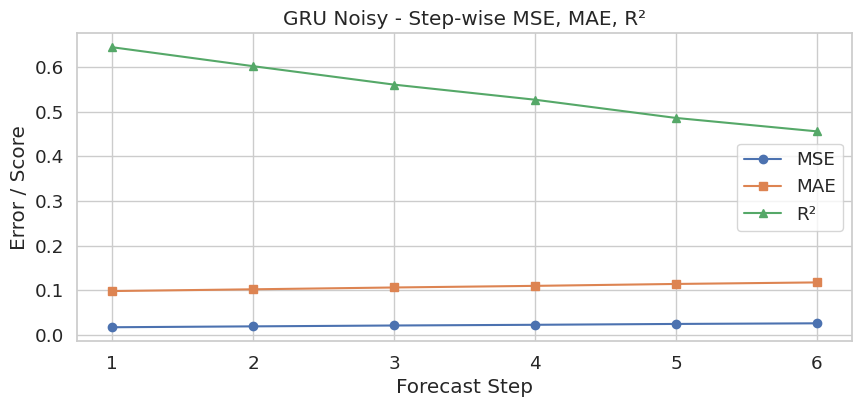

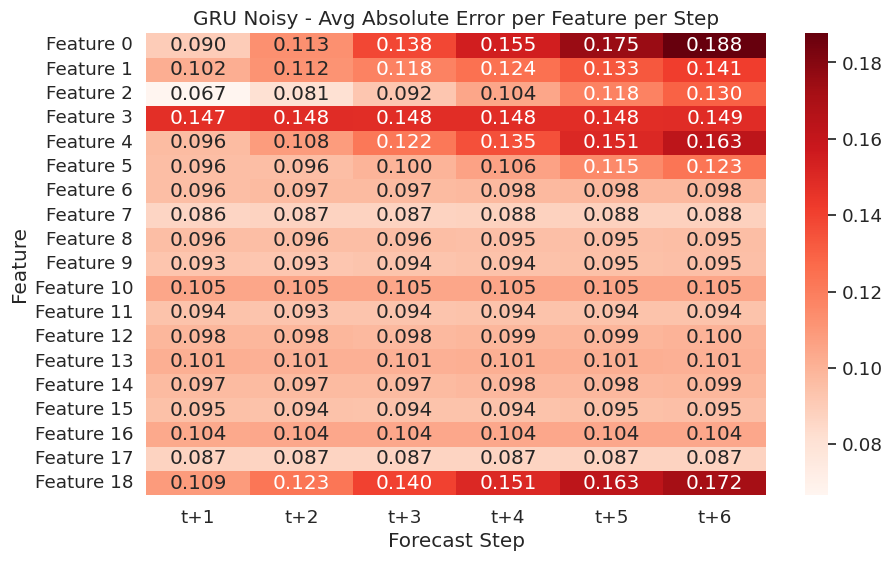

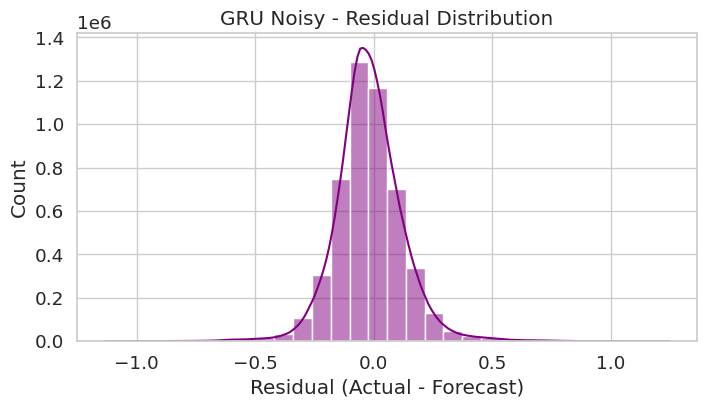

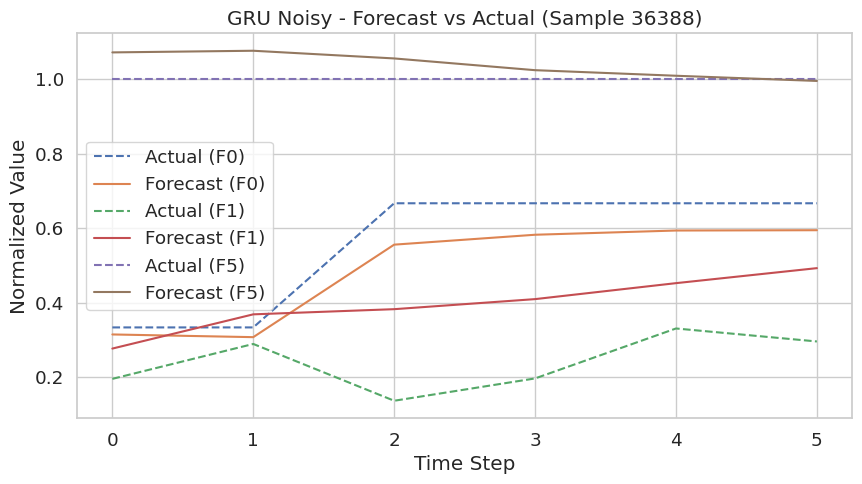

In [78]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# GRU Autoencoder Definition

class GRU_Autoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers, dropout, output_seq_len):
        super(GRU_Autoencoder, self).__init__()
        self.output_seq_len = output_seq_len
        self.encoder = nn.GRU(input_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout if num_layers > 1 else 0.0)
        self.decoder = nn.GRU(hidden_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout if num_layers > 1 else 0.0)
        self.output_layer = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        _, hidden = self.encoder(x)
        decoder_input = hidden[-1].unsqueeze(1).repeat(1, self.output_seq_len, 1)
        decoded_output, _ = self.decoder(decoder_input, hidden)
        return self.output_layer(decoded_output)

# Load Models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = X_test_clean.shape[2]
output_dim = y_test_clean.shape[2]
output_seq_len = y_test_clean.shape[1]
hidden_dim = 64
num_layers = 1
dropout = 0.1

def load_model(path):
    model = GRU_Autoencoder(input_dim, hidden_dim, output_dim, num_layers, dropout, output_seq_len).to(device)
    model.load_state_dict(torch.load(path, map_location=device))
    model.eval()
    return model

model_clean = load_model("/content/drive/MyDrive/retail_forecasting_sequences/tuned_gru_clean/gru_clean_set1.pt")
model_noisy = load_model("/content/drive/MyDrive/retail_forecasting_sequences_noisy/tuned_gru_noisy/gru_noisy_set1.pt")

# Predict
def predict(model, X):
    X_tensor = torch.tensor(X).float().to(device)
    with torch.no_grad():
        preds = model(X_tensor).cpu().numpy()
    return preds

y_pred_clean = predict(model_clean, X_test_clean)
y_pred_noisy = predict(model_noisy, X_test_noisy)

# Evaluation and Plots
def evaluate_forecast(y_true, y_pred, title_prefix=""):
    num_samples, forecast_horizon, num_features = y_true.shape

    # Step-wise metrics
    mse, mae, r2 = [], [], []
    for t in range(forecast_horizon):
        y_true_t = y_true[:, t, :].reshape(-1)
        y_pred_t = y_pred[:, t, :].reshape(-1)
        mse.append(mean_squared_error(y_true_t, y_pred_t))
        mae.append(mean_absolute_error(y_true_t, y_pred_t))
        r2.append(r2_score(y_true_t, y_pred_t))

    # Heatmap of absolute error
    abs_error = np.abs(y_pred - y_true).mean(axis=0)  # shape: (time, features)

    # Residual distribution
    residuals = (y_true - y_pred).reshape(-1)

    # Forecast vs Actual for 1 sample
    idx = np.random.randint(num_samples)
    features_to_plot = [0, 1, 5]

    # --- PLOTS ---
    # Step-wise MSE, MAE, R²
    steps = range(1, forecast_horizon + 1)
    plt.figure(figsize=(10, 4))
    plt.plot(steps, mse, label='MSE', marker='o')
    plt.plot(steps, mae, label='MAE', marker='s')
    plt.plot(steps, r2, label='R²', marker='^')
    plt.title(f"{title_prefix}Step-wise MSE, MAE, R²")
    plt.xlabel("Forecast Step")
    plt.ylabel("Error / Score")
    plt.grid(True)
    plt.legend()
    plt.show()

    # Heatmap of Absolute Errors
    plt.figure(figsize=(10, 6))
    sns.heatmap(abs_error.T, annot=True, fmt=".3f", cmap="Reds",
                xticklabels=[f"t+{i+1}" for i in range(forecast_horizon)],
                yticklabels=[f"Feature {i}" for i in range(num_features)])
    plt.title(f"{title_prefix}Avg Absolute Error per Feature per Step")
    plt.xlabel("Forecast Step")
    plt.ylabel("Feature")
    plt.show()

    # Residuals histogram
    plt.figure(figsize=(8, 4))
    sns.histplot(residuals, kde=True, bins=30, color='purple')
    plt.title(f"{title_prefix}Residual Distribution")
    plt.xlabel("Residual (Actual - Forecast)")
    plt.grid(True)
    plt.show()

    # Forecast vs Actual
    plt.figure(figsize=(10, 5))
    for d in features_to_plot:
        plt.plot(y_true[idx, :, d], linestyle='--', label=f"Actual (F{d})")
        plt.plot(y_pred[idx, :, d], label=f"Forecast (F{d})")
    plt.title(f"{title_prefix}Forecast vs Actual (Sample {idx})")
    plt.xlabel("Time Step")
    plt.ylabel("Normalized Value")
    plt.legend()
    plt.grid(True)
    plt.show()

# Run for Clean and Noisy
evaluate_forecast(y_test_clean, y_pred_clean, title_prefix="GRU Clean - ")
evaluate_forecast(y_test_noisy, y_pred_noisy, title_prefix="GRU Noisy - ")


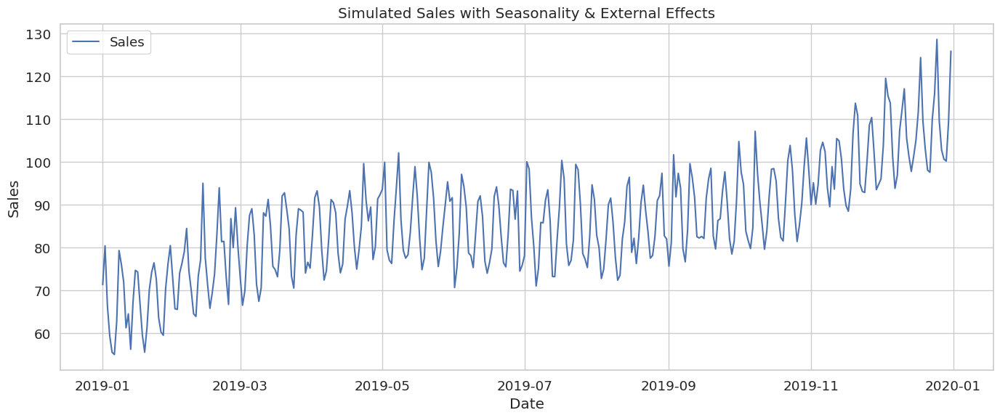

              dow_sin   dow_cos  month_sin  month_cos  promotion  temperature  \
dow_sin      1.000000  0.002664  -0.002040   0.006898   0.085467     0.000098   
dow_cos      0.002664  1.000000   0.000391   0.005098  -0.021017    -0.000047   
month_sin   -0.002040  0.000391   1.000000  -0.002398  -0.029737     0.953834   
month_cos    0.006898  0.005098  -0.002398   1.000000  -0.042495    -0.261836   
promotion    0.085467 -0.021017  -0.029737  -0.042495   1.000000    -0.022044   
temperature  0.000098 -0.000047   0.953834  -0.261836  -0.022044     1.000000   
sales        0.553689 -0.014718  -0.320986   0.171148   0.246579    -0.345430   

                sales  
dow_sin      0.553689  
dow_cos     -0.014718  
month_sin   -0.320986  
month_cos    0.171148  
promotion    0.246579  
temperature -0.345430  
sales        1.000000  


In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Create synthetic date range
np.random.seed(42)
days = pd.date_range(start='2019-01-01', periods=365)
df = pd.DataFrame({'date': days})
df['day_of_week'] = df['date'].dt.dayofweek
df['month'] = df['date'].dt.month

# 2. Simulate base demand with seasonality
df['trend'] = np.linspace(50, 100, len(df))
df['weekly_seasonality'] = 10 * np.sin(2 * np.pi * df['day_of_week'] / 7)
df['monthly_seasonality'] = 5 * np.sin(2 * np.pi * df['month'] / 12)
df['promotion'] = np.random.choice([0, 1], size=len(df), p=[0.85, 0.15])
df['temperature'] = 20 + 10 * np.sin(2 * np.pi * df['date'].dt.dayofyear / 365)

# 3. Combine all effects + noise
df['sales'] = (
    df['trend'] +
    df['weekly_seasonality'] +
    df['monthly_seasonality'] +
    8 * df['promotion'] +
    0.5 * df['temperature'] +
    np.random.normal(0, 2, size=len(df))
)

# 4. Encode seasonality for ML models (cyclical)
df['dow_sin'] = np.sin(2 * np.pi * df['day_of_week'] / 7)
df['dow_cos'] = np.cos(2 * np.pi * df['day_of_week'] / 7)
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

# 5. Final features for model input
features = ['dow_sin', 'dow_cos', 'month_sin', 'month_cos', 'promotion', 'temperature', 'sales']
model_df = df[features].copy()

# 6. Visualize effects
plt.figure(figsize=(14, 6))
plt.plot(df['date'], df['sales'], label='Sales')
plt.title("Simulated Sales with Seasonality & External Effects")
plt.xlabel("Date")
plt.ylabel("Sales")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Optional: view feature correlation
print(model_df.corr())


In [83]:
def get_forecast_dataframe(model, X_test, y_test):
    X_tensor = torch.tensor(X_test).float().to(device)
    with torch.no_grad():
        forecast = model(X_tensor).cpu().numpy()

    # Flatten across all samples and steps: (N, T, F) → (N*T, F)
    N, T, F = forecast.shape
    forecast_flat = forecast.reshape(-1, F)
    actual_flat = y_test.reshape(-1, F)

    # Create step labels
    step_ids = np.tile(np.arange(1, T+1), N)
    df = pd.DataFrame({
        "Step": step_ids
    })
    for i in range(F):
        df[f"Actual_F{i}"] = actual_flat[:, i]
        df[f"Forecast_F{i}"] = forecast_flat[:, i]

    return df
df_clean = get_forecast_dataframe(model_clean, X_test_clean, y_test_clean)
df_noisy = get_forecast_dataframe(model_noisy, X_test_noisy, y_test_noisy)


In [84]:
df_clean.to_csv("/content/drive/MyDrive/retail_forecasting_sequences/forecast_clean.csv", index=False)
df_noisy.to_csv("/content/drive/MyDrive/retail_forecasting_sequences_noisy/forecast_noisy.csv", index=False)

# JSON version
df_clean.to_json("/content/drive/MyDrive/retail_forecasting_sequences/forecast_clean.json", orient="records", lines=True)


In [86]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np

def compute_error_metrics_by_step(df, prefix="Forecast"):
    steps = sorted(df['Step'].unique())
    features = [col for col in df.columns if col.startswith(f"{prefix}_F")]

    summary = []
    for step in steps:
        row = {"Step": step}
        df_step = df[df['Step'] == step]
        for f in features:
            actual = df_step[f.replace("Forecast", "Actual")].values
            forecast = df_step[f].values

            mae = mean_absolute_error(actual, forecast)
            mse = mean_squared_error(actual, forecast)
            rmse = np.sqrt(mse)
            r2 = r2_score(actual, forecast)

            base_name = f"{f}"  # e.g., Forecast_F1
            row[f"MAE_{base_name}"] = mae
            row[f"MSE_{base_name}"] = mse
            row[f"RMSE_{base_name}"] = rmse
            row[f"R2_{base_name}"] = r2
        summary.append(row)

    return pd.DataFrame(summary)
# For Clean Model
error_summary_clean = compute_error_metrics_by_step(df_clean)
error_summary_clean.to_csv("/content/drive/MyDrive/retail_forecasting_sequences/error_summary_clean.csv", index=False)

In [88]:
def generate_llma_summary(error_df, model_name="GRU Clean"):
    features = sorted(set(col.split("_")[-1] for col in error_df.columns if col.startswith("MAE")))
    summary_lines = [f" Summary for {model_name} Model\n"]

    for feature in features:
        mae_col = f"MAE_Forecast_{feature}"
        rmse_col = f"RMSE_Forecast_{feature}"
        r2_col = f"R2_Forecast_{feature}"

        avg_mae = error_df[mae_col].mean()
        avg_rmse = error_df[rmse_col].mean()
        avg_r2 = error_df[r2_col].mean()

        summary_lines.append(f"**Feature {feature}**:")
        summary_lines.append(f" Average MAE over forecast horizon: {avg_mae:.4f}")
        summary_lines.append(f" Average RMSE over forecast horizon: {avg_rmse:.4f}")
        summary_lines.append(f"  Average R² Score: {avg_r2:.4f}")

        if avg_r2 > 0.8:
            summary_lines.append("High predictive power.")
        elif avg_r2 > 0.5:
            summary_lines.append("Moderate predictive power.")
        else:
            summary_lines.append("Low predictive performance.")

        summary_lines.append("")  # empty line for spacing

    return "\n".join(summary_lines)
import pandas as pd

error_df_clean = pd.read_csv("/content/drive/MyDrive/retail_forecasting_sequences/error_summary_clean.csv")
llma_clean = generate_llma_summary(error_df_clean, model_name="GRU Clean")
print(llma_clean)

 Summary for GRU Clean Model

**Feature F0**:
 Average MAE over forecast horizon: 0.1431
 Average RMSE over forecast horizon: 0.2143
  Average R² Score: 0.6362
Moderate predictive power.

**Feature F1**:
 Average MAE over forecast horizon: 0.1508
 Average RMSE over forecast horizon: 0.2076
  Average R² Score: 0.5576
Moderate predictive power.

**Feature F10**:
 Average MAE over forecast horizon: 0.1088
 Average RMSE over forecast horizon: 0.1537
  Average R² Score: 0.4502
Low predictive performance.

**Feature F11**:
 Average MAE over forecast horizon: 0.1002
 Average RMSE over forecast horizon: 0.1395
  Average R² Score: 0.6141
Moderate predictive power.

**Feature F12**:
 Average MAE over forecast horizon: 0.0802
 Average RMSE over forecast horizon: 0.1190
  Average R² Score: 0.7745
Moderate predictive power.

**Feature F13**:
 Average MAE over forecast horizon: 0.0918
 Average RMSE over forecast horizon: 0.1329
  Average R² Score: 0.5713
Moderate predictive power.

**Feature F14**:
